<a href="https://colab.research.google.com/github/BrainConnection/Dynamical_Decoupling_Project/blob/main/4.%20Measurement%20Induced%20Dephasing%20Practice%20fail.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Environment Setting

In [3]:
!pip install qutip
!pip install numpy
!pip install matplotlib
!pip install scipy

In [4]:
from qutip import *
import numpy as np
import matplotlib.pyplot as plt
import scipy.interpolate
from scipy.optimize import curve_fit
from numpy.random import uniform

# 10. Measurement Induced Dephasing Dynamical Decoupling (n:0.001~0.01)

###1) Hamiltonian & Function Setting

Lab Frame

$H_0 = -\frac{\omega_q}{2}\sigma_z + \omega_r a^\dagger a + g\sigma_x(a+a^\dagger)$

$H_1 = A(t) (\hat{a} + \hat{a}^\dagger) \cos{(\omega_{rd} t)}$

$H_2 = B(t) \sigma_x \cos{(\omega_{qd} t)}$

Rotating Frame

$H_0 = -\frac{\omega_q-\omega_{qd}}{2}\sigma_z + ({\omega_r-\omega_{rd}})a^\dagger a + \chi\sigma_z(a^\dagger a)$

$H_1 = \frac{A(t)}{2} (\hat{a} + \hat{a}^\dagger) $

$H_2 = \frac{B(t)}{2}  \sigma_x $

In [5]:
# operator
N = 100

omega_r = 2 * np.pi * 7.0  # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0  # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 7.0  # qubit frequency in units of GHz
g = 2 * np.pi * 0.1        # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.01   # external coupling rate of resonator in units of GHz

In [6]:
sz = sigmaz()
sx = sigmax()
sy = sigmay()

sp = basis(2,1)*basis(2,0).dag()
sm = basis(2,0)*basis(2,1).dag()

a = destroy(N)

In [7]:
sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
sm_composite = tensor(sm, qeye(N))

annihilate_composite = tensor(qeye(2), a)
create_composite = tensor(qeye(2), a.dag())
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sx_composite, sy_composite, sz_composite, sp_composite, sm_composite, annihilate_composite, create_composite, number_composite]

psi_20 = tensor(basis(2,0), basis(N,0))
psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), basis(N,0))
psi_21 = tensor(basis(2,1), basis(N,0))

In [8]:
H0 = -0.5*(omega_q-omega_rd)*sz_composite + (omega_r-omega_rd)*number_composite + g*tensor(sx, a + a.dag())

H1 = 0.5*tensor(qeye(2), a + a.dag())

H2_x = 0.5*sx_composite

In [9]:
# single pi & half pi square pulse for drive

def Pi_Square(t, args, T_cent):

    A = args['A']

    return A * (t > T_cent-0.5*np.pi/A) * (t < T_cent+0.5*np.pi/A)

def Half_Pi_Square(t, args, T_cent):

    A = args['A']

    return 0.5 * A * (t > T_cent-0.5*np.pi/A) * (t < T_cent+0.5*np.pi/A)

In [10]:
# time-dependent envelope for drive

def Hrd_env(Env, Is_Pi):

  if (Env==0 and Is_Pi==0):
    return Half_Pi_Square

  elif (Env==0 and Is_Pi==1):
    return Pi_Square

# time-dependent function for drive

def Hrd_rot(f, t, args, T_cent):

    Omega_rd = args['Omega_rd']
    Phi = args['Phi']

    return f(t, args, T_cent) * np.cos(Omega_rd * t + Phi)

In [11]:
# Modulate each pulse timing
# pulse list
# pi/2 pulse at T_srt, T_end
# pi pulse at pulse time list

def Pulse_Timing(T_srt, T_end, N, Func):

    T = T_end - T_srt

    Seq_list = []

    if (Func==2) :
      shift = 0
      for i in range(N):
        shift = shift + T * np.sin(np.pi/(2*(N+2))) * np.sin(np.pi*(i+1)/(N+2)) / np.cos(np.pi/(2*(N+2)))
        Seq_list.append(T_srt + shift)

    else :
      for i in range(N):
        Seq_list.append(T_srt + (2*i+1)*T/(2*N))

    Seq = np.array(Seq_list)

    return Seq

In [12]:
# time-dependent envelope for qubit drive (rotating frame)

# args

# A (amplitude)
# Omega_rd (frequency)
# T_srt (pulse start time)
# T_end (pulse end time)
# N (number of pulse)
# Env (0: square envelope, 1: cosine envelope, 2: gaussian envelope)
# Func (0: CP, 1: CPMG, 2: UDD)

def Hqd_rotating_frame(t, args):

    T_srt = args['T_srt']
    T_end = args['T_end']
    N = args['N_seq']
    Env = args['Env']
    Func = args['Func']

    B = args['B']


    # T_cent
    Seq = Pulse_Timing(T_srt, T_end, N, Func)


    f = Hrd_env(Env, 0)
    pulse = f(t, {'A': B}, T_srt)

    for T_cent in Seq:
      f = Hrd_env(Env, 1)
      pulse = pulse + f(t, {'A': B}, T_cent)

    f = Hrd_env(Env, 0)
    pulse = pulse + f(t, {'A': B}, T_end)

    return pulse

In [13]:
# time-dependent coefficient for resonator drive

def Hrd_rotating_frame(t, args):
    """
    Envelope function for the readout drive
    """
    A = args['A'] # amplitude of the readout drive
    T_srt = args['T_srt'] # duration of the readout drive, in units of ns
    T_end = args['T_end'] # duration of the readout drive, in units of ns

    return A * (T_srt <= t) * (t <= T_end)

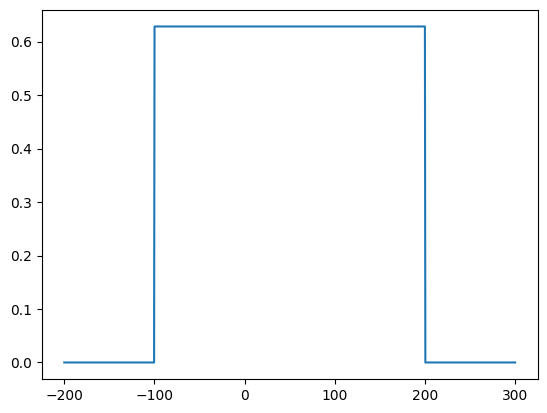

In [14]:
# resonator pulse simulation (rotating frame)
tlist = np.linspace(-200, 300, 1000)
plt.figure()
plt.plot(tlist, Hrd_rotating_frame(tlist, {'A': 2*np.pi*0.1, 'T_srt': -100, 'T_end': 200}))

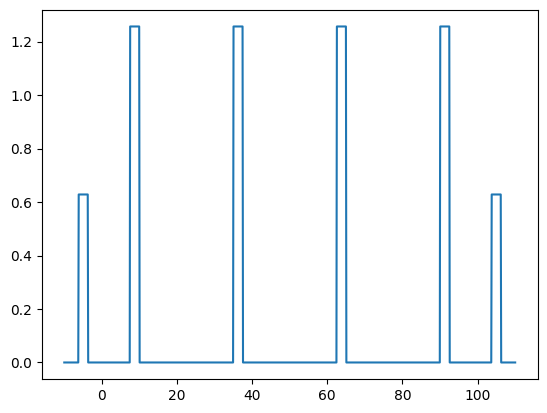

In [15]:
# qubit pulse simulation (rotating frame)
tlist = np.linspace(-10, 110, 1000)
plt.figure()
plt.plot(tlist, Hqd_rotating_frame(tlist, {'B': 2*np.pi*0.2, 'T_srt': -5, 'T_end': 105, 'N_seq': 4, 'Env': 0, 'Func': 0}))

### 2) Photon Number n

kappa = 2 * np.pi * 0.01

In [23]:
A = [0.006, 0.009, 0.011, 0.0128, 0.0143, 0.01555, 0.01675, 0.01785, 0.01895, 0.020]

In [24]:
N = 5

omega_r = 2 * np.pi * 7.0  # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0  # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 7.0 # qubit frequency in units of GHz
g = 2 * np.pi * 0.1        # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.01   # external coupling rate of resonator in units of GHz

sz = sigmaz()
sx = sigmax()
sy = sigmay()
sp = basis(2,1)*basis(2,0).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
annihilate_composite = tensor(qeye(2), a)
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sx_composite, sy_composite, sz_composite, sp_composite, annihilate_composite, number_composite]

psi_20 = tensor(basis(2,0), basis(N,0))
psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), basis(N,0))
psi_21 = tensor(basis(2,1), basis(N,0))

H0 = (omega_r-omega_rd)*number_composite + g*tensor(sz, a.dag()*a)
H1 = 0.5*tensor(qeye(2), a + a.dag())
H2 = 0.5*sx_composite

tlist = np.linspace(0, 1000, 10000)

In [25]:
plus_list = []
alpha_list = []
n_list = []
for i in range(10):
  result = mesolve(
    [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'B': 2*np.pi*0.1, 'T_srt': -20, 'T_end': 50*20+20, 'N_seq': 0, 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T': 1500},
    e_ops = op_list,
    options = Options(nsteps = 100000, atol = 1e-10, rtol = 1e-8)
  )

  plus_list.append(result.expect[3])
  alpha_list.append(result.expect[4])
  n_list.append(result.expect[5])

Text(0, 0.5, 'Off Diagonal Term Expectation Value')

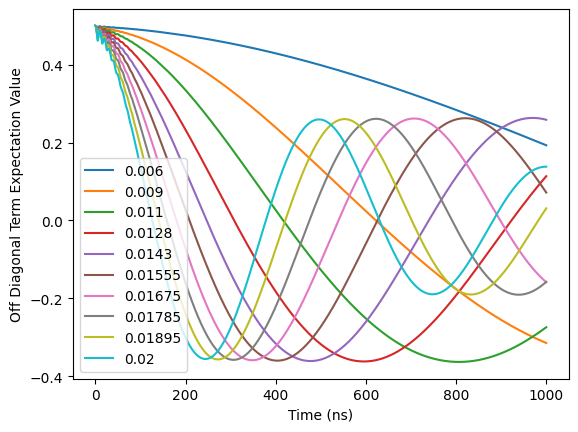

In [26]:
# Plot off-diagonal term expectation value

fig, ax = plt.subplots(1, 1)

for i in range(10):
  ax.plot(tlist, plus_list[i], label = '{0}'.format(A[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Off Diagonal Term Expectation Value')

Text(0, 0.5, 'Photon Number Expectation Value')

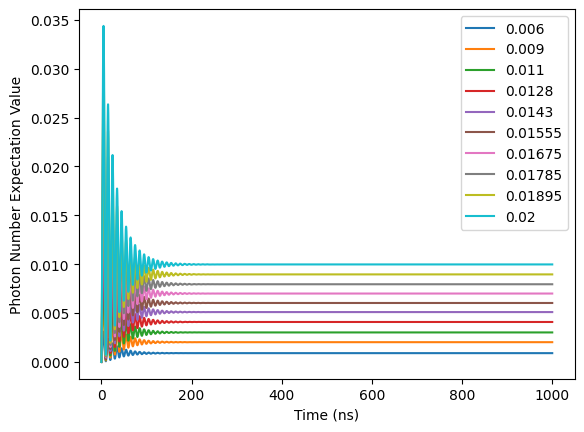

In [27]:
# Plot photon number expectation value

fig, ax = plt.subplots(1, 1)

for i in range(10):
  ax.plot(tlist, n_list[i], label = '{0}'.format(A[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Photon Number Expectation Value')

In [28]:
for i in range(10):
  print(alpha_list[i][-1])

(1.1026528407530768e-18-0.001496259348830049j)
(1.2989255868387922e-17-0.0022443890237595432j)
(8.120535987997525e-18-0.0027431421393241976j)
(1.7319909261822688e-17-0.003192019942854907j)
(-4.633125744047283e-17-0.0035660847828393244j)
(1.562966349417801e-17-0.0038778054805204366j)
(-7.508642674943953e-18-0.00417705734963183j)
(7.399156263244852e-17-0.0044513715613576635j)
(2.2380318594423537e-17-0.004725685775593943j)
(1.5543062853922537e-17-0.004987531156016474j)


In [29]:
for i in range(10):
  print(n_list[i][-1])

0.0008977556092980397
0.002019950121383623
0.003017456353256733
0.004085785526854564
0.005099501239460509
0.0060299875222094455
0.006996571060633905
0.007945698237024039
0.008955174544750939
0.009975062312033725


### 3) Photon Number n

kappa = 2 * np.pi * 0.005

In [ ]:
A = [0.006875, 0.0089375, 0.01115625, 0.0125, 0.01425, 0.0155, 0.01675, 0.018, 0.019, 0.020]

In [ ]:
N = 5

omega_r = 2 * np.pi * 7.0   # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0   # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 7.0  # qubit frequency in units of GHz
g = 2 * np.pi * 0.1         # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.005   # external coupling rate of resonator in units of GHz

sz = sigmaz()
sx = sigmax()
sy = sigmay()
sp = basis(2,1)*basis(2,0).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
annihilate_composite = tensor(qeye(2), a)
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sx_composite, sy_composite, sz_composite, sp_composite, number_composite]

psi_20 = tensor(basis(2,0), basis(N,0))
psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), basis(N,0))
psi_21 = tensor(basis(2,1), basis(N,0))

H0 = (omega_r-omega_rd)*number_composite + g*tensor(sz, a.dag()*a)
H1 = 0.5*tensor(qeye(2), a + a.dag())
H2 = 0.5*sx_composite

tlist = np.linspace(0, 1000, 10000)

In [ ]:
plus_list = []
n_list = []
for i in range(10):
  result = mesolve(
    [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'B': 2*np.pi*0.1, 'T_srt': -20, 'T_end': 50*20+20, 'N_seq': 0, 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T': 1500},
    e_ops = op_list,
    options = Options(nsteps = 100000, atol = 1e-10, rtol = 1e-8)
  )

  plus_list.append(result.expect[3])
  n_list.append(result.expect[4])

Text(0, 0.5, 'Off Diagonal Term Expectation Value')

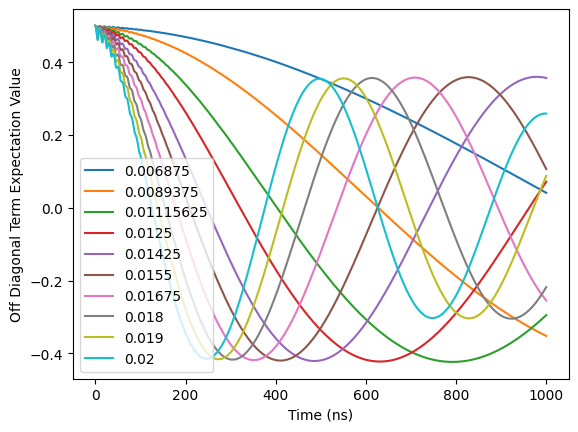

In [ ]:
# Plot off-diagonal term expectation value

fig, ax = plt.subplots(1, 1)

for i in range(10):
  ax.plot(tlist, plus_list[i], label = '{0}'.format(A[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Off Diagonal Term Expectation Value')

Text(0, 0.5, 'Photon Number Expectation Value')

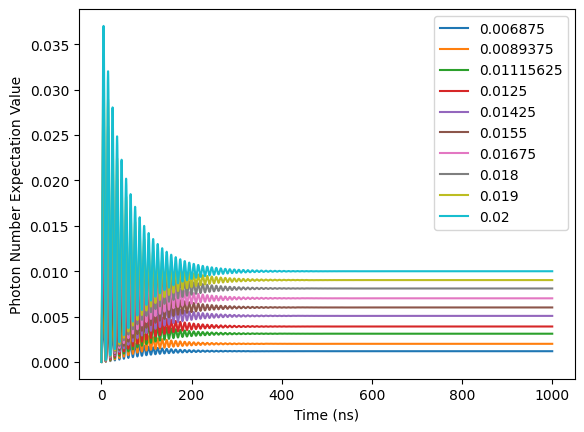

In [ ]:
# Plot photon number expectation value

fig, ax = plt.subplots(1, 1)

for i in range(10):
  ax.plot(tlist, n_list[i], label = '{0}'.format(A[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Photon Number Expectation Value')

In [ ]:
for i in range(10):
  print(n_list[i][-1])

0.001180902204970869
0.001995724726395008
0.0031096034115386893
0.0039038089418660786
0.005073390100397723
0.006002496627691125
0.007009679332857433
0.008094938215074954
0.009019360167426821
0.009993750871148555


### 4) Off Diagonal Term Evolution B=0.05GHz

Resonator Dissipation Rate : $\kappa = 2π · 0.01$

Initial State $\frac{|0\rangle+|1\rangle}{\sqrt{2}}$

Result :


In [30]:
A =     [0.006, 0.009, 0.011, 0.0128, 0.0143, 0.01555, 0.01675, 0.01785, 0.01895, 0.020]
n_exp = [0.0008977556109724049, 0.0020199501246811894, 0.0030174563590501468, 0.004085785535923369, 0.005099501246168652, 0.0060299875295233675, 0.00699657106885641, 0.007945698247830878, 0.008955174551725745, 0.009975062323819343]
alpha_exp = [(1.1026528407530768e-18-0.001496259348830049j), (1.2989255868387922e-17-0.0022443890237595432j), (8.120535987997525e-18-0.0027431421393241976j), (1.7319909261822688e-17-0.003192019942854907j), (-4.633125744047283e-17-0.0035660847828393244j), (1.562966349417801e-17-0.0038778054805204366j), (-7.508642674943953e-18-0.00417705734963183j), (7.399156263244852e-17-0.0044513715613576635j), (2.2380318594423537e-17-0.004725685775593943j), (1.5543062853922537e-17-0.004987531156016474j)]
N_seq = [0,1,2,4,6,8]
tau_list = [50*(k+2) for k in range(19)]

z_tot = []
plus_tot = []

In [31]:
N = 5

omega_r = 2 * np.pi * 7.0  # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0  # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 7.0 # qubit frequency in units of GHz
g = 2 * np.pi * 0.1        # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.01   # external coupling rate of resonator in units of GHz

sz = sigmaz()
sx = sigmax()
sy = sigmay()
sp = basis(2,1)*basis(2,0).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
annihilate_composite = tensor(qeye(2), a)
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sz_composite, sp_composite]

In [32]:
# iterate for photon number n
for i in range(10):

  psi_20 = tensor(basis(2,0), basis(N,0))
  psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), coherent(N, alpha_exp[i]))
  psi_21 = tensor(basis(2,1), basis(N,0))

  H0 = (omega_r-omega_rd)*number_composite + g*tensor(sz, a.dag()*a)
  H1 = 0.5*tensor(qeye(2), a + a.dag())
  H2 = 0.5*sx_composite

  z_n = []
  plus_n = []


  # iterate for pi-pulse time N
  for j in range(6):

    z = []
    plus = []


    # iterate for evolution time 50ns ~ 1000ns
    for k in range(19):

      # Simulation
      tlist = np.linspace(0, 50*(k+2), 500*(k+2))

      result = mesolve(
        [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
        psi_2s,
        tlist,
        c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
        args = {'B': 2*np.pi*0.05, 'T_srt': -10, 'T_end': 50*(k+2)+10, 'N_seq': N_seq[j], 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T_srt': 0, 'T_end': 1500},
        e_ops = op_list,
        options = Options(nsteps = 5000*(k+2), atol = 1e-10, rtol = 1e-8)
      )

      z_sub = result.expect[0]
      plus_sub = result.expect[1]

      z.append(z_sub[-1])
      plus.append(np.abs(2*plus_sub[-1]))

    z_n.append(z)
    plus_n.append(plus)

  z_tot.append(z_n)
  plus_tot.append(plus_n)

  print(i)

/usr/local/lib/python3.10/dist-packages/qutip/solver/options.py:16: FutureWarning: Dedicated options class are no longer needed, options should be passed as dict to solvers.
  warnings.warn(


0


KeyboardInterrupt: 

In [ ]:
tlist = np.linspace(0, 1000, 10000)
plt.plot(tlist, result.expect[1], label = 'n=1, N=8')
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

In [ ]:
tlist = np.linspace(0, 1000, 10000)
plt.plot(tlist, result.expect[0], label = 'n=1, N=8')
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

#### n=0.1

Text(0, 0.5, 'Decoherence')

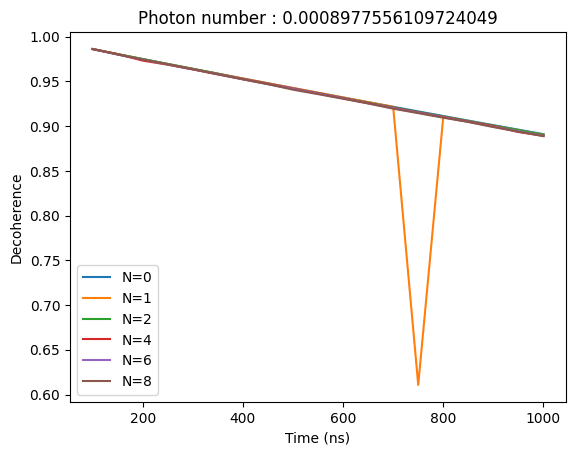

In [33]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[0][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('Photon number : {0}'.format(n_exp[0]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

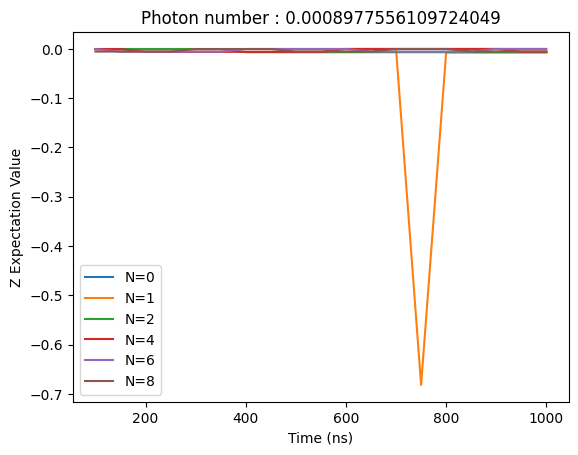

In [34]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[0][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[0]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.2

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[1][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[1]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[1][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[1]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.3

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[2][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[2]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[2][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[2]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.4

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[3][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[3]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[3][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[3]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.5

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[4][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[4]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[4][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[4]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.6

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[5][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[5]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[5][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[5]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.7

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[6][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[6]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[6][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[6]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.8

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[7][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[7]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[7][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[7]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.9

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[8][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[8]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[8][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[8]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=1.0

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[9][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[9][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

### 5) Off Diagonal Term Evolution B=0.05GHz with AC Stark Shift Detune

Resonator Dissipation Rate : $\kappa = 2π · 0.01$

Initial State $\frac{|0\rangle+|1\rangle}{\sqrt{2}}$

Result :


In [ ]:
A =     [0.006, 0.009, 0.011, 0.0128, 0.0143, 0.01555, 0.01675, 0.01785, 0.01895, 0.020]
n_exp = [0.0008977556109724049, 0.0020199501246811894, 0.0030174563590501468, 0.004085785535923369, 0.005099501246168652, 0.0060299875295233675, 0.00699657106885641, 0.007945698247830878, 0.008955174551725745, 0.009975062323819343]
N_seq = [0,1,2,4,6,8]
tau_list = [50*(k+2) for k in range(19)]

z_tot = []
plus_tot = []

In [ ]:
N = 5

omega_r = 2 * np.pi * 7.0  # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0  # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 7.0 # qubit frequency in units of GHz
g = 2 * np.pi * 0.1        # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.01   # external coupling rate of resonator in units of GHz
kai = g*g/(omega_r-omega_q)

sz = sigmaz()
sx = sigmax()
sy = sigmay()
sp = basis(2,1)*basis(2,0).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
annihilate_composite = tensor(qeye(2), a)
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sz_composite, sp_composite]

psi_20 = tensor(basis(2,0), basis(N,0))
psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), basis(N,0))
psi_21 = tensor(basis(2,1), basis(N,0))

In [ ]:
# iterate for photon number n
for i in range(10):

  H0 = +kai*n_exp[i]*sz_composite + (omega_r-omega_rd)*number_composite + g*tensor(sz, a.dag()*a)
  H1 = 0.5*tensor(qeye(2), a + a.dag())
  H2 = 0.5*sx_composite

  z_n = []
  plus_n = []


  # iterate for pi-pulse time N
  for j in range(6):

    z = []
    plus = []


    # iterate for evolution time 50ns ~ 1000ns
    for k in range(19):

      # Simulation
      tlist = np.linspace(0, 50*(k+2), 500*(k+2))

      result = mesolve(
        [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
        psi_2s,
        tlist,
        c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
        args = {'B': 2*np.pi*0.05, 'T_srt': -10, 'T_end': 50*(k+2)+10, 'N_seq': N_seq[j], 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T_srt': 0, 'T_end': 1500},
        e_ops = op_list,
        options = Options(nsteps = 5000*(k+2), atol = 1e-10, rtol = 1e-8)
      )

      z_sub = result.expect[0]
      plus_sub = result.expect[1]

      z.append(z_sub[-1])
      plus.append(np.abs(2*plus_sub[-1]))

    z_n.append(z)
    plus_n.append(plus)

  z_tot.append(z_n)
  plus_tot.append(plus_n)

  print(i)

0
1
2
3
4
5
6
7
8
9


Text(0, 0.5, 'Decoherence')

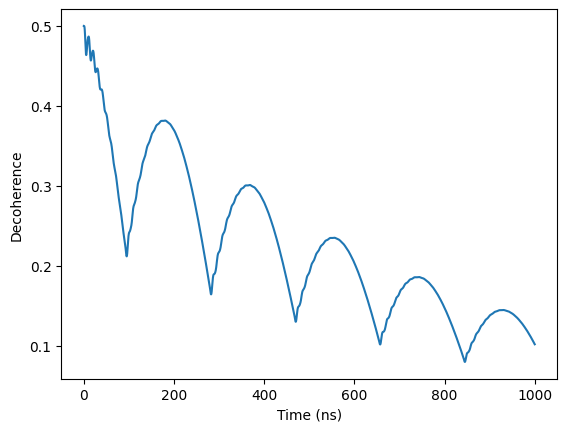

In [ ]:
tlist = np.linspace(0, 1000, 10000)
plt.plot(tlist, result.expect[1], label = 'n=1, N=8')
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Decoherence')

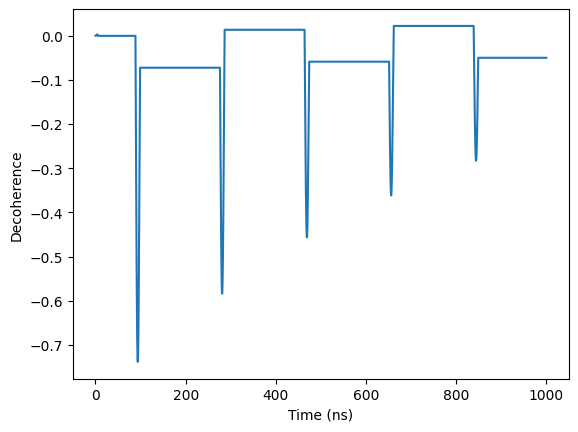

In [ ]:
tlist = np.linspace(0, 1000, 10000)
plt.plot(tlist, result.expect[0], label = 'n=1, N=8')
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

#### n=0.1

Text(0, 0.5, 'Decoherence')

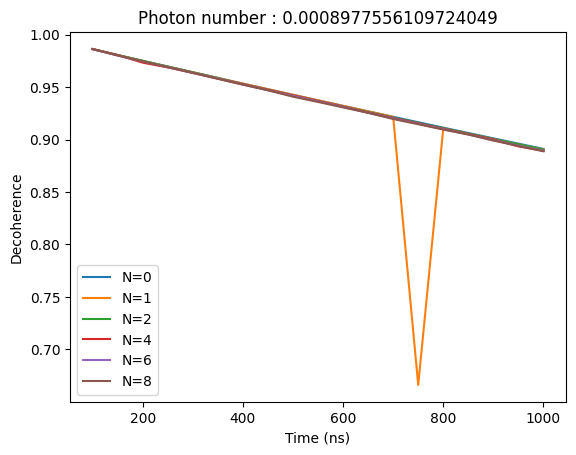

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[0][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[0]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

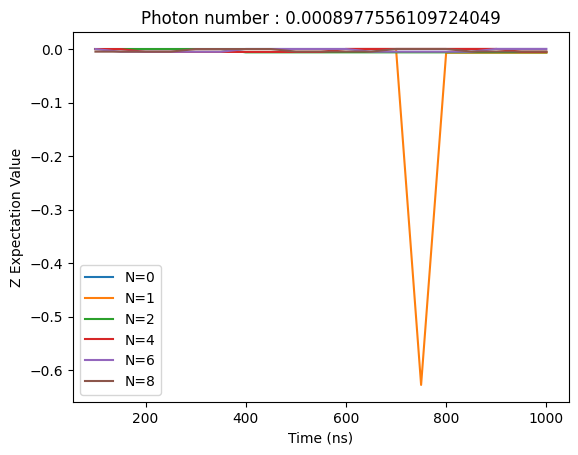

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[0][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[0]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.2

Text(0, 0.5, 'Decoherence')

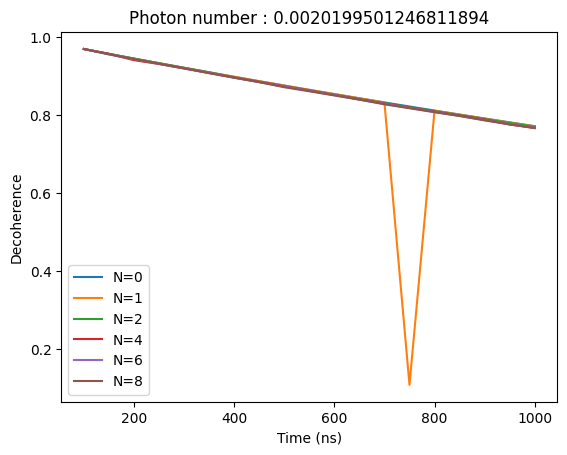

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[1][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[1]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

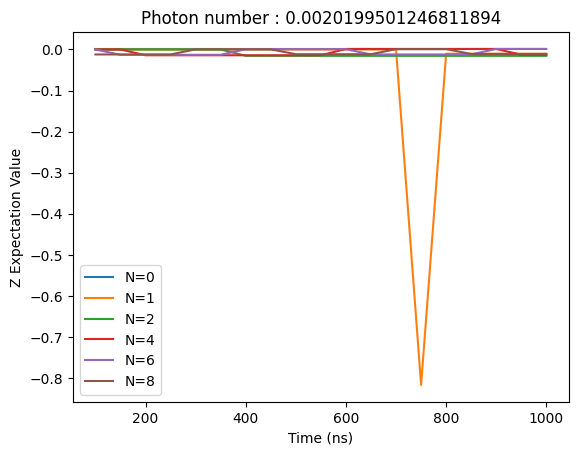

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[1][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[1]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.3

Text(0, 0.5, 'Decoherence')

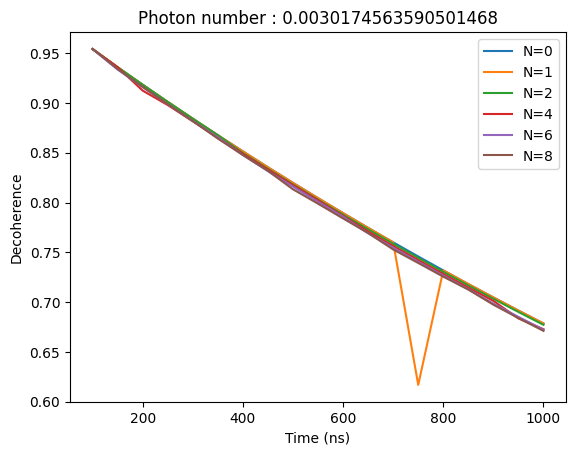

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[2][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[2]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

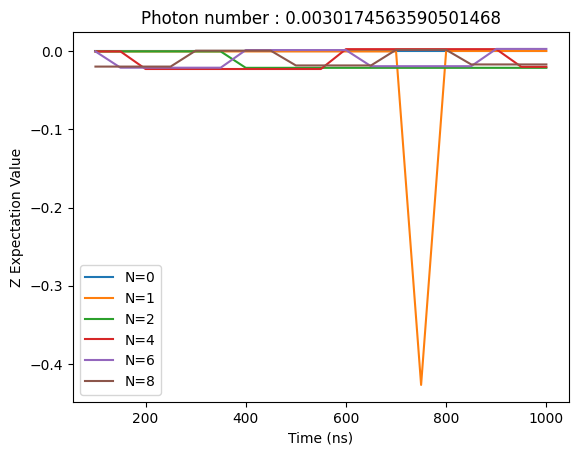

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[2][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[2]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.4

Text(0, 0.5, 'Decoherence')

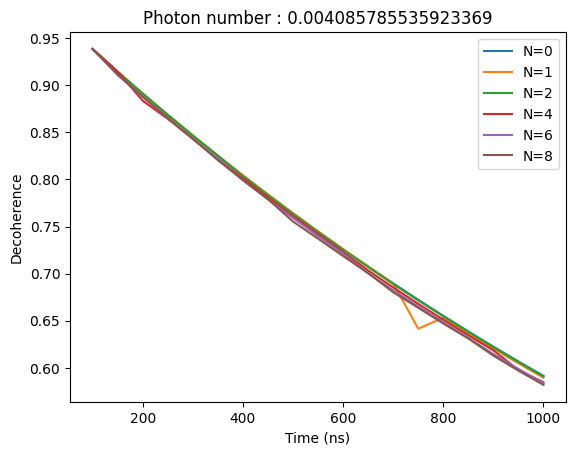

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[3][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[3]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

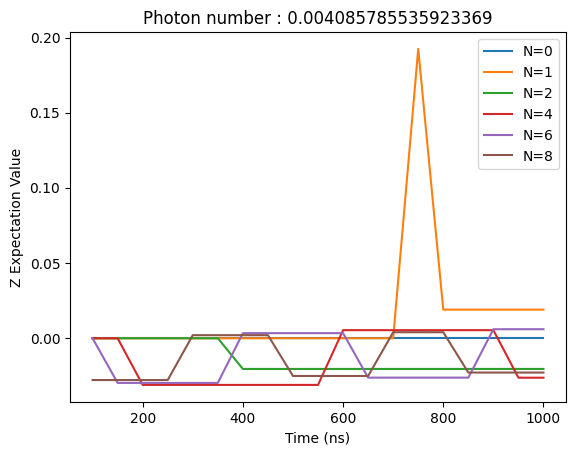

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[3][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[3]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.5

Text(0, 0.5, 'Decoherence')

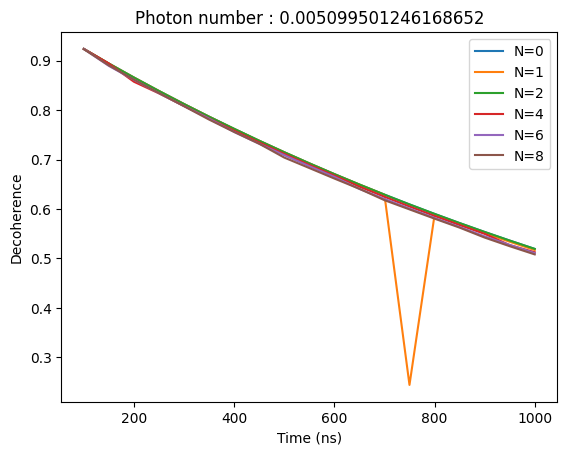

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[4][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[4]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

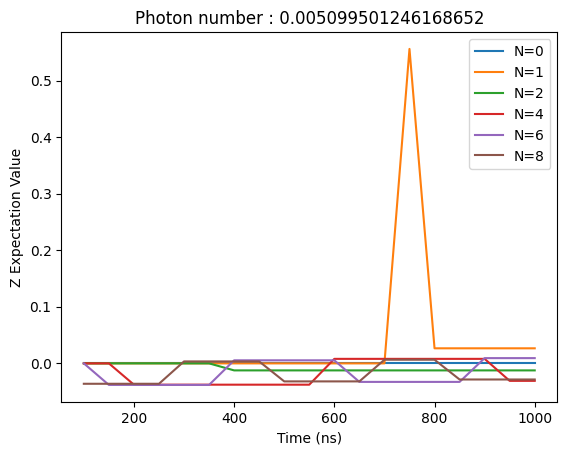

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[4][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[4]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.6

Text(0, 0.5, 'Decoherence')

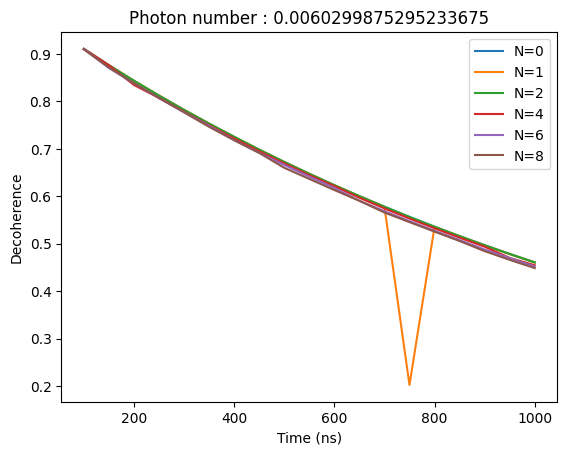

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[5][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[5]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

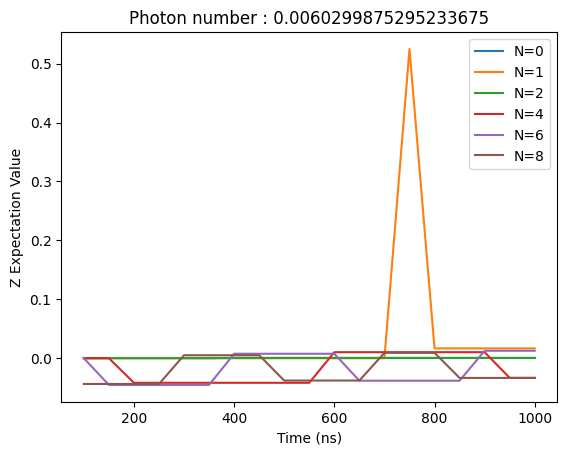

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[5][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[5]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.7

Text(0, 0.5, 'Decoherence')

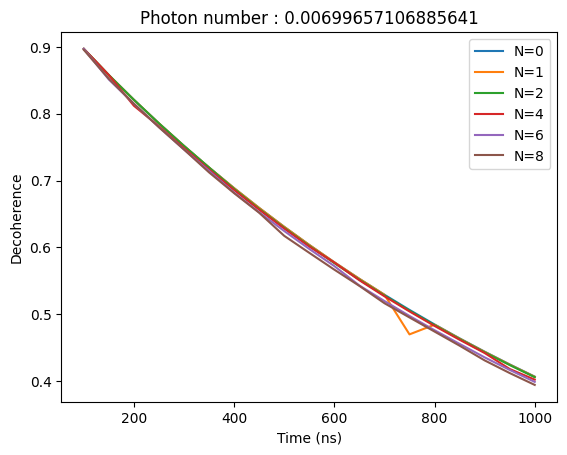

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[6][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[6]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

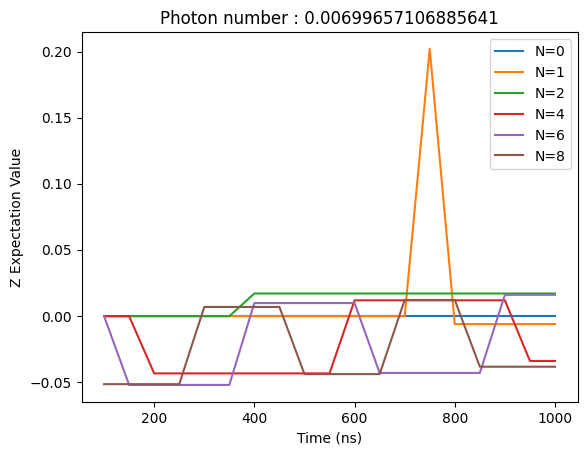

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[6][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[6]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.8

Text(0, 0.5, 'Decoherence')

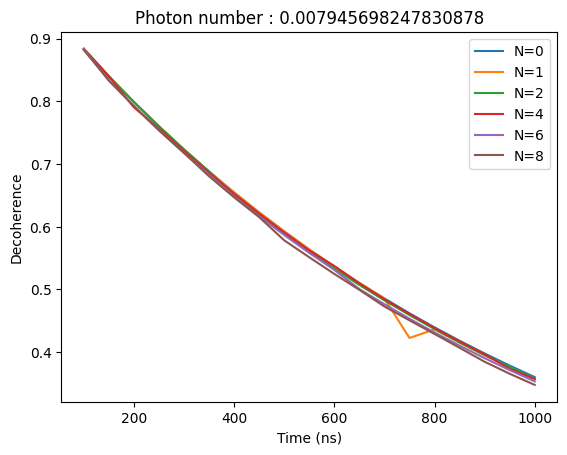

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[7][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[7]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

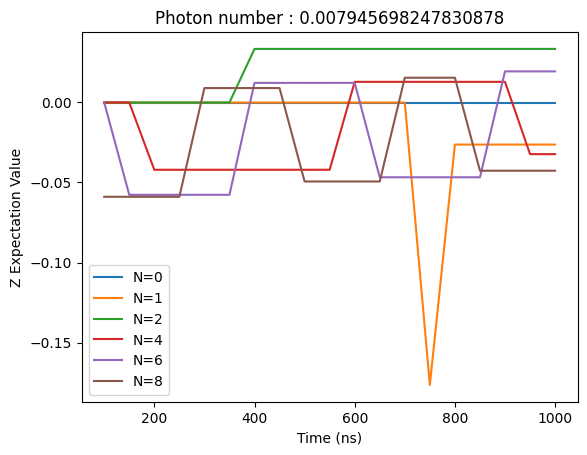

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[7][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[7]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.9

Text(0, 0.5, 'Decoherence')

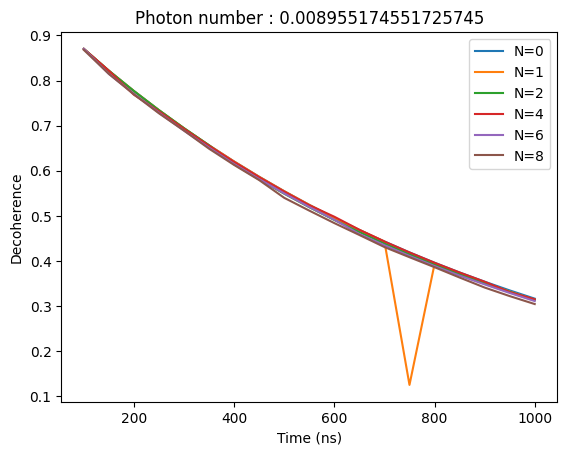

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[8][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[8]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

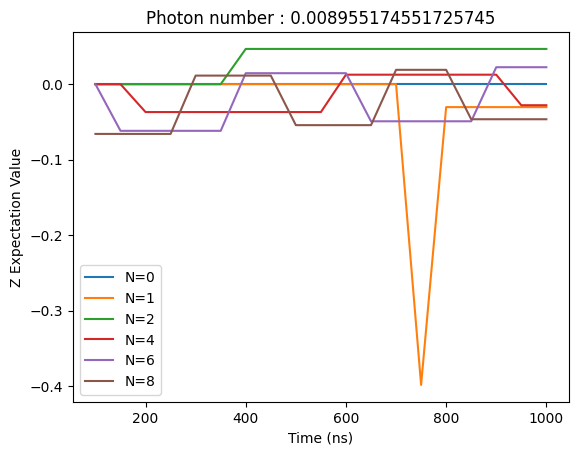

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[8][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[8]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=1.0

Text(0, 0.5, 'Decoherence')

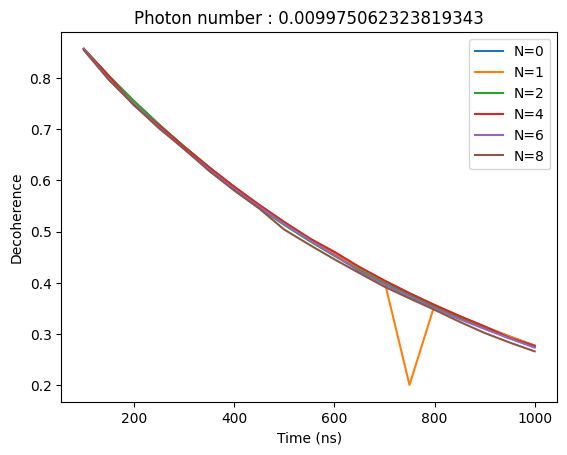

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[9][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

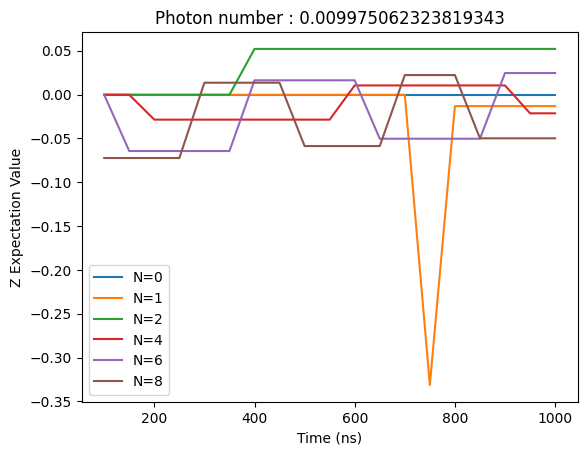

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[9][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

### 7) Off Diagonal Term Evolution B=0.05GHz with AC Stark Shift Detune

Resonator Dissipation Rate : $\kappa = 2π · 0.005$

Initial State $\frac{|0\rangle+|1\rangle}{\sqrt{2}}$

Result :


In [ ]:
A = [0.06875, 0.089375, 0.1115625, 0.125, 0.1425, 0.155, 0.1675, 0.18, 0.19, 0.20]
n_exp = [0.11809022049712097, 0.1995724726379507, 0.31096034099563086, 0.3903808927435874, 0.5073389924801157, 0.6002495775359179, 0.7009675738080133, 0.8094924783448024, 0.9019324465319741, 0.9993661624167768]
N_seq = [0,1,2,4,6,8]
tau_list = [50*(k+2) for k in range(19)]

z_tot = []
plus_tot = []

In [ ]:
N = 10

omega_r = 2 * np.pi * 7.0  # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0  # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 7.0 # qubit frequency in units of GHz
g = 2 * np.pi * 0.1        # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.005  # external coupling rate of resonator in units of GHz

sz = sigmaz()
sx = sigmax()
sy = sigmay()
sp = basis(2,1)*basis(2,0).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
annihilate_composite = tensor(qeye(2), a)
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sz_composite, sp_composite]

psi_20 = tensor(basis(2,0), basis(N,0))
psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), basis(N,0))
psi_21 = tensor(basis(2,1), basis(N,0))

In [ ]:
# iterate for photon number n
for i in range(10):

  H0 = +kai*n_exp[i]*sz_composite + (omega_r-omega_rd)*number_composite + g*tensor(sz, a.dag()*a)
  H1 = 0.5*tensor(qeye(2), a + a.dag())
  H2 = 0.5*sx_composite

  z_n = []
  plus_n = []


  # iterate for pi-pulse time N
  for j in range(6):

    z = []
    plus = []


    # iterate for evolution time 50ns ~ 1000ns
    for k in range(19):

      # Simulation
      tlist = np.linspace(0, 50*(k+2), 500*(k+2))

      result = mesolve(
        [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
        psi_2s,
        tlist,
        c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
        args = {'B': 2*np.pi*0.05, 'T_srt': -10, 'T_end': 50*(k+2)+10, 'N_seq': N_seq[j], 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T_srt': -400, 'T_end': 1400},
        e_ops = op_list,
        options = Options(nsteps = 5000*(k+2), atol = 1e-10, rtol = 1e-8)
      )

      z_sub = result.expect[0]
      plus_sub = result.expect[1]

      z.append(z_sub[-1])
      plus.append(np.abs(2*plus_sub[-1]))

    z_n.append(z)
    plus_n.append(plus)

  z_tot.append(z_n)
  plus_tot.append(plus_n)

  print(i)

0
1
2
3
4
5
6
7
8
9


/usr/local/lib/python3.10/dist-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


Text(0, 0.5, 'Decoherence')

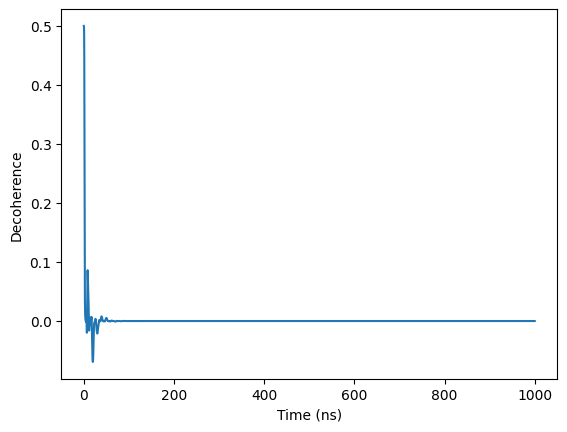

In [ ]:
tlist = np.linspace(0, 1000, 10000)
plt.plot(tlist, result.expect[1], label = 'n=1, N=8')
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Decoherence')

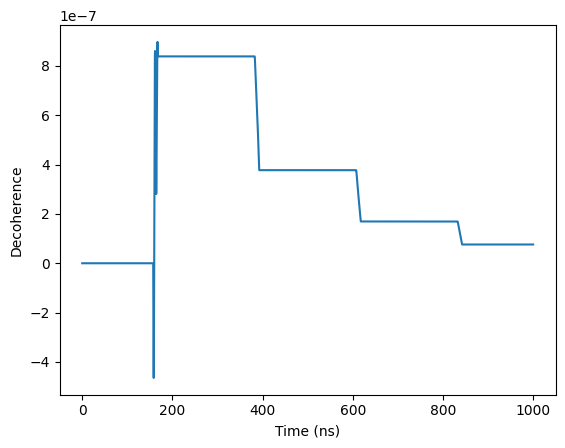

In [ ]:
tlist = np.linspace(0, 1000, 10000)
plt.plot(tlist, result.expect[0], label = 'n=1, N=8')
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

#### n=0.1

Text(0, 0.5, 'Decoherence')

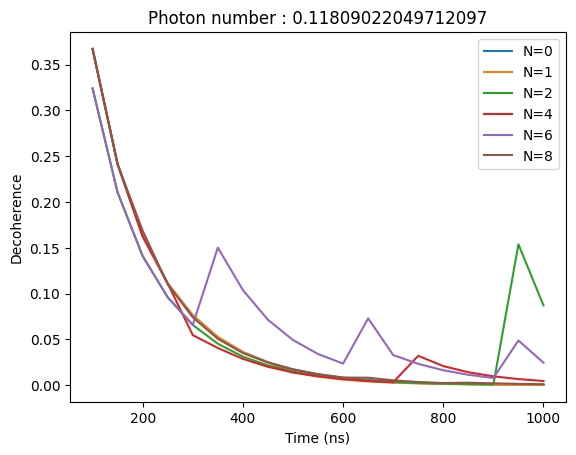

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[0][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[0]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

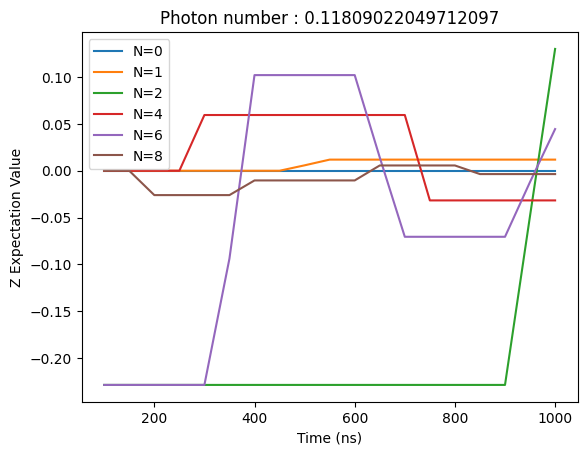

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[0][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[0]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.2

Text(0, 0.5, 'Decoherence')

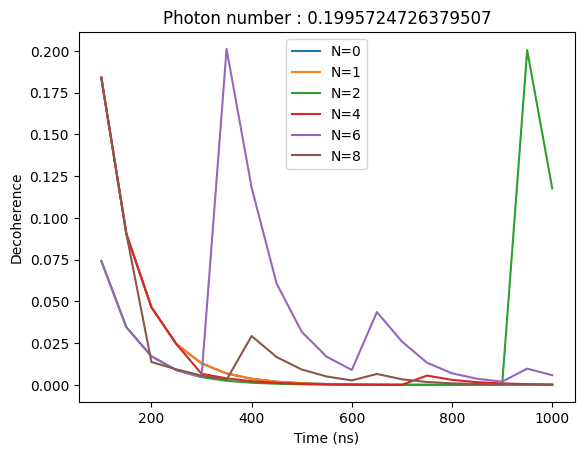

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[1][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[1]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

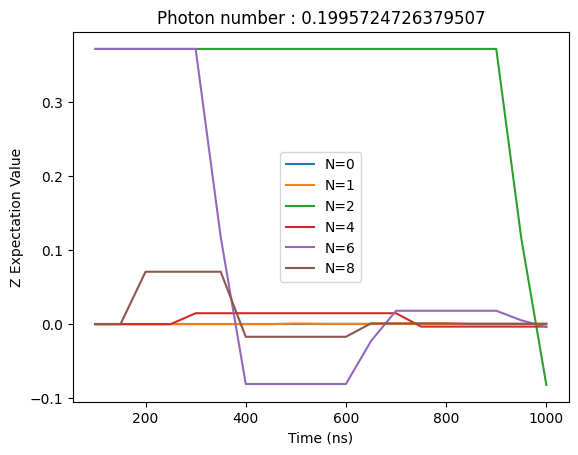

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[1][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[1]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.3

Text(0, 0.5, 'Decoherence')

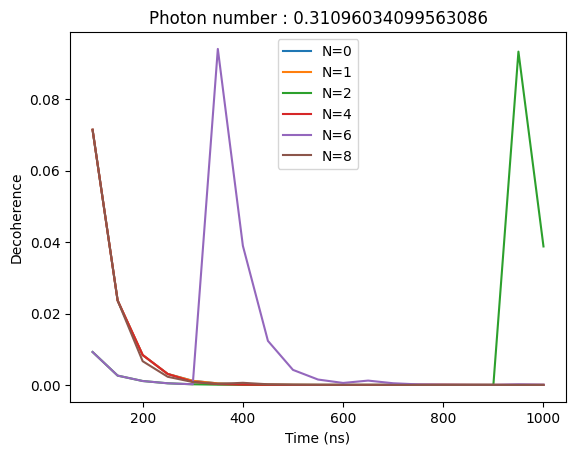

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[2][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[2]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

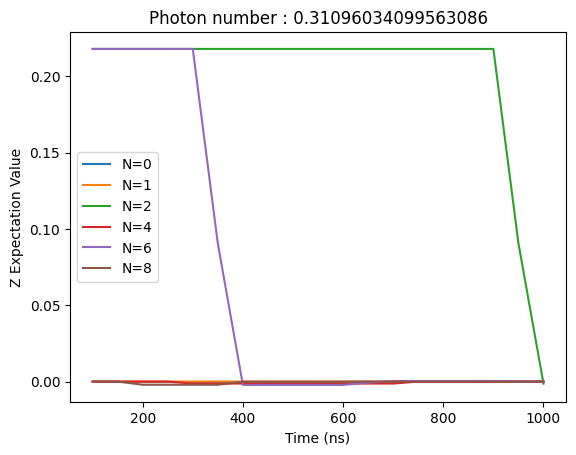

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[2][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[2]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.4

Text(0, 0.5, 'Decoherence')

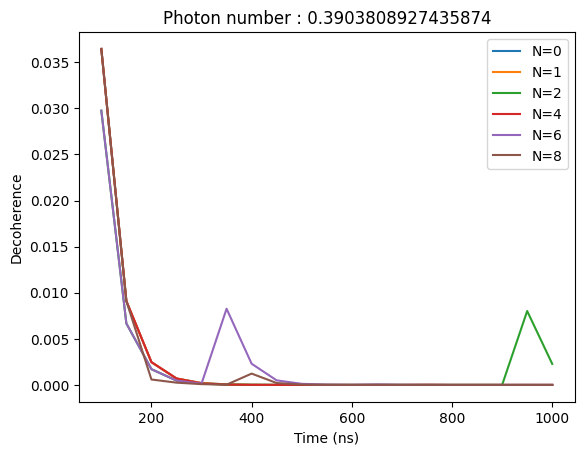

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[3][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[3]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

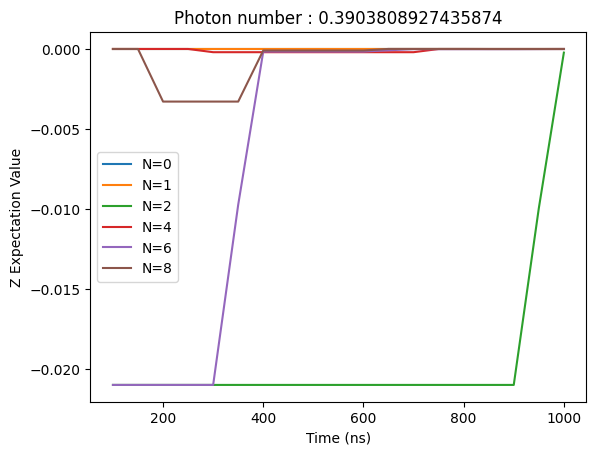

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[3][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[3]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.5

Text(0, 0.5, 'Decoherence')

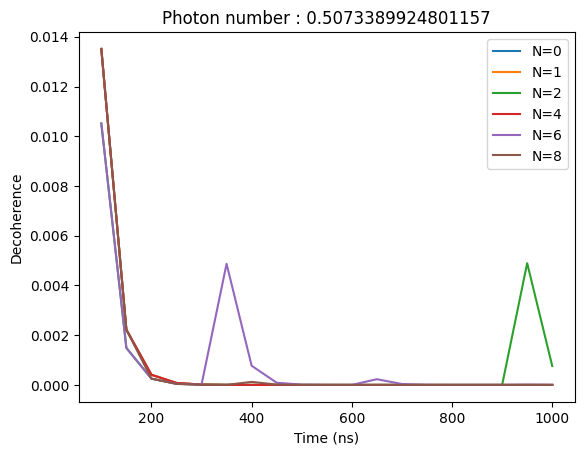

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[4][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[4]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

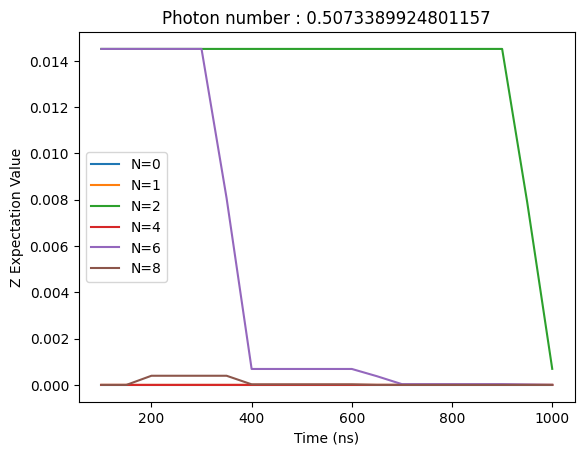

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[4][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[4]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.6

Text(0, 0.5, 'Decoherence')

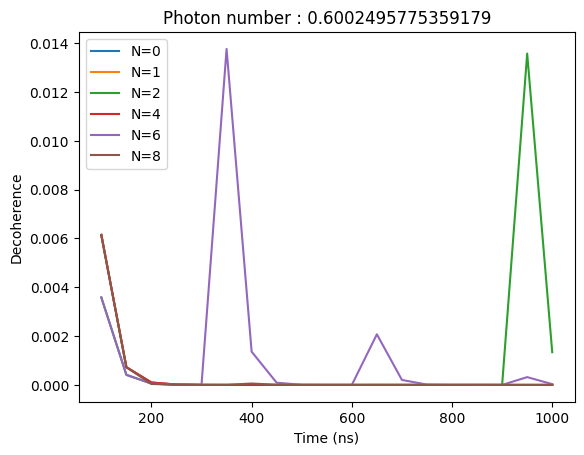

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[5][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[5]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

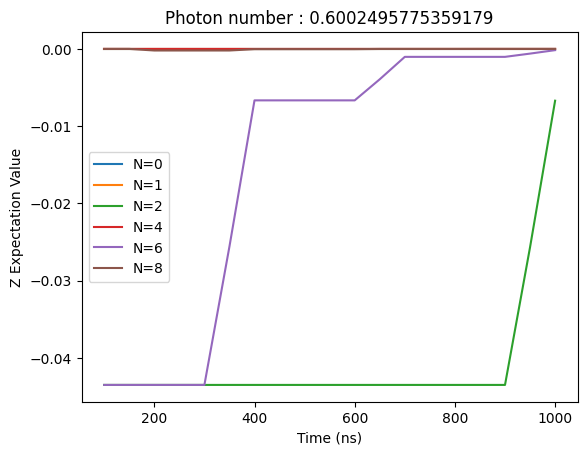

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[5][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[5]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.7

Text(0, 0.5, 'Decoherence')

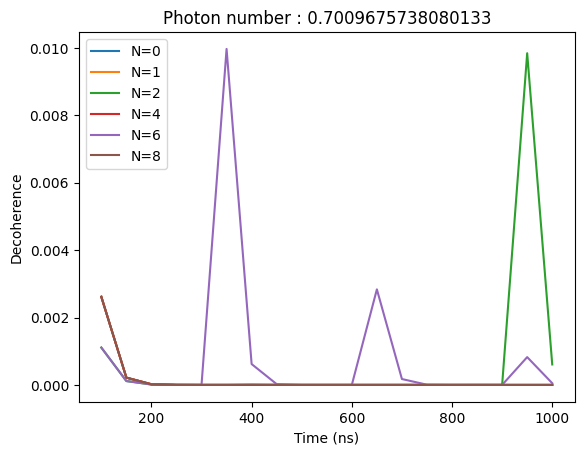

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[6][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[6]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

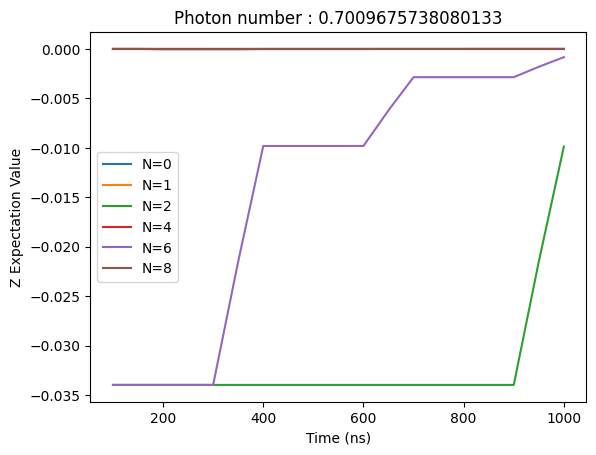

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[6][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[6]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.8

Text(0, 0.5, 'Decoherence')

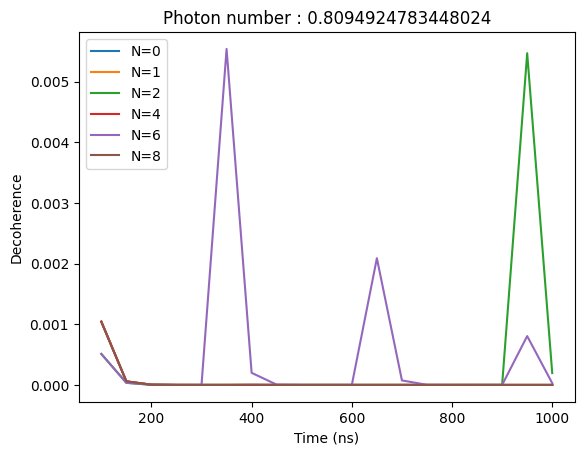

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[7][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[7]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

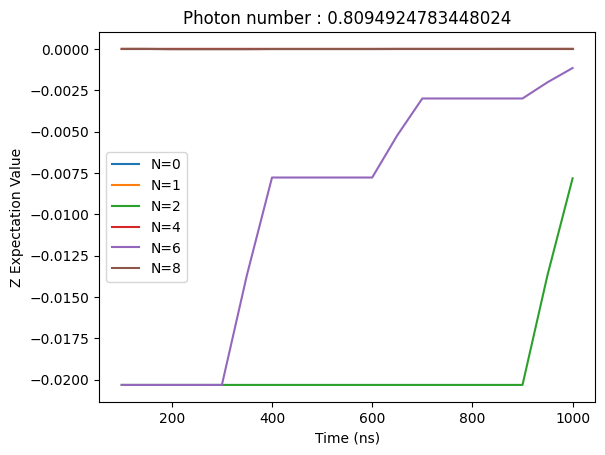

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[7][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[7]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.9

Text(0, 0.5, 'Decoherence')

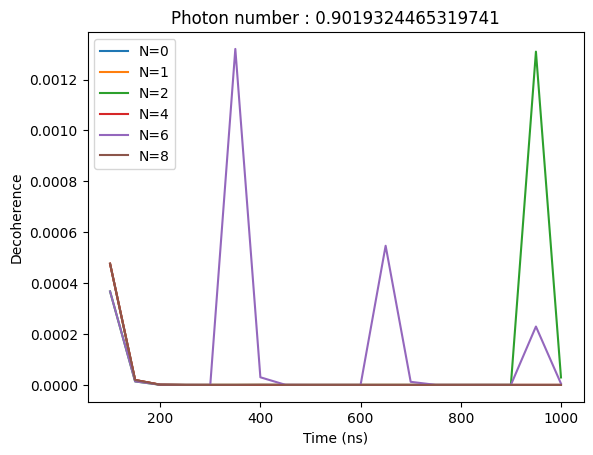

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[8][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[8]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

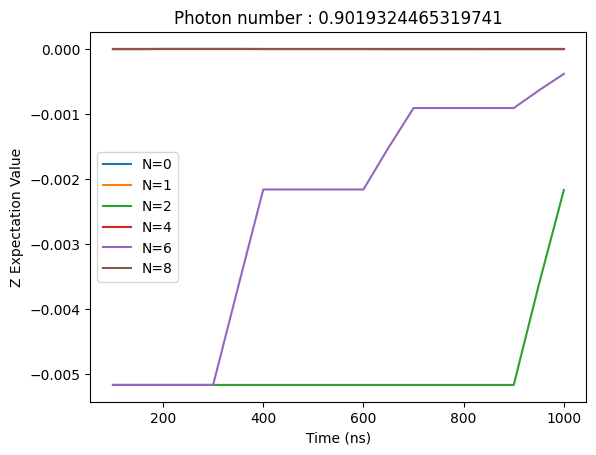

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[8][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[8]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=1.0

Text(0, 0.5, 'Decoherence')

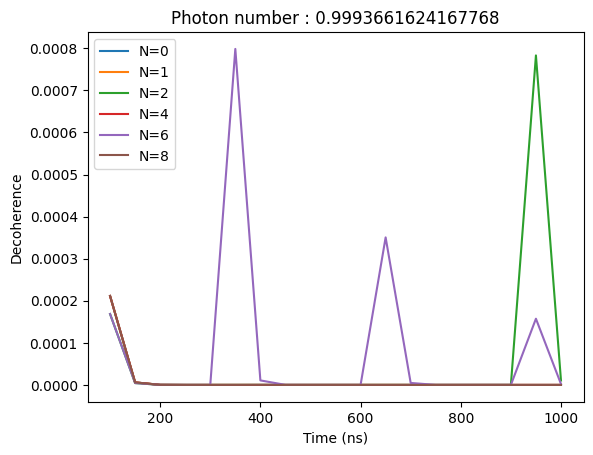

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[9][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

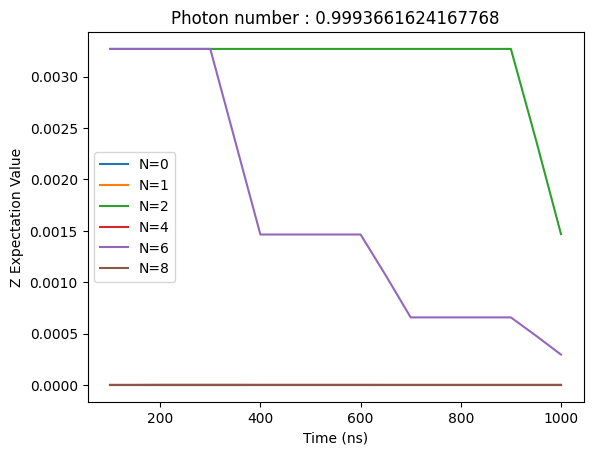

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[9][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

# 11. Measurement Induced Dephasing Dynamical Decoupling (n:0.001~0.01)

###1) Hamiltonian & Function Setting

Lab Frame

$H_0 = -\frac{\omega_q}{2}\sigma_z + \omega_r a^\dagger a + g\sigma_x(a+a^\dagger)$

$H_1 = A(t) (\hat{a} + \hat{a}^\dagger) \cos{(\omega_{rd} t)}$

$H_2 = B(t) \sigma_x \cos{(\omega_{qd} t)}$

Rotating Frame

$H_0 = -\frac{\omega_q-\omega_{qd}}{2}\sigma_z + ({\omega_r-\omega_{rd}})a^\dagger a + \chi\sigma_z(a^\dagger a)$

$H_1 = \frac{A(t)}{2} (\hat{a} + \hat{a}^\dagger) $

$H_2 = \frac{B(t)}{2}  \sigma_x $

In [35]:
# operator
N = 100

omega_r = 2 * np.pi * 7.0  # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0  # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 7.0  # qubit frequency in units of GHz
g = 2 * np.pi * 0.1        # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.01   # external coupling rate of resonator in units of GHz

In [36]:
sz = sigmaz()
sx = sigmax()
sy = sigmay()

sp = basis(2,1)*basis(2,0).dag()
sm = basis(2,0)*basis(2,1).dag()

a = destroy(N)

In [37]:
sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
sm_composite = tensor(sm, qeye(N))

annihilate_composite = tensor(qeye(2), a)
create_composite = tensor(qeye(2), a.dag())
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sx_composite, sy_composite, sz_composite, sp_composite, sm_composite, annihilate_composite, create_composite, number_composite]

psi_20 = tensor(basis(2,0), basis(N,0))
psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), basis(N,0))
psi_21 = tensor(basis(2,1), basis(N,0))

In [38]:
H0 = -0.5*(omega_q-omega_rd)*sz_composite + (omega_r-omega_rd)*number_composite + g*tensor(sx, a + a.dag())

H1 = 0.5*tensor(qeye(2), a + a.dag())

H2_x = 0.5*sx_composite

In [39]:
# single pi & half pi square pulse for drive

def Pi_Square(t, args, T_cent):

    A = args['A']

    return A * (t > T_cent-0.5*np.pi/A) * (t < T_cent+0.5*np.pi/A)

def Half_Pi_Square(t, args, T_cent):

    A = args['A']

    return 0.5 * A * (t > T_cent-0.5*np.pi/A) * (t < T_cent+0.5*np.pi/A)

In [40]:
# time-dependent envelope for drive

def Hrd_env(Env, Is_Pi):

  if (Env==0 and Is_Pi==0):
    return Half_Pi_Square

  elif (Env==0 and Is_Pi==1):
    return Pi_Square

# time-dependent function for drive

def Hrd_rot(f, t, args, T_cent):

    Omega_rd = args['Omega_rd']
    Phi = args['Phi']

    return f(t, args, T_cent) * np.cos(Omega_rd * t + Phi)

In [41]:
# Modulate each pulse timing
# pulse list
# pi/2 pulse at T_srt, T_end
# pi pulse at pulse time list

def Pulse_Timing(T_srt, T_end, N, Func):

    T = T_end - T_srt

    Seq_list = []

    if (Func==2) :
      shift = 0
      for i in range(N):
        shift = shift + T * np.sin(np.pi/(2*(N+2))) * np.sin(np.pi*(i+1)/(N+2)) / np.cos(np.pi/(2*(N+2)))
        Seq_list.append(T_srt + shift)

    else :
      for i in range(N):
        Seq_list.append(T_srt + (2*i+1)*T/(2*N))

    Seq = np.array(Seq_list)

    return Seq

In [42]:
# time-dependent envelope for qubit drive (rotating frame)

# args

# A (amplitude)
# Omega_rd (frequency)
# T_srt (pulse start time)
# T_end (pulse end time)
# N (number of pulse)
# Env (0: square envelope, 1: cosine envelope, 2: gaussian envelope)
# Func (0: CP, 1: CPMG, 2: UDD)

def Hqd_rotating_frame(t, args):

    T_srt = args['T_srt']
    T_end = args['T_end']
    N = args['N_seq']
    Env = args['Env']
    Func = args['Func']

    B = args['B']


    # T_cent
    Seq = Pulse_Timing(T_srt, T_end, N, Func)


    f = Hrd_env(Env, 0)
    pulse = f(t, {'A': B}, T_srt)

    for T_cent in Seq:
      f = Hrd_env(Env, 1)
      pulse = pulse + f(t, {'A': B}, T_cent)

    f = Hrd_env(Env, 0)
    pulse = pulse + f(t, {'A': B}, T_end)

    return pulse

In [43]:
# time-dependent coefficient for resonator drive

def Hrd_rotating_frame(t, args):
    """
    Envelope function for the readout drive
    """
    A = args['A'] # amplitude of the readout drive
    T_srt = args['T_srt'] # duration of the readout drive, in units of ns
    T_end = args['T_end'] # duration of the readout drive, in units of ns

    return A * (T_srt <= t) * (t <= T_end)

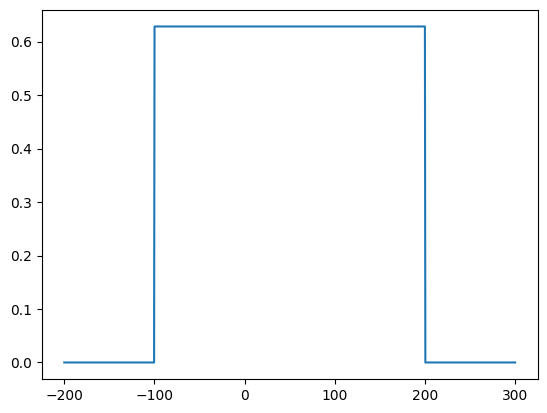

In [44]:
# resonator pulse simulation (rotating frame)
tlist = np.linspace(-200, 300, 1000)
plt.figure()
plt.plot(tlist, Hrd_rotating_frame(tlist, {'A': 2*np.pi*0.1, 'T_srt': -100, 'T_end': 200}))

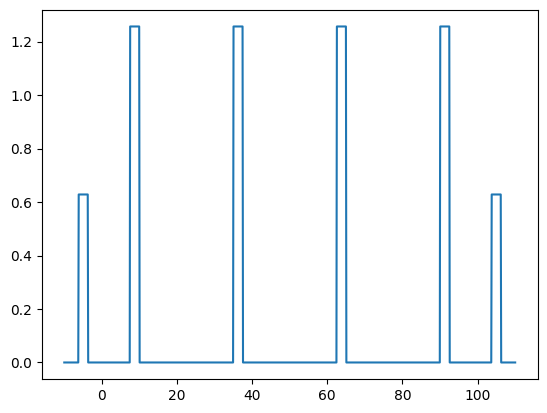

In [45]:
# qubit pulse simulation (rotating frame)
tlist = np.linspace(-10, 110, 1000)
plt.figure()
plt.plot(tlist, Hqd_rotating_frame(tlist, {'B': 2*np.pi*0.2, 'T_srt': -5, 'T_end': 105, 'N_seq': 4, 'Env': 0, 'Func': 0}))

### 2) Photon Number n

kappa = 2 * np.pi * 0.01

In [ ]:
A = [0.01897, 0.02846, 0.011, 0.03479, 0.04522, 0.04917, 0.05297, 0.05644, 0.05993, 0.06325]

In [ ]:
N = 5

omega_r = 2 * np.pi * 7.0  # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0  # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 6.9 # qubit frequency in units of GHz
g = 2 * np.pi * 0.1        # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.01   # external coupling rate of resonator in units of GHz

sz = sigmaz()
sx = sigmax()
sy = sigmay()
sp = basis(2,1)*basis(2,0).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
annihilate_composite = tensor(qeye(2), a)
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sx_composite, sy_composite, sz_composite, sp_composite, number_composite]

psi_20 = tensor(basis(2,0), basis(N,0))
psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), basis(N,0))
psi_21 = tensor(basis(2,1), basis(N,0))

H0 = (omega_r-omega_rd)*number_composite + g*tensor(sz, a.dag()*a)
H1 = 0.5*tensor(qeye(2), a + a.dag())
H2 = 0.5*sx_composite

tlist = np.linspace(0, 1000, 10000)

In [ ]:
plus_list = []
n_list = []
for i in range(10):
  result = mesolve(
    [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'B': 2*np.pi*0.1, 'T_srt': -20, 'T_end': 50*20+20, 'N_seq': 0, 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T': 1500},
    e_ops = op_list,
    options = Options(nsteps = 100000, atol = 1e-10, rtol = 1e-8)
  )

  plus_list.append(result.expect[3])
  n_list.append(result.expect[4])

/usr/local/lib/python3.10/dist-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


Text(0, 0.5, 'Off Diagonal Term Expectation Value')

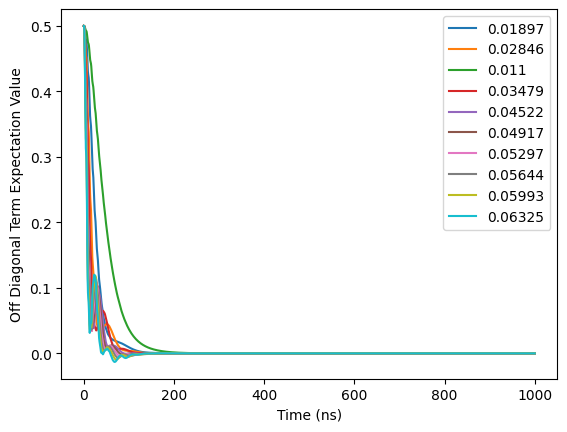

In [ ]:
# Plot off-diagonal term expectation value

fig, ax = plt.subplots(1, 1)

for i in range(10):
  ax.plot(tlist, plus_list[i], label = '{0}'.format(A[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Off Diagonal Term Expectation Value')

Text(0, 0.5, 'Photon Number Expectation Value')

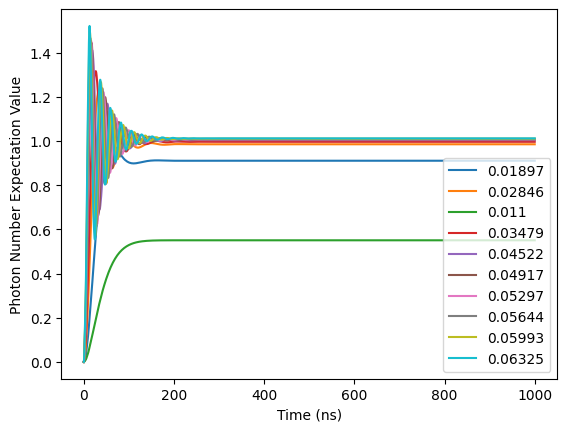

In [ ]:
# Plot photon number expectation value

fig, ax = plt.subplots(1, 1)

for i in range(10):
  ax.plot(tlist, n_list[i], label = '{0}'.format(A[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Photon Number Expectation Value')

In [ ]:
for i in range(10):
  print(n_list[i][-1])

0.9105747821451489
0.9850088412163935
0.5504329605645057
0.9961887269461036
1.003823192059352
1.0057344292458212
1.0074243433356718
1.0089159504540737
1.0104085678066157
1.01184514290465


### 3) Photon Number n

kappa = 2 * np.pi * 0.005

In [ ]:
A = [0.006875, 0.0089375, 0.01115625, 0.0125, 0.01425, 0.0155, 0.01675, 0.018, 0.019, 0.020]

In [ ]:
N = 5

omega_r = 2 * np.pi * 7.0   # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0   # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 7.0  # qubit frequency in units of GHz
g = 2 * np.pi * 0.1         # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.005   # external coupling rate of resonator in units of GHz

sz = sigmaz()
sx = sigmax()
sy = sigmay()
sp = basis(2,1)*basis(2,0).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
annihilate_composite = tensor(qeye(2), a)
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sx_composite, sy_composite, sz_composite, sp_composite, number_composite]

psi_20 = tensor(basis(2,0), basis(N,0))
psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), basis(N,0))
psi_21 = tensor(basis(2,1), basis(N,0))

H0 = (omega_r-omega_rd)*number_composite + g*tensor(sz, a.dag()*a)
H1 = 0.5*tensor(qeye(2), a + a.dag())
H2 = 0.5*sx_composite

tlist = np.linspace(0, 1000, 10000)

In [ ]:
plus_list = []
n_list = []
for i in range(10):
  result = mesolve(
    [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'B': 2*np.pi*0.1, 'T_srt': -20, 'T_end': 50*20+20, 'N_seq': 0, 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T': 1500},
    e_ops = op_list,
    options = Options(nsteps = 100000, atol = 1e-10, rtol = 1e-8)
  )

  plus_list.append(result.expect[3])
  n_list.append(result.expect[4])

Text(0, 0.5, 'Off Diagonal Term Expectation Value')

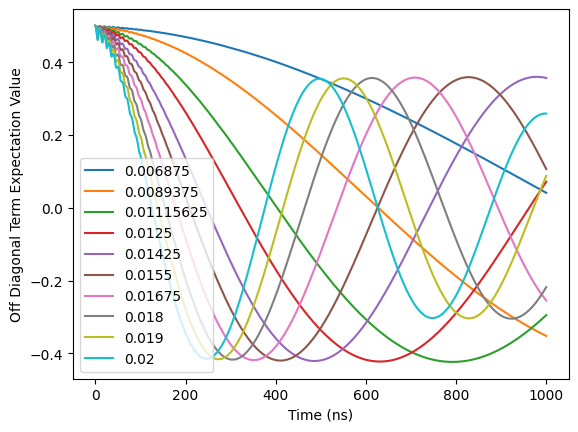

In [ ]:
# Plot off-diagonal term expectation value

fig, ax = plt.subplots(1, 1)

for i in range(10):
  ax.plot(tlist, plus_list[i], label = '{0}'.format(A[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Off Diagonal Term Expectation Value')

Text(0, 0.5, 'Photon Number Expectation Value')

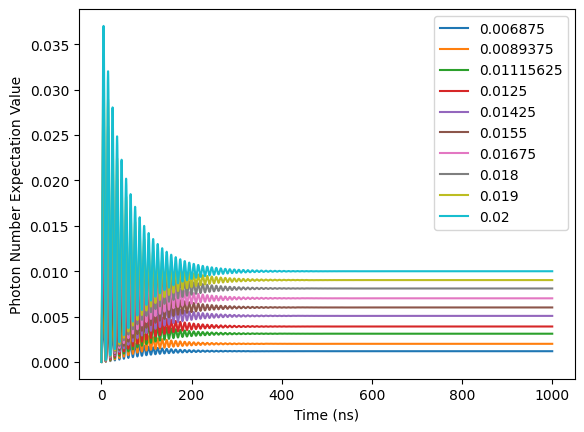

In [ ]:
# Plot photon number expectation value

fig, ax = plt.subplots(1, 1)

for i in range(10):
  ax.plot(tlist, n_list[i], label = '{0}'.format(A[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Photon Number Expectation Value')

In [ ]:
for i in range(10):
  print(n_list[i][-1])

0.001180902204970869
0.001995724726395008
0.0031096034115386893
0.0039038089418660786
0.005073390100397723
0.006002496627691125
0.007009679332857433
0.008094938215074954
0.009019360167426821
0.009993750871148555


### 4) Off Diagonal Term Evolution B=0.05GHz

Resonator Dissipation Rate : $\kappa = 2π · 0.01$

Initial State $\frac{|0\rangle+|1\rangle}{\sqrt{2}}$

Result :


In [ ]:
A =     [0.01897, 0.02846, 0.011, 0.03479, 0.04522, 0.04917, 0.05297, 0.05644, 0.05993, 0.06325]
n_exp = [0.008974087269804663, 0.020198792334470222, 0.0030174563590501468, 0.03018313961295447, 0.050993658295199994, 0.06029133987083375, 0.0699702759458842, 0.07943764785717491, 0.08956513381677578, 0.0997628343291872]
N_seq = [0,1,2,4,6,8]
tau_list = [50*(k+2) for k in range(19)]

z_tot = []
plus_tot = []

In [ ]:
N = 5

omega_r = 2 * np.pi * 7.0  # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0  # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 7.0 # qubit frequency in units of GHz
g = 2 * np.pi * 0.1        # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.01   # external coupling rate of resonator in units of GHz

sz = sigmaz()
sx = sigmax()
sy = sigmay()
sp = basis(2,1)*basis(2,0).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
annihilate_composite = tensor(qeye(2), a)
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sz_composite, sp_composite]

psi_20 = tensor(basis(2,0), basis(N,0))
psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), basis(N,0))
psi_21 = tensor(basis(2,1), basis(N,0))

In [ ]:
# iterate for photon number n
for i in range(10):

  H0 = (omega_r-omega_rd)*number_composite + g*tensor(sz, a.dag()*a)
  H1 = 0.5*tensor(qeye(2), a + a.dag())
  H2 = 0.5*sx_composite

  z_n = []
  plus_n = []


  # iterate for pi-pulse time N
  for j in range(6):

    z = []
    plus = []


    # iterate for evolution time 50ns ~ 1000ns
    for k in range(19):

      # Simulation
      tlist = np.linspace(0, 50*(k+2), 500*(k+2))

      result = mesolve(
        [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
        psi_2s,
        tlist,
        c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
        args = {'B': 2*np.pi*0.05, 'T_srt': -10, 'T_end': 50*(k+2)+10, 'N_seq': N_seq[j], 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T_srt': 0, 'T_end': 1500},
        e_ops = op_list,
        options = Options(nsteps = 5000*(k+2), atol = 1e-10, rtol = 1e-8)
      )

      z_sub = result.expect[0]
      plus_sub = result.expect[1]

      z.append(z_sub[-1])
      plus.append(np.abs(2*plus_sub[-1]))

    z_n.append(z)
    plus_n.append(plus)

  z_tot.append(z_n)
  plus_tot.append(plus_n)

  print(i)

0
1
2
3
4
5
6
7
8
9


Text(0, 0.5, 'Decoherence')

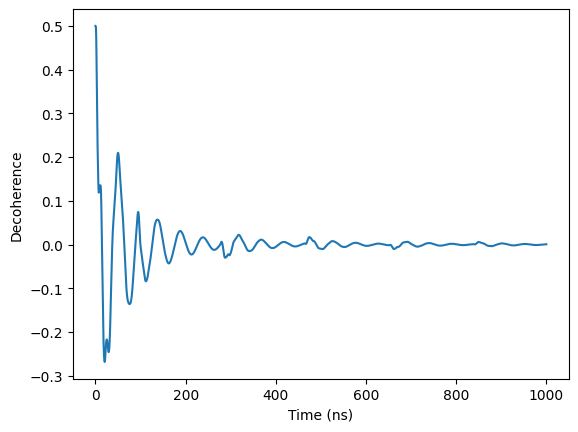

In [ ]:
tlist = np.linspace(0, 1000, 10000)
plt.plot(tlist, result.expect[1], label = 'n=1, N=8')
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Decoherence')

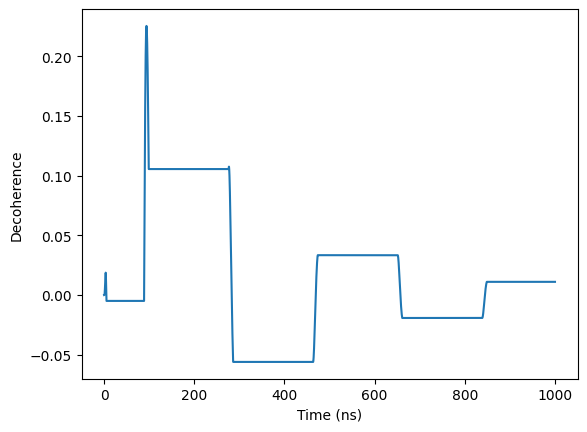

In [ ]:
tlist = np.linspace(0, 1000, 10000)
plt.plot(tlist, result.expect[0], label = 'n=1, N=8')
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

#### n=0.1

Text(0, 0.5, 'Decoherence')

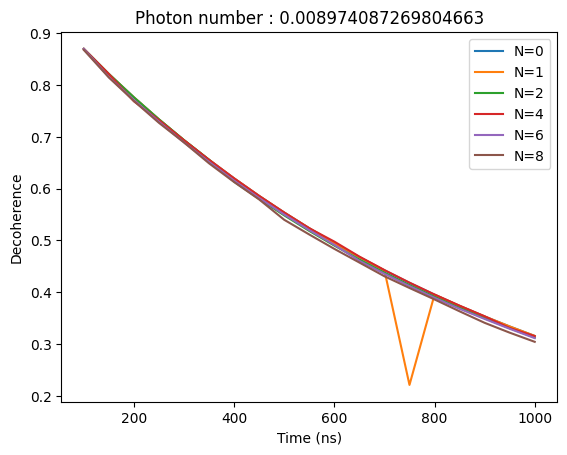

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[0][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('Photon number : {0}'.format(n_exp[0]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

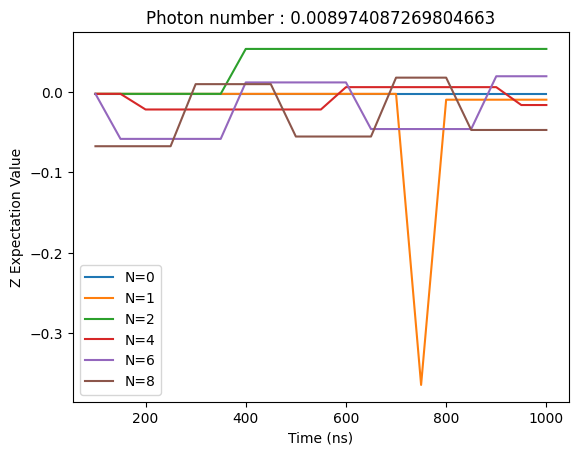

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[0][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[0]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.2

Text(0, 0.5, 'Decoherence')

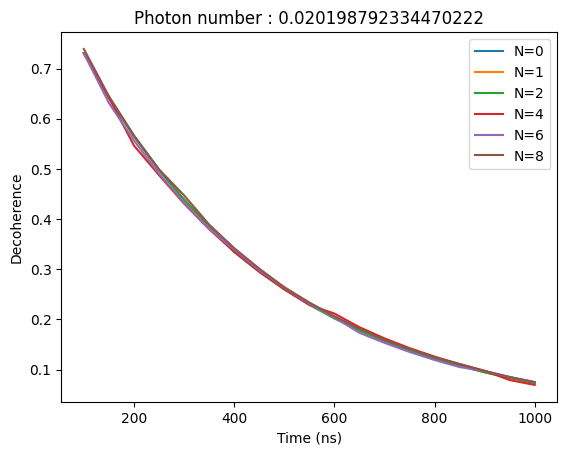

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[1][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[1]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

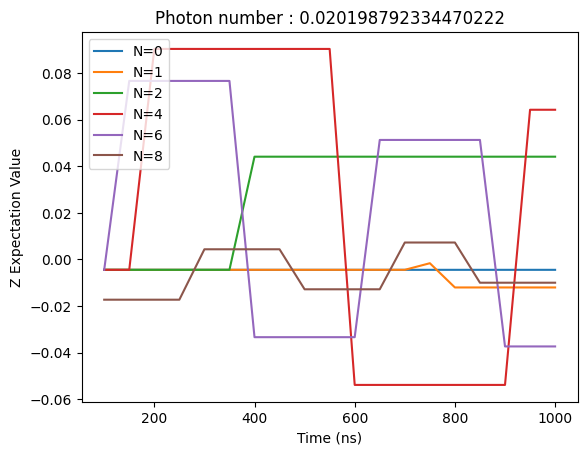

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[1][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[1]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.3

Text(0, 0.5, 'Decoherence')

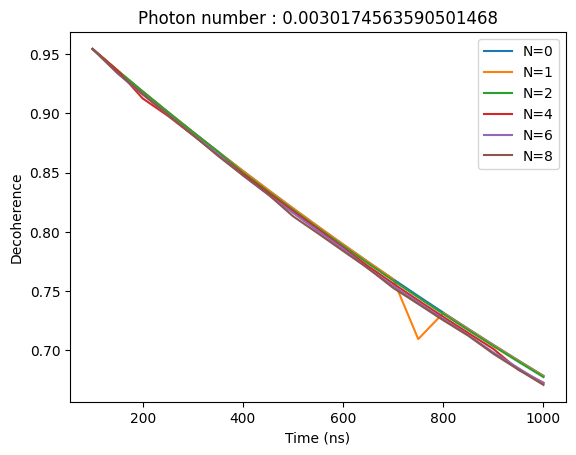

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[2][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[2]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

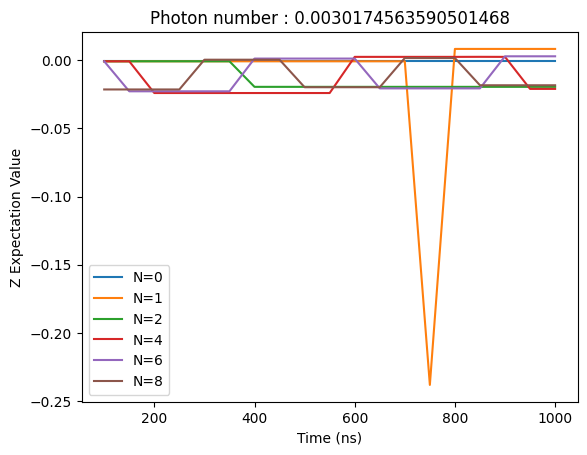

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[2][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[2]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.4

Text(0, 0.5, 'Decoherence')

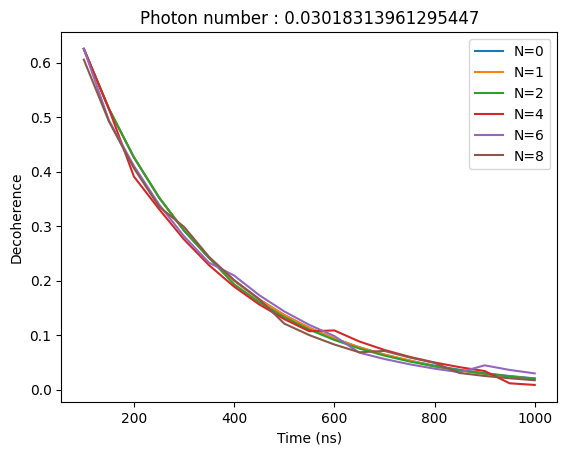

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[3][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[3]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

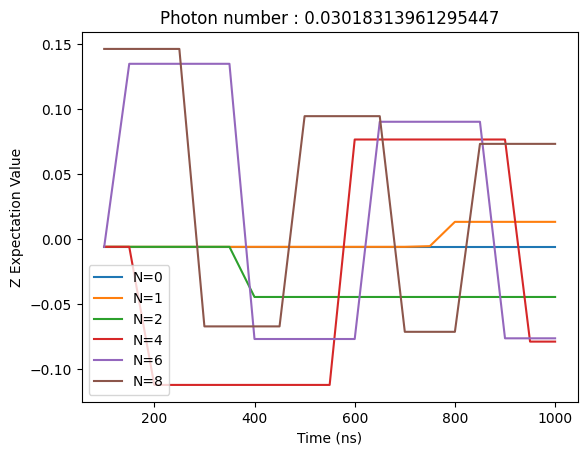

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[3][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[3]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.5

Text(0, 0.5, 'Decoherence')

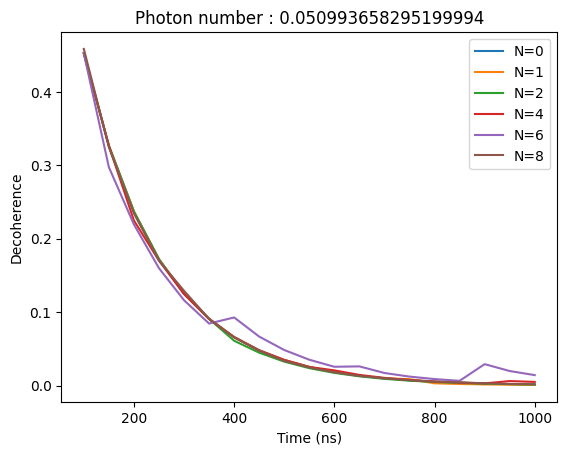

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[4][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[4]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

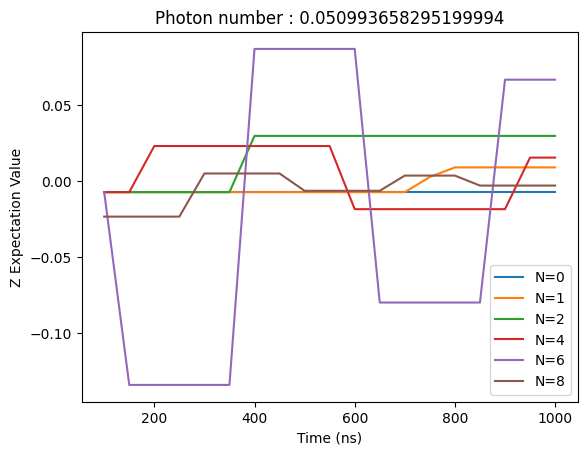

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[4][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[4]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.6

Text(0, 0.5, 'Decoherence')

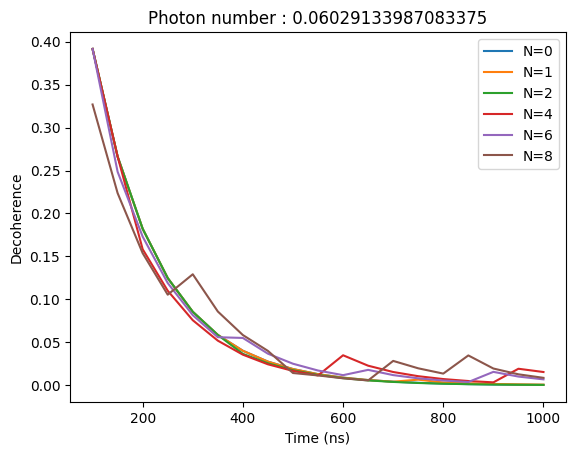

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[5][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[5]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

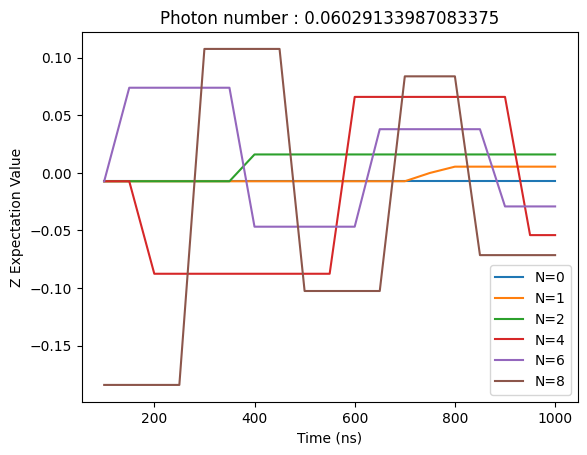

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[5][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[5]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.7

Text(0, 0.5, 'Decoherence')

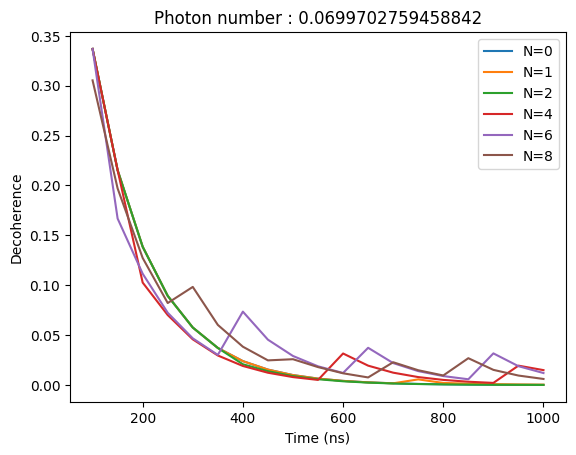

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[6][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[6]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

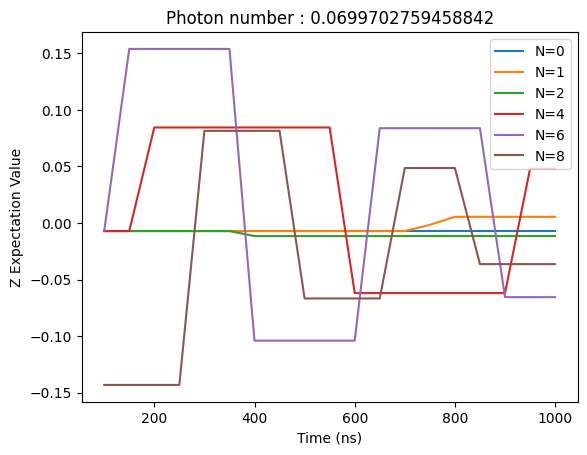

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[6][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[6]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.8

Text(0, 0.5, 'Decoherence')

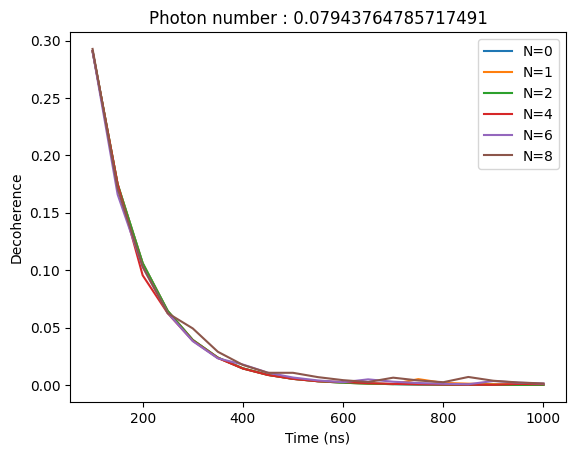

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[7][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[7]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

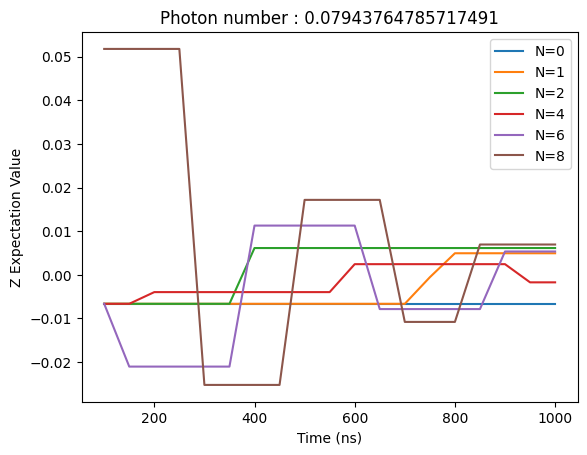

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[7][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[7]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.9

Text(0, 0.5, 'Decoherence')

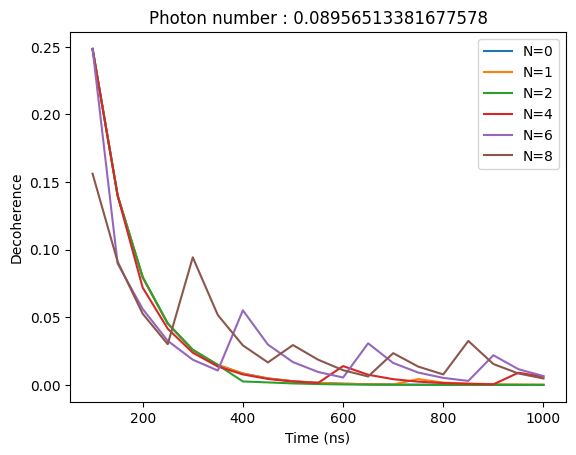

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[8][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[8]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

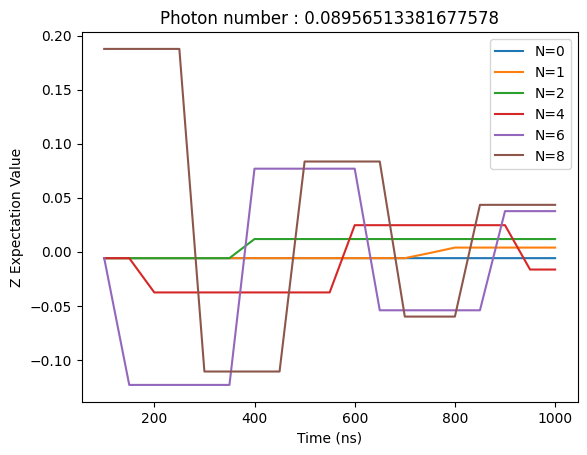

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[8][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[8]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=1.0

Text(0, 0.5, 'Decoherence')

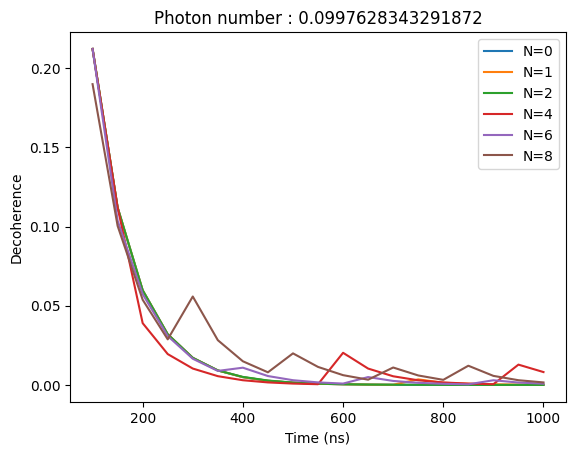

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[9][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

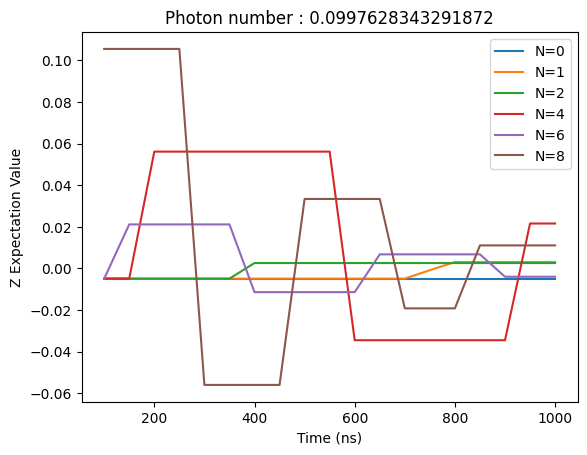

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[9][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

### 5) Off Diagonal Term Evolution B=0.05GHz with AC Stark Shift Detune

Resonator Dissipation Rate : $\kappa = 2π · 0.01$

Initial State $\frac{|0\rangle+|1\rangle}{\sqrt{2}}$

Result :


In [ ]:
A =     [0.01897, 0.02846, 0.011, 0.03479, 0.04522, 0.04917, 0.05297, 0.05644, 0.05993, 0.06325]
n_exp = [0.008974087269804663, 0.020198792334470222, 0.0030174563590501468, 0.03018313961295447, 0.050993658295199994, 0.06029133987083375, 0.0699702759458842, 0.07943764785717491, 0.08956513381677578, 0.0997628343291872]
N_seq = [0,1,2,4,6,8]
tau_list = [50*(k+2) for k in range(19)]

z_tot = []
plus_tot = []

In [ ]:
N = 5

omega_r = 2 * np.pi * 7.0  # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0  # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 7.0 # qubit frequency in units of GHz
g = 2 * np.pi * 0.1        # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.01   # external coupling rate of resonator in units of GHz
kai = g*g/(omega_r-omega_q)

sz = sigmaz()
sx = sigmax()
sy = sigmay()
sp = basis(2,1)*basis(2,0).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
annihilate_composite = tensor(qeye(2), a)
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sz_composite, sp_composite]

psi_20 = tensor(basis(2,0), basis(N,0))
psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), basis(N,0))
psi_21 = tensor(basis(2,1), basis(N,0))

In [ ]:
# iterate for photon number n
for i in range(10):

  H0 = +kai*n_exp[i]*sz_composite + (omega_r-omega_rd)*number_composite + g*tensor(sz, a.dag()*a)
  H1 = 0.5*tensor(qeye(2), a + a.dag())
  H2 = 0.5*sx_composite

  z_n = []
  plus_n = []


  # iterate for pi-pulse time N
  for j in range(6):

    z = []
    plus = []


    # iterate for evolution time 50ns ~ 1000ns
    for k in range(19):

      # Simulation
      tlist = np.linspace(0, 50*(k+2), 500*(k+2))

      result = mesolve(
        [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
        psi_2s,
        tlist,
        c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
        args = {'B': 2*np.pi*0.05, 'T_srt': -10, 'T_end': 50*(k+2)+10, 'N_seq': N_seq[j], 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T_srt': 0, 'T_end': 1500},
        e_ops = op_list,
        options = Options(nsteps = 5000*(k+2), atol = 1e-10, rtol = 1e-8)
      )

      z_sub = result.expect[0]
      plus_sub = result.expect[1]

      z.append(z_sub[-1])
      plus.append(np.abs(2*plus_sub[-1]))

    z_n.append(z)
    plus_n.append(plus)

  z_tot.append(z_n)
  plus_tot.append(plus_n)

  print(i)

0
1
2
3
4
5
6
7
8
9


Text(0, 0.5, 'Decoherence')

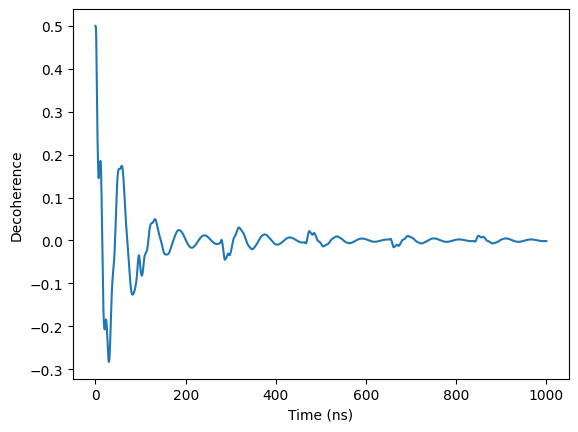

In [ ]:
tlist = np.linspace(0, 1000, 10000)
plt.plot(tlist, result.expect[1], label = 'n=1, N=8')
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Decoherence')

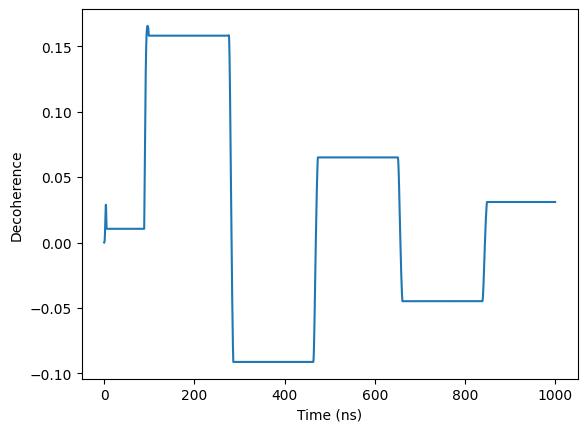

In [ ]:
tlist = np.linspace(0, 1000, 10000)
plt.plot(tlist, result.expect[0], label = 'n=1, N=8')
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

#### n=0.1

Text(0, 0.5, 'Decoherence')

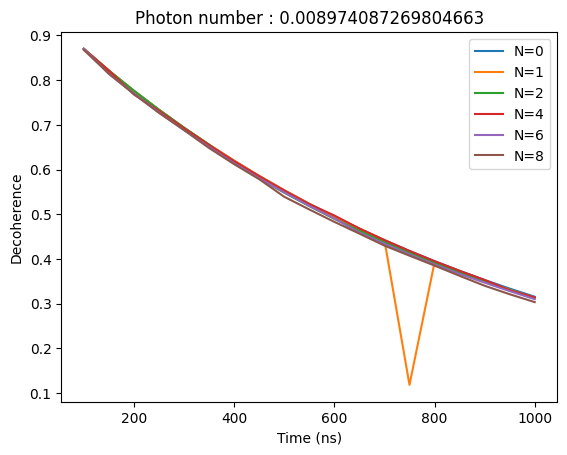

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[0][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[0]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

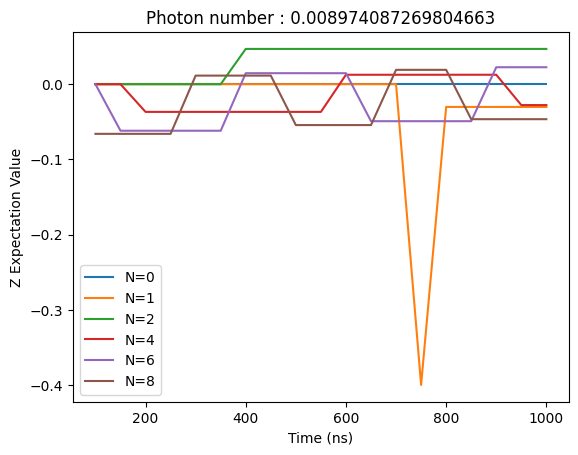

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[0][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[0]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.2

Text(0, 0.5, 'Decoherence')

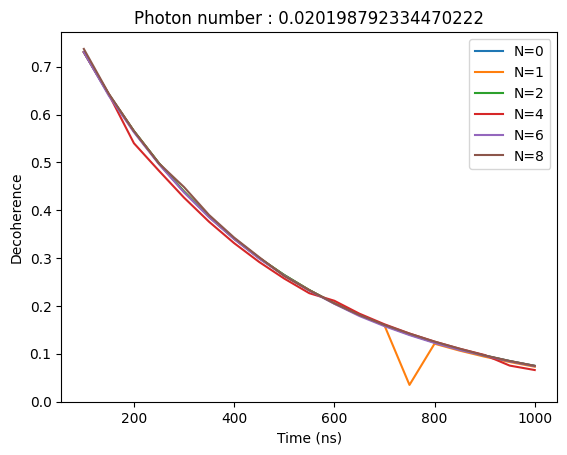

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[1][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[1]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

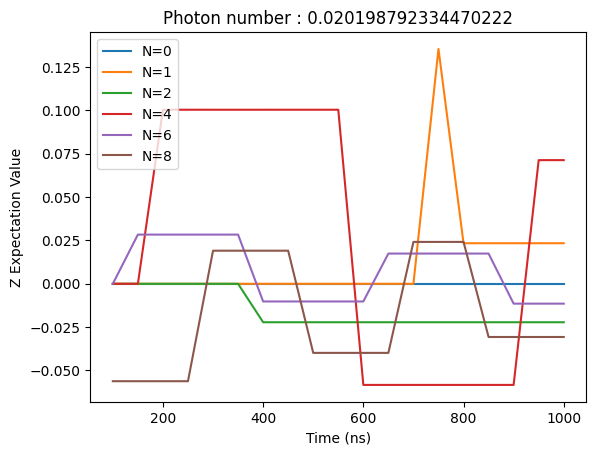

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[1][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[1]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.3

Text(0, 0.5, 'Decoherence')

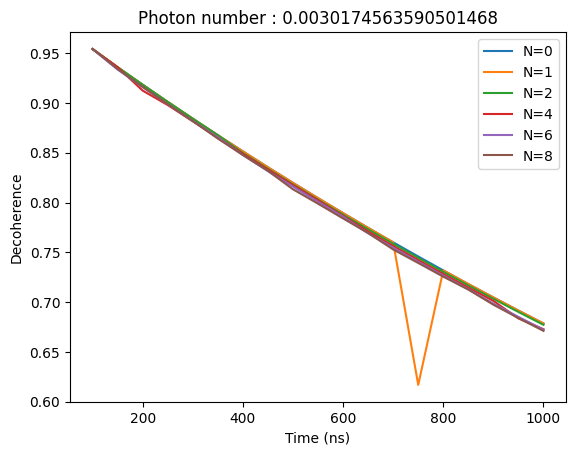

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[2][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[2]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

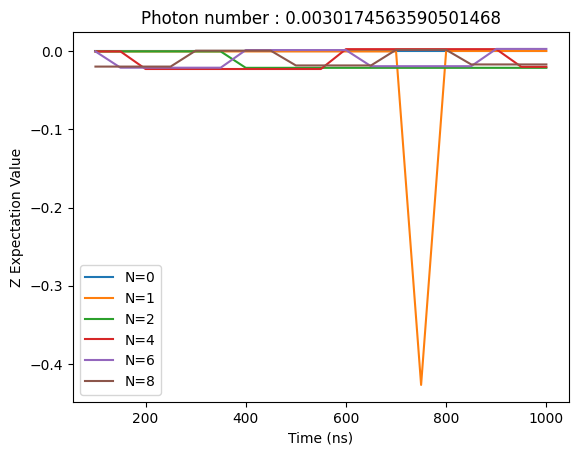

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[2][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[2]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.4

Text(0, 0.5, 'Decoherence')

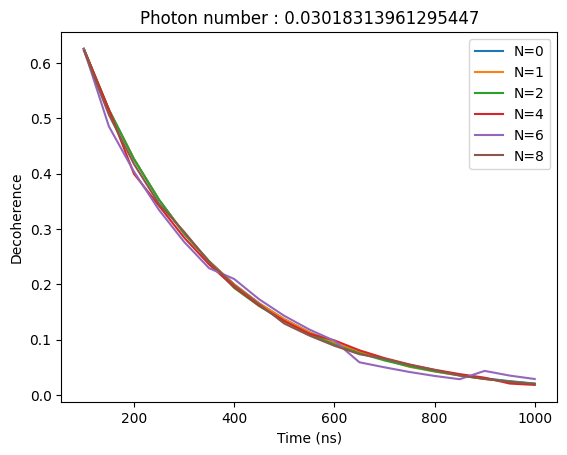

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[3][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[3]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

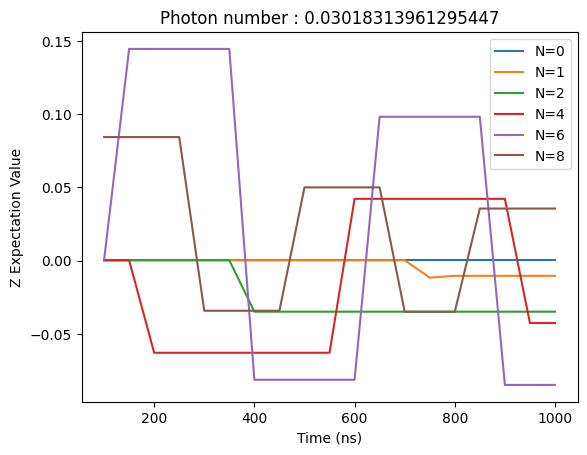

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[3][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[3]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.5

Text(0, 0.5, 'Decoherence')

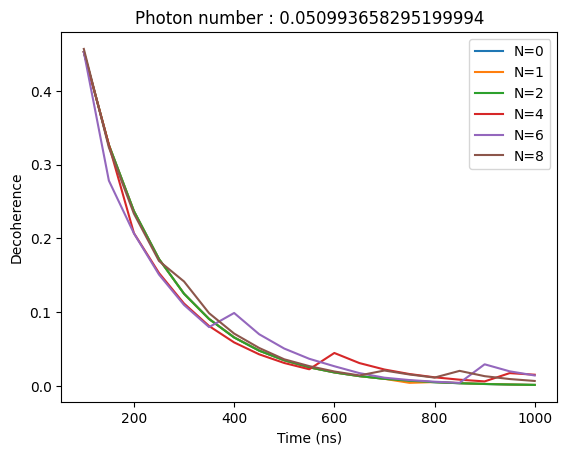

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[4][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[4]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

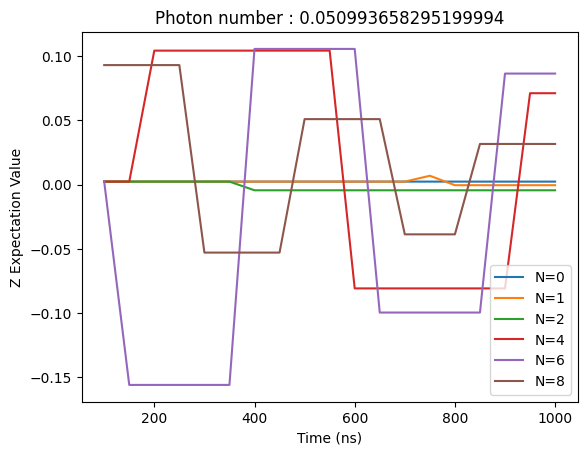

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[4][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[4]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.6

Text(0, 0.5, 'Decoherence')

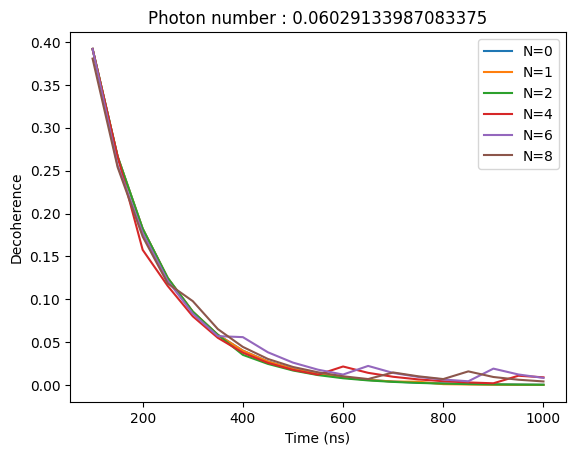

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[5][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[5]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

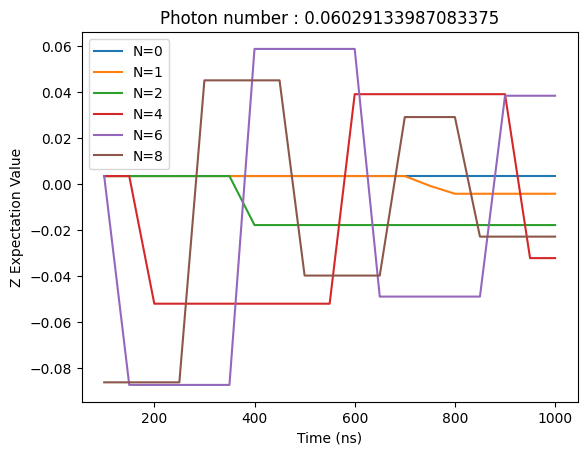

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[5][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[5]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.7

Text(0, 0.5, 'Decoherence')

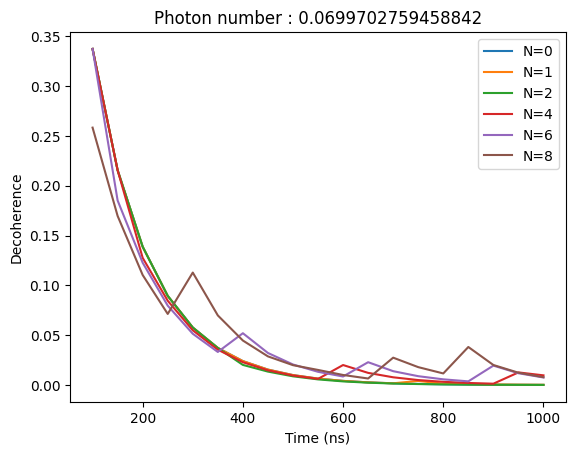

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[6][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[6]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

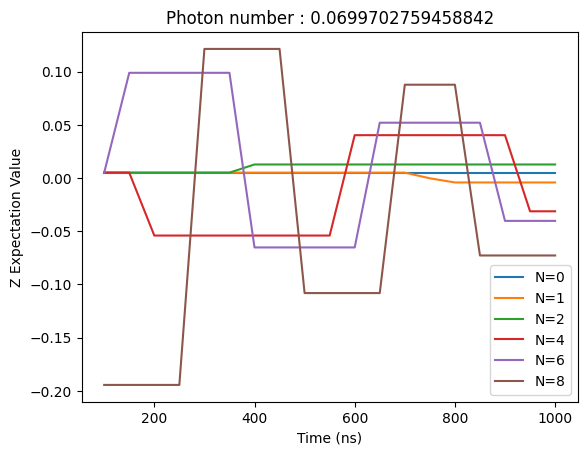

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[6][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[6]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.8

Text(0, 0.5, 'Decoherence')

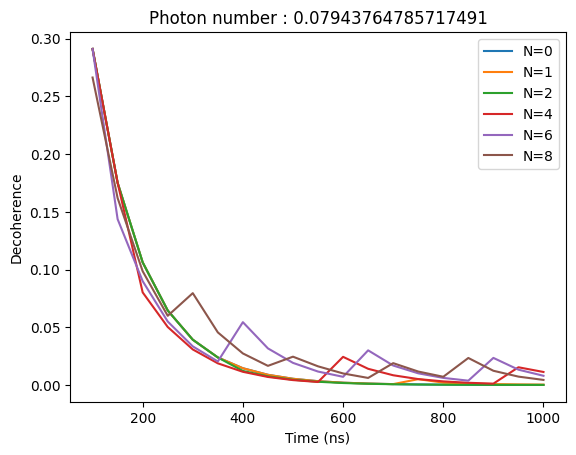

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[7][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[7]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

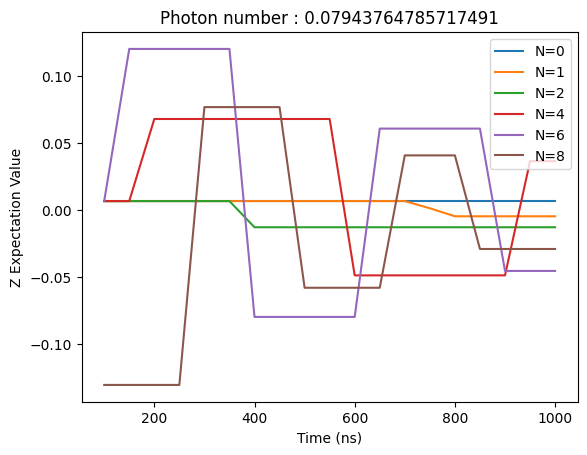

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[7][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[7]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.9

Text(0, 0.5, 'Decoherence')

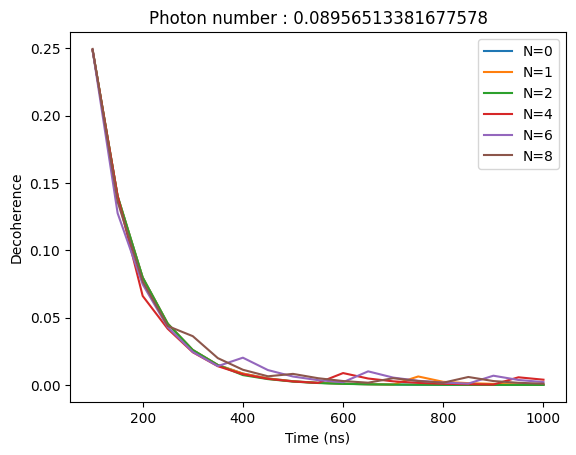

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[8][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[8]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

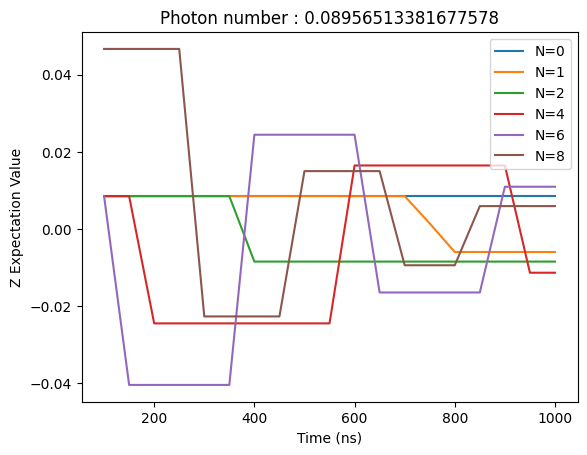

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[8][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[8]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=1.0

Text(0, 0.5, 'Decoherence')

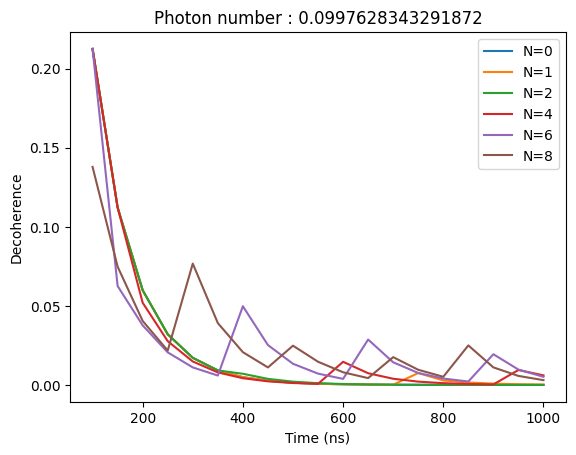

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[9][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

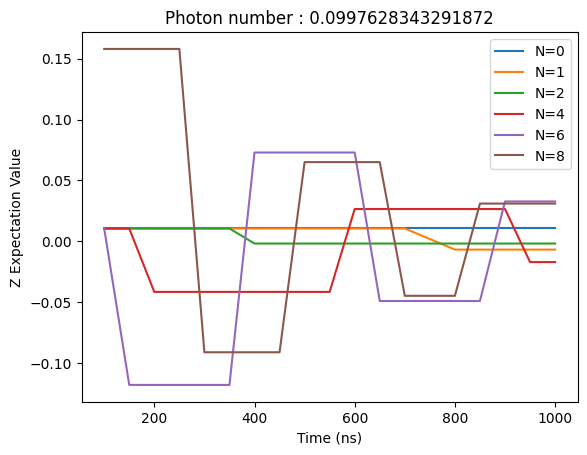

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[9][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

### 7) Off Diagonal Term Evolution B=0.05GHz with AC Stark Shift Detune

Resonator Dissipation Rate : $\kappa = 2π · 0.005$

Initial State $\frac{|0\rangle+|1\rangle}{\sqrt{2}}$

Result :


In [ ]:
A = [0.06875, 0.089375, 0.1115625, 0.125, 0.1425, 0.155, 0.1675, 0.18, 0.19, 0.20]
n_exp = [0.11809022049712097, 0.1995724726379507, 0.31096034099563086, 0.3903808927435874, 0.5073389924801157, 0.6002495775359179, 0.7009675738080133, 0.8094924783448024, 0.9019324465319741, 0.9993661624167768]
N_seq = [0,1,2,4,6,8]
tau_list = [50*(k+2) for k in range(19)]

z_tot = []
plus_tot = []

In [ ]:
N = 10

omega_r = 2 * np.pi * 7.0  # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0  # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 7.0 # qubit frequency in units of GHz
g = 2 * np.pi * 0.1        # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.005  # external coupling rate of resonator in units of GHz

sz = sigmaz()
sx = sigmax()
sy = sigmay()
sp = basis(2,1)*basis(2,0).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
annihilate_composite = tensor(qeye(2), a)
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sz_composite, sp_composite]

psi_20 = tensor(basis(2,0), basis(N,0))
psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), basis(N,0))
psi_21 = tensor(basis(2,1), basis(N,0))

In [ ]:
# iterate for photon number n
for i in range(10):

  H0 = +kai*n_exp[i]*sz_composite + (omega_r-omega_rd)*number_composite + g*tensor(sz, a.dag()*a)
  H1 = 0.5*tensor(qeye(2), a + a.dag())
  H2 = 0.5*sx_composite

  z_n = []
  plus_n = []


  # iterate for pi-pulse time N
  for j in range(6):

    z = []
    plus = []


    # iterate for evolution time 50ns ~ 1000ns
    for k in range(19):

      # Simulation
      tlist = np.linspace(0, 50*(k+2), 500*(k+2))

      result = mesolve(
        [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
        psi_2s,
        tlist,
        c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
        args = {'B': 2*np.pi*0.05, 'T_srt': -10, 'T_end': 50*(k+2)+10, 'N_seq': N_seq[j], 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T_srt': -400, 'T_end': 1400},
        e_ops = op_list,
        options = Options(nsteps = 5000*(k+2), atol = 1e-10, rtol = 1e-8)
      )

      z_sub = result.expect[0]
      plus_sub = result.expect[1]

      z.append(z_sub[-1])
      plus.append(np.abs(2*plus_sub[-1]))

    z_n.append(z)
    plus_n.append(plus)

  z_tot.append(z_n)
  plus_tot.append(plus_n)

  print(i)

0
1
2
3
4
5
6
7
8
9


/usr/local/lib/python3.10/dist-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


Text(0, 0.5, 'Decoherence')

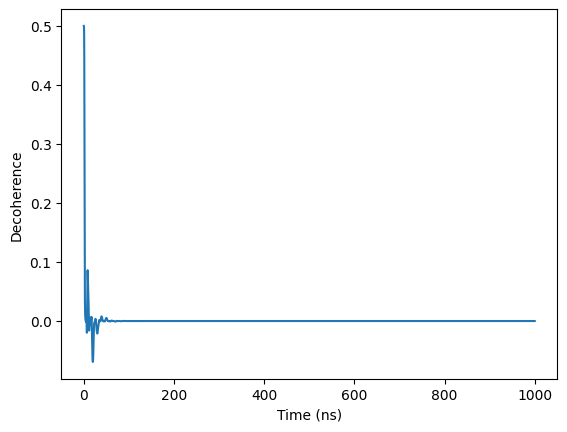

In [ ]:
tlist = np.linspace(0, 1000, 10000)
plt.plot(tlist, result.expect[1], label = 'n=1, N=8')
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Decoherence')

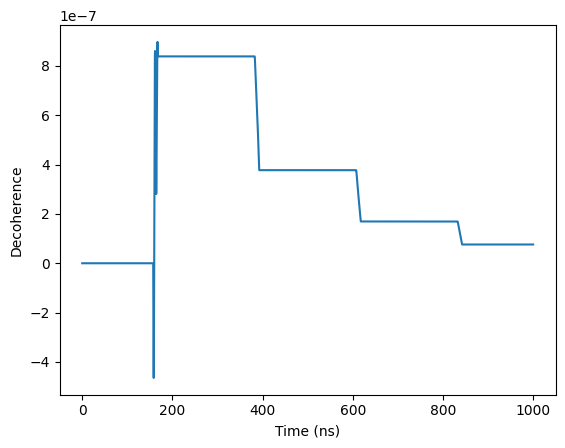

In [ ]:
tlist = np.linspace(0, 1000, 10000)
plt.plot(tlist, result.expect[0], label = 'n=1, N=8')
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

#### n=0.1

Text(0, 0.5, 'Decoherence')

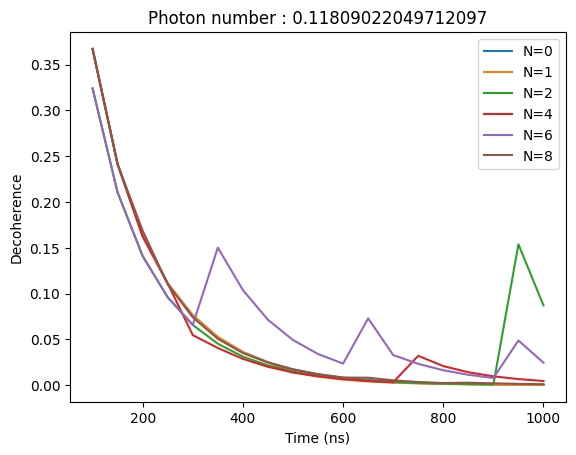

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[0][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[0]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

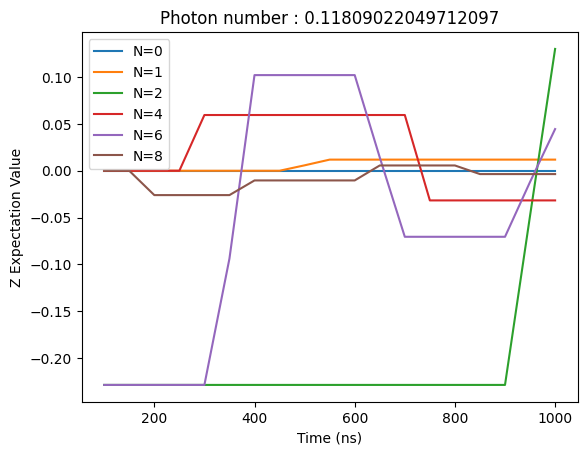

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[0][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[0]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.2

Text(0, 0.5, 'Decoherence')

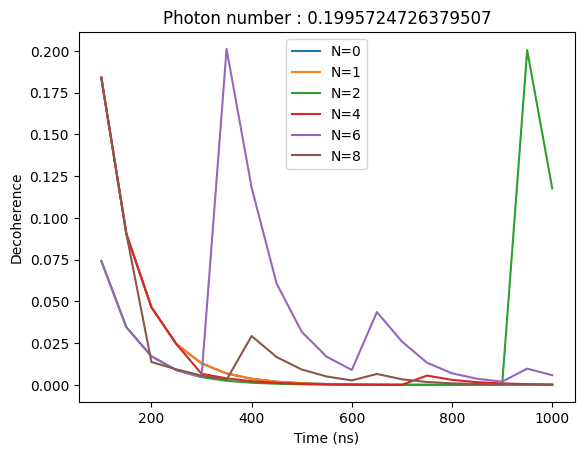

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[1][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[1]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

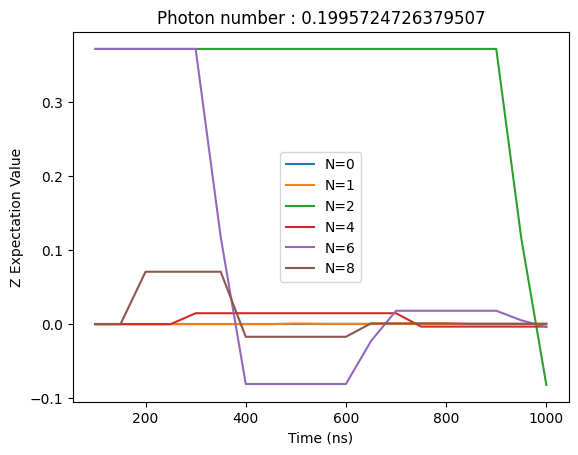

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[1][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[1]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.3

Text(0, 0.5, 'Decoherence')

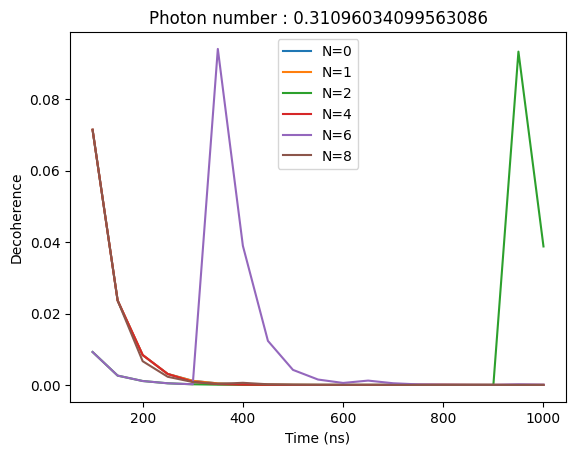

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[2][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[2]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

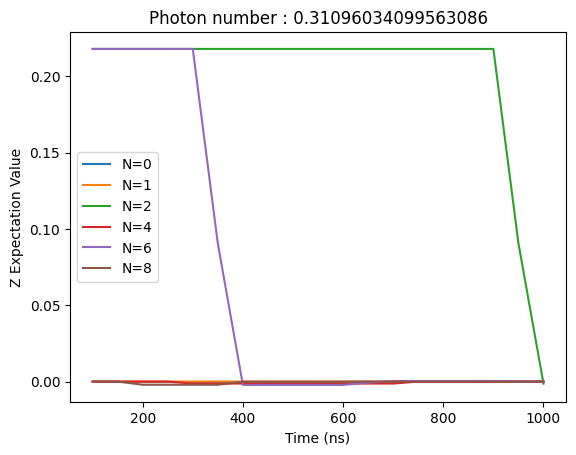

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[2][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[2]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.4

Text(0, 0.5, 'Decoherence')

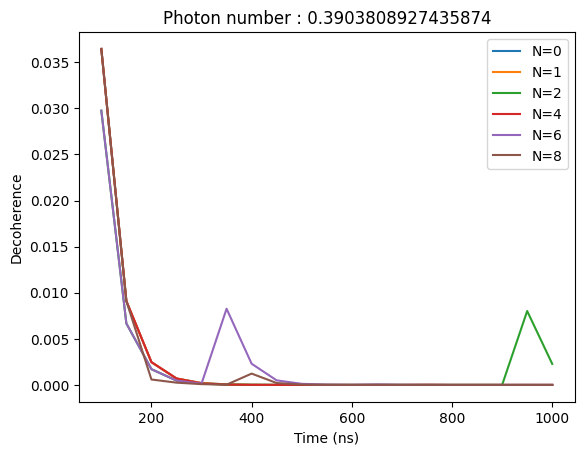

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[3][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[3]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

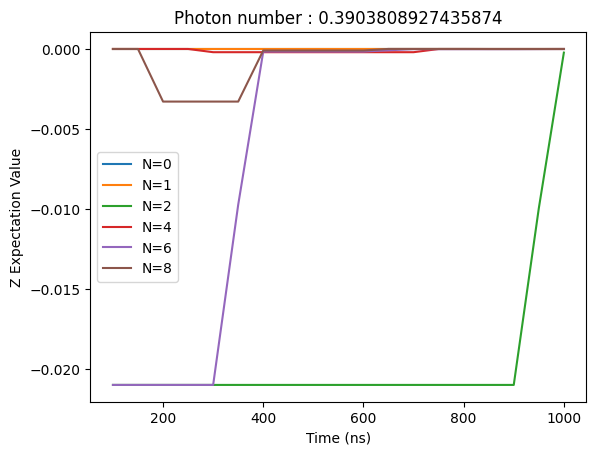

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[3][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[3]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.5

Text(0, 0.5, 'Decoherence')

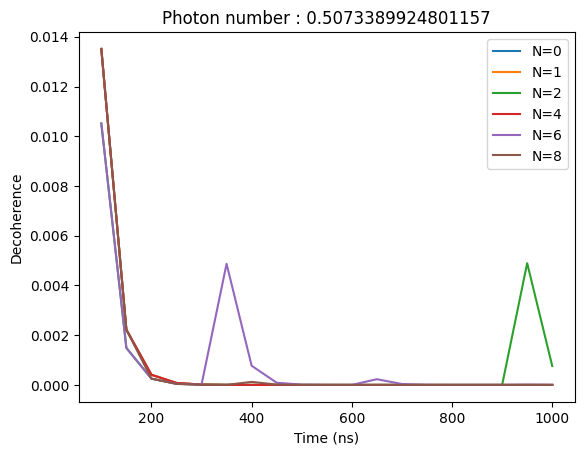

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[4][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[4]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

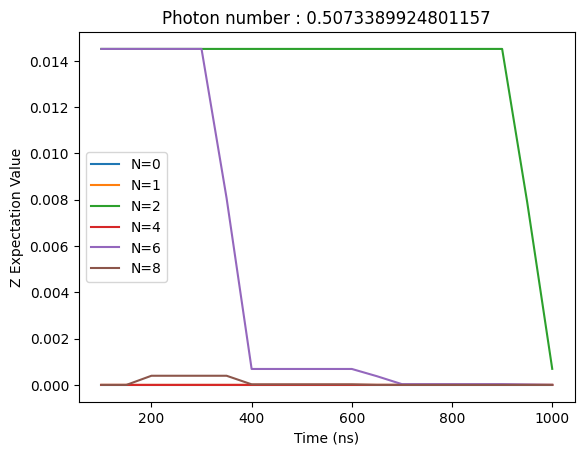

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[4][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[4]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.6

Text(0, 0.5, 'Decoherence')

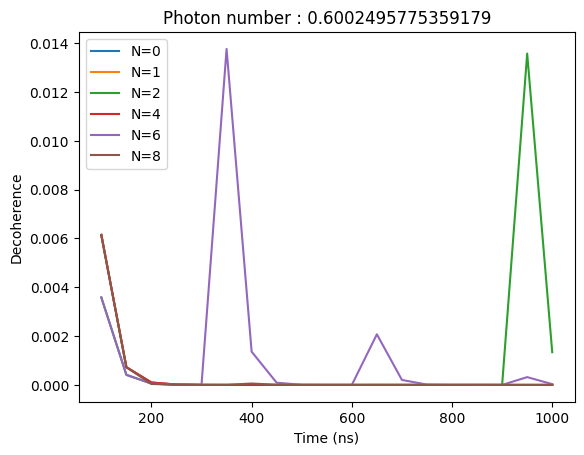

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[5][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[5]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

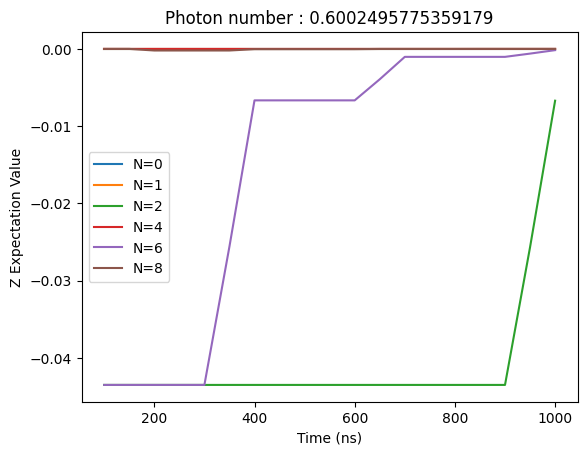

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[5][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[5]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.7

Text(0, 0.5, 'Decoherence')

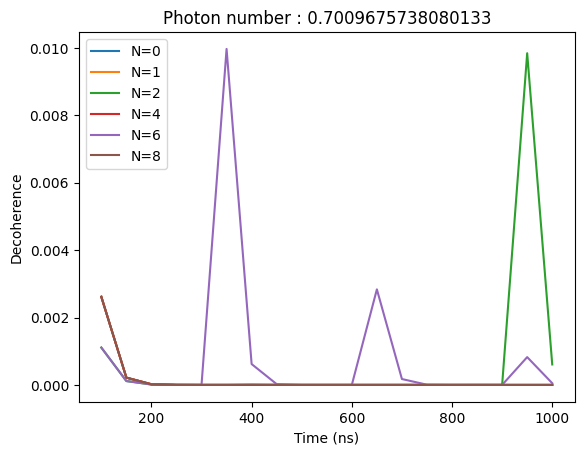

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[6][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[6]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

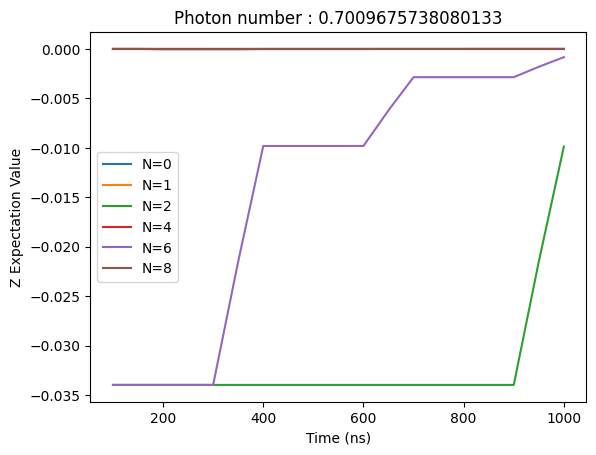

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[6][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[6]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.8

Text(0, 0.5, 'Decoherence')

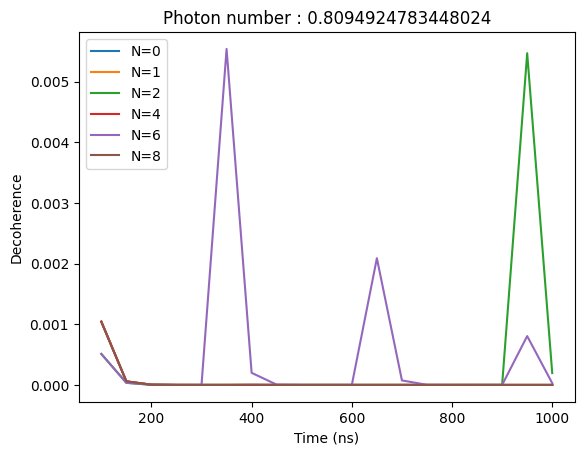

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[7][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[7]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

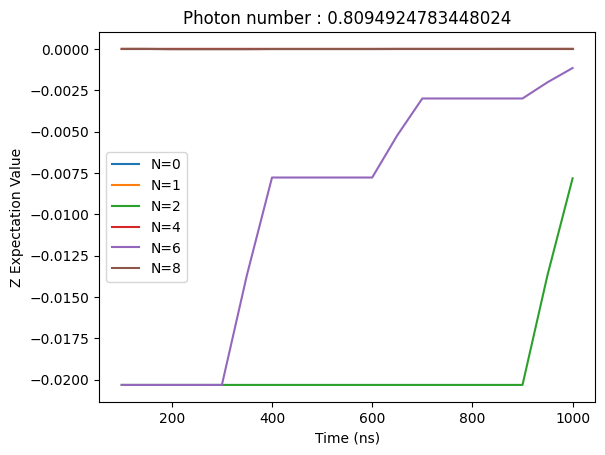

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[7][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[7]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.9

Text(0, 0.5, 'Decoherence')

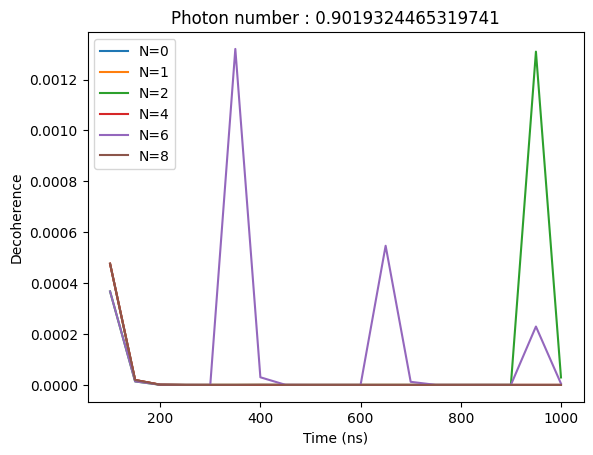

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[8][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[8]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

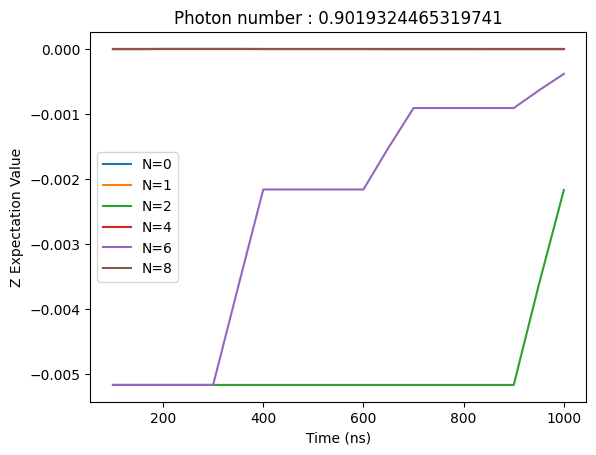

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[8][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[8]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=1.0

Text(0, 0.5, 'Decoherence')

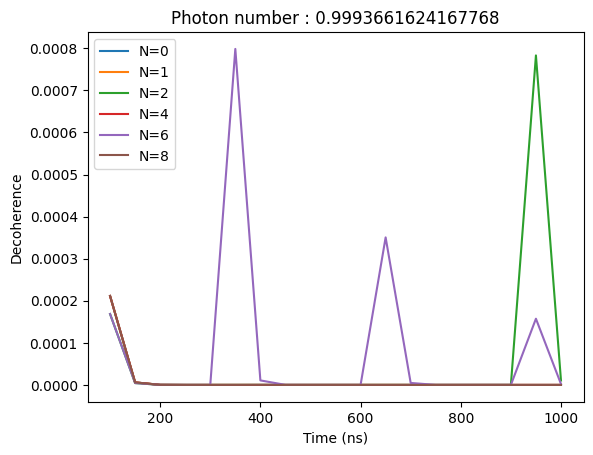

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[9][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

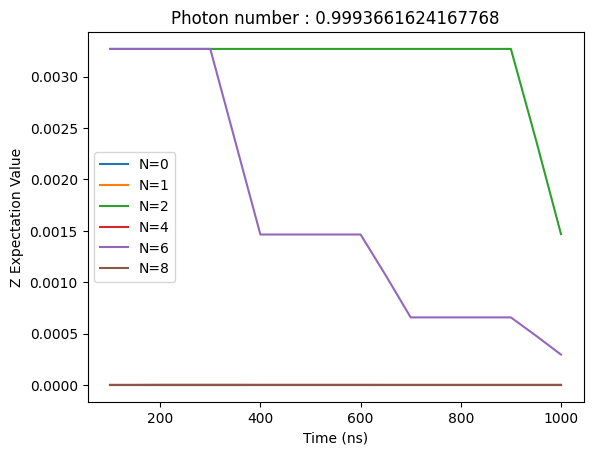

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[9][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

# 12. Measurement Induced Dephasing Dynamical Decoupling (n:0.1~1)

###1) Hamiltonian & Function Setting

Lab Frame

$H_0 = -\frac{\omega_q}{2}\sigma_z + \omega_r a^\dagger a + g\sigma_x(a+a^\dagger)$

$H_1 = A(t) (\hat{a} + \hat{a}^\dagger) \cos{(\omega_{rd} t)}$

$H_2 = B(t) \sigma_x \cos{(\omega_{qd} t)}$

Rotating Frame

$H_0 = -\frac{\omega_q-\omega_{qd}}{2}\sigma_z + ({\omega_r-\omega_{rd}})a^\dagger a + \chi\sigma_z(a^\dagger a)$

$H_1 = \frac{A(t)}{2} (\hat{a} + \hat{a}^\dagger) $

$H_2 = \frac{B(t)}{2}  \sigma_x $

In [46]:
# operator
N = 100

omega_r = 2 * np.pi * 7.0  # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0  # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 7.0  # qubit frequency in units of GHz
g = 2 * np.pi * 0.1        # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.01   # external coupling rate of resonator in units of GHz

In [47]:
sz = sigmaz()
sx = sigmax()
sy = sigmay()

sp = basis(2,1)*basis(2,0).dag()
sm = basis(2,0)*basis(2,1).dag()

a = destroy(N)

In [48]:
sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
sm_composite = tensor(sm, qeye(N))

annihilate_composite = tensor(qeye(2), a)
create_composite = tensor(qeye(2), a.dag())
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sx_composite, sy_composite, sz_composite, sp_composite, sm_composite, annihilate_composite, create_composite, number_composite]

psi_20 = tensor(basis(2,0), basis(N,0))
psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), basis(N,0))
psi_21 = tensor(basis(2,1), basis(N,0))

In [49]:
H0 = -0.5*(omega_q-omega_rd)*sz_composite + (omega_r-omega_rd)*number_composite + g*tensor(sx, a + a.dag())

H1 = 0.5*tensor(qeye(2), a + a.dag())

H2_x = 0.5*sx_composite

In [50]:
# single pi & half pi square pulse for drive

def Pi_Square(t, args, T_cent):

    A = args['A']

    return A * (t > T_cent-0.5*np.pi/A) * (t < T_cent+0.5*np.pi/A)

def Half_Pi_Square(t, args, T_cent):

    A = args['A']

    return 0.5 * A * (t > T_cent-0.5*np.pi/A) * (t < T_cent+0.5*np.pi/A)

In [51]:
# time-dependent envelope for drive

def Hrd_env(Env, Is_Pi):

  if (Env==0 and Is_Pi==0):
    return Half_Pi_Square

  elif (Env==0 and Is_Pi==1):
    return Pi_Square

# time-dependent function for drive

def Hrd_rot(f, t, args, T_cent):

    Omega_rd = args['Omega_rd']
    Phi = args['Phi']

    return f(t, args, T_cent) * np.cos(Omega_rd * t + Phi)

In [52]:
# Modulate each pulse timing
# pulse list
# pi/2 pulse at T_srt, T_end
# pi pulse at pulse time list

def Pulse_Timing(T_srt, T_end, N, Func):

    T = T_end - T_srt

    Seq_list = []

    if (Func==2) :
      shift = 0
      for i in range(N):
        shift = shift + T * np.sin(np.pi/(2*(N+2))) * np.sin(np.pi*(i+1)/(N+2)) / np.cos(np.pi/(2*(N+2)))
        Seq_list.append(T_srt + shift)

    else :
      for i in range(N):
        Seq_list.append(T_srt + (2*i+1)*T/(2*N))

    Seq = np.array(Seq_list)

    return Seq

In [53]:
# time-dependent envelope for qubit drive (rotating frame)

# args

# A (amplitude)
# Omega_rd (frequency)
# T_srt (pulse start time)
# T_end (pulse end time)
# N (number of pulse)
# Env (0: square envelope, 1: cosine envelope, 2: gaussian envelope)
# Func (0: CP, 1: CPMG, 2: UDD)

def Hqd_rotating_frame(t, args):

    T_srt = args['T_srt']
    T_end = args['T_end']
    N = args['N_seq']
    Env = args['Env']
    Func = args['Func']

    B = args['B']


    # T_cent
    Seq = Pulse_Timing(T_srt, T_end, N, Func)


    f = Hrd_env(Env, 0)
    pulse = f(t, {'A': B}, T_srt)

    for T_cent in Seq:
      f = Hrd_env(Env, 1)
      pulse = pulse + f(t, {'A': B}, T_cent)

    f = Hrd_env(Env, 0)
    pulse = pulse + f(t, {'A': B}, T_end)

    return pulse

In [54]:
# time-dependent coefficient for resonator drive

def Hrd_rotating_frame(t, args):
    """
    Envelope function for the readout drive
    """
    A = args['A'] # amplitude of the readout drive
    T_srt = args['T_srt'] # duration of the readout drive, in units of ns
    T_end = args['T_end'] # duration of the readout drive, in units of ns

    return A * (T_srt <= t) * (t <= T_end)

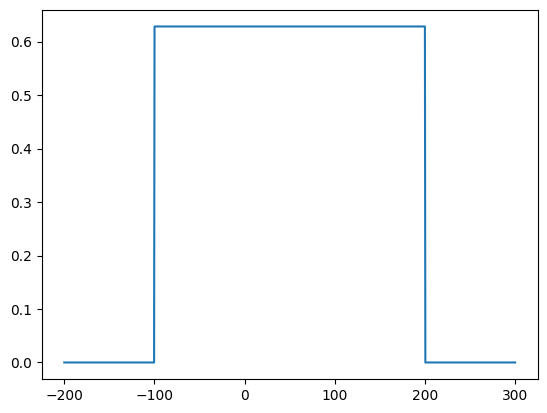

In [55]:
# resonator pulse simulation (rotating frame)
tlist = np.linspace(-200, 300, 1000)
plt.figure()
plt.plot(tlist, Hrd_rotating_frame(tlist, {'A': 2*np.pi*0.1, 'T_srt': -100, 'T_end': 200}))

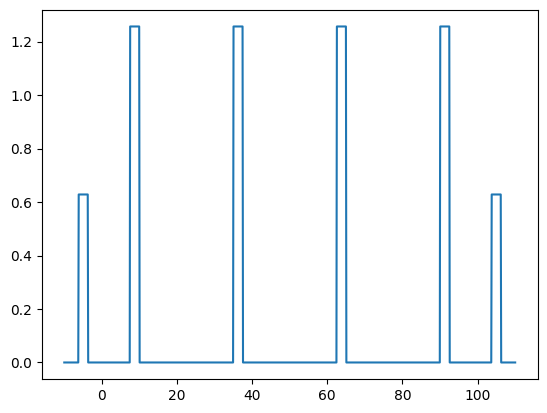

In [56]:
# qubit pulse simulation (rotating frame)
tlist = np.linspace(-10, 110, 1000)
plt.figure()
plt.plot(tlist, Hqd_rotating_frame(tlist, {'B': 2*np.pi*0.2, 'T_srt': -5, 'T_end': 105, 'N_seq': 4, 'Env': 0, 'Func': 0}))

### 2) Photon Number n

kappa = 2 * np.pi * 0.01

In [59]:
A = [0.06, 0.09, 0.11, 0.128, 0.143, 0.1555, 0.1675, 0.1785, 0.1895, 0.20]

In [60]:
N = 10

omega_r = 2 * np.pi * 7.0  # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0  # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 7.0 # qubit frequency in units of GHz
g = 2 * np.pi * 0.1        # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.01   # external coupling rate of resonator in units of GHz

sz = sigmaz()
sx = sigmax()
sy = sigmay()
sp = basis(2,1)*basis(2,0).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
annihilate_composite = tensor(qeye(2), a)
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sx_composite, sy_composite, sz_composite, sp_composite, annihilate_composite, number_composite]

psi_20 = tensor(basis(2,0), basis(N,0))
psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), basis(N,0))
psi_21 = tensor(basis(2,1), basis(N,0))

H0 = (omega_r-omega_rd)*number_composite + g*tensor(sz, a.dag()*a)
H1 = 0.5*tensor(qeye(2), a + a.dag())
H2 = 0.5*sx_composite

tlist = np.linspace(0, 1000, 10000)

In [61]:
plus_list = []
alpha_list = []
n_list = []
for i in range(10):
  result = mesolve(
    [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'B': 2*np.pi*0.1, 'T_srt': -20, 'T_end': 50*20+20, 'N_seq': 0, 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T': 1500},
    e_ops = op_list,
    options = Options(nsteps = 100000, atol = 1e-10, rtol = 1e-8)
  )

  plus_list.append(result.expect[3])
  alpha_list.append(result.expect[4])
  n_list.append(result.expect[5])

/usr/local/lib/python3.10/dist-packages/qutip/solver/options.py:16: FutureWarning: Dedicated options class are no longer needed, options should be passed as dict to solvers.
  warnings.warn(


/usr/local/lib/python3.10/dist-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


Text(0, 0.5, 'Off Diagonal Term Expectation Value')

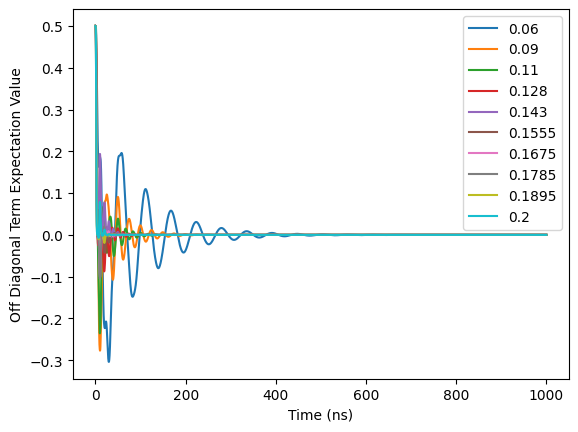

In [62]:
# Plot off-diagonal term expectation value

fig, ax = plt.subplots(1, 1)

for i in range(10):
  ax.plot(tlist, plus_list[i], label = '{0}'.format(A[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Off Diagonal Term Expectation Value')

Text(0, 0.5, 'Photon Number Expectation Value')

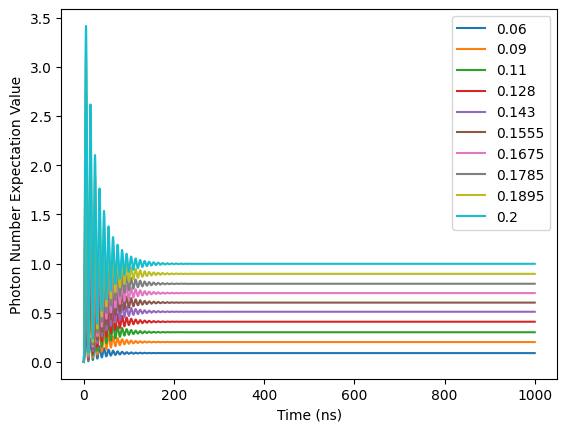

In [63]:
# Plot photon number expectation value

fig, ax = plt.subplots(1, 1)

for i in range(10):
  ax.plot(tlist, n_list[i], label = '{0}'.format(A[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Photon Number Expectation Value')

In [64]:
for i in range(10):
  print(alpha_list[i][-1])

(-1.058142632371176e-17-0.014962593443158001j)
(9.268503853081168e-18-0.022443890246036078j)
(-1.937109523805609e-17-0.027431421384241393j)
(7.047525879392592e-18-0.03192019918222264j)
(-7.976764697666903e-17-0.03566084636200282j)
(5.217500608937836e-17-0.03877804903754499j)
(4.8342287882171056e-17-0.04177055239889366j)
(-3.725568539379633e-17-0.04451365200805337j)
(-6.617656658661035e-17-0.04725668075587227j)
(3.515525544284248e-17-0.049874871963608895j)


In [65]:
for i in range(10):
  print(n_list[i][-1])

0.08977556065894239
0.20199501221432384
0.3017456352266455
0.40857854953243367
0.5099501029765885
0.6029986625338065
0.6996567526814286
0.7945686883437783
0.8955141003236922
0.9974974392720425


### 3) Photon Number n

kappa = 2 * np.pi * 0.005

In [ ]:
A = [0.06875, 0.089375, 0.1115625, 0.125, 0.1425, 0.155, 0.1675, 0.18, 0.19, 0.20]

In [ ]:
N = 10

omega_r = 2 * np.pi * 7.0   # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0   # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 7.0  # qubit frequency in units of GHz
g = 2 * np.pi * 0.1         # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.005   # external coupling rate of resonator in units of GHz

sz = sigmaz()
sx = sigmax()
sy = sigmay()
sp = basis(2,1)*basis(2,0).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
annihilate_composite = tensor(qeye(2), a)
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sx_composite, sy_composite, sz_composite, sp_composite, number_composite]

psi_20 = tensor(basis(2,0), basis(N,0))
psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), basis(N,0))
psi_21 = tensor(basis(2,1), basis(N,0))

H0 = (omega_r-omega_rd)*number_composite + g*tensor(sz, a.dag()*a)
H1 = 0.5*tensor(qeye(2), a + a.dag())
H2 = 0.5*sx_composite

tlist = np.linspace(0, 1000, 10000)

In [ ]:
plus_list = []
n_list = []
for i in range(10):
  result = mesolve(
    [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'B': 2*np.pi*0.1, 'T_srt': -20, 'T_end': 50*20+20, 'N_seq': 0, 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T': 1500},
    e_ops = op_list,
    options = Options(nsteps = 100000, atol = 1e-10, rtol = 1e-8)
  )

  plus_list.append(result.expect[3])
  n_list.append(result.expect[4])

Text(0, 0.5, 'Off Diagonal Term Expectation Value')

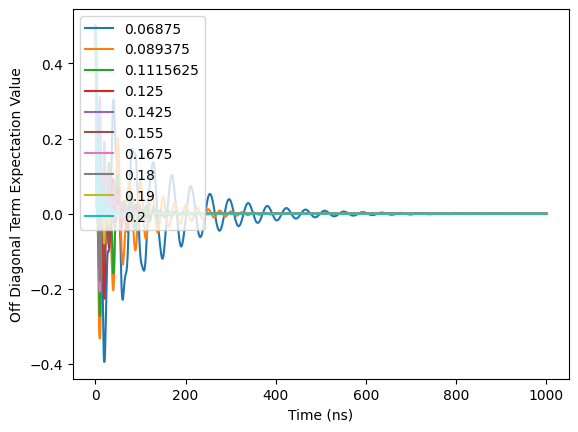

In [ ]:
# Plot off-diagonal term expectation value

fig, ax = plt.subplots(1, 1)

for i in range(10):
  ax.plot(tlist, plus_list[i], label = '{0}'.format(A[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Off Diagonal Term Expectation Value')

Text(0, 0.5, 'Photon Number Expectation Value')

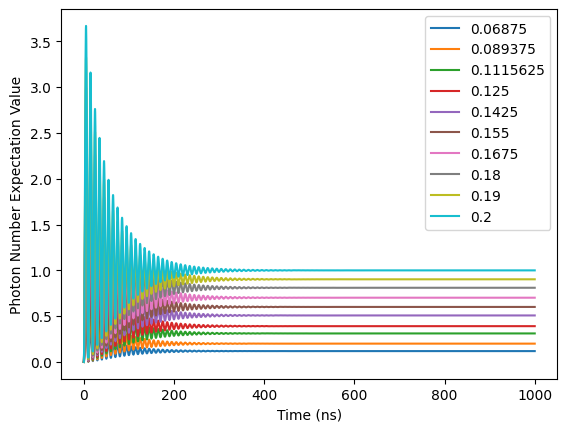

In [ ]:
# Plot photon number expectation value

fig, ax = plt.subplots(1, 1)

for i in range(10):
  ax.plot(tlist, n_list[i], label = '{0}'.format(A[i]))

ax.legend(loc = 0)
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Photon Number Expectation Value')

In [ ]:
for i in range(10):
  print(n_list[i][-1])

0.11809022049712097
0.1995724726379507
0.31096034099563086
0.3903808927435874
0.5073389924801157
0.6002495775359179
0.7009675738080133
0.8094924783448024
0.9019324465319741
0.9993661624167768


### 4) Off Diagonal Term Evolution B=0.05GHz

Resonator Dissipation Rate : $\kappa = 2π · 0.01$

Initial State $\frac{|0\rangle+|1\rangle}{\sqrt{2}}$

Result :


In [ ]:
A =     [0.06, 0.09, 0.11, 0.128, 0.143, 0.1555, 0.1675, 0.1785, 0.1895, 0.20]
n_exp = [0.08977556109725598, 0.20199501246881987, 0.30174563591021286, 0.4085785536159459, 0.5099501246882583, 0.6029987531171759, 0.6996571072318886, 0.7945698254363642, 0.8955174563590734, 0.9975062344139239]
N_seq = [0,1,2,4,6,8]
tau_list = [50*(k+2) for k in range(19)]

z_tot = []
plus_tot = []

In [ ]:
N = 10

omega_r = 2 * np.pi * 7.0  # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0  # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 7.0 # qubit frequency in units of GHz
g = 2 * np.pi * 0.1        # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.01   # external coupling rate of resonator in units of GHz

sz = sigmaz()
sx = sigmax()
sy = sigmay()
sp = basis(2,1)*basis(2,0).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
annihilate_composite = tensor(qeye(2), a)
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sz_composite, sp_composite]

psi_20 = tensor(basis(2,0), basis(N,0))
psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), basis(N,0))
psi_21 = tensor(basis(2,1), basis(N,0))

In [ ]:
# iterate for photon number n
for i in range(10):

  H0 = (omega_r-omega_rd)*number_composite + g*tensor(sz, a.dag()*a)
  H1 = 0.5*tensor(qeye(2), a + a.dag())
  H2 = 0.5*sx_composite

  z_n = []
  plus_n = []


  # iterate for pi-pulse time N
  for j in range(6):

    z = []
    plus = []


    # iterate for evolution time 50ns ~ 1000ns
    for k in range(19):

      # Simulation
      tlist = np.linspace(0, 50*(k+2), 500*(k+2))

      result = mesolve(
        [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
        psi_2s,
        tlist,
        c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
        args = {'B': 2*np.pi*0.05, 'T_srt': -10, 'T_end': 50*(k+2)+10, 'N_seq': N_seq[j], 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T_srt': 0, 'T_end': 1500},
        e_ops = op_list,
        options = Options(nsteps = 5000*(k+2), atol = 1e-10, rtol = 1e-8)
      )

      z_sub = result.expect[0]
      plus_sub = result.expect[1]

      z.append(z_sub[-1])
      plus.append(np.abs(2*plus_sub[-1]))

    z_n.append(z)
    plus_n.append(plus)

  z_tot.append(z_n)
  plus_tot.append(plus_n)

  print(i)

0
1
2
3
4
5
6
7
8
9


Text(0, 0.5, 'Decoherence')

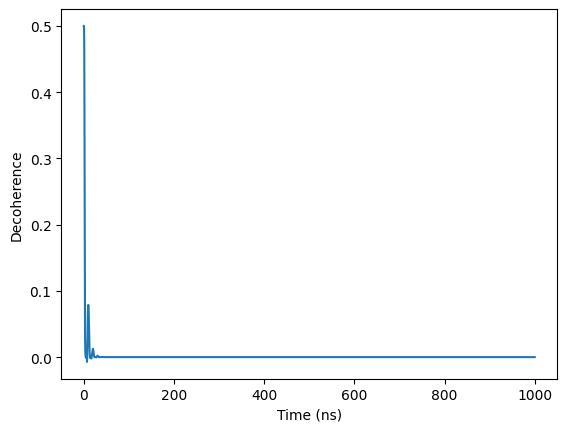

In [ ]:
tlist = np.linspace(0, 1000, 10000)
plt.plot(tlist, result.expect[1], label = 'n=1, N=8')
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Decoherence')

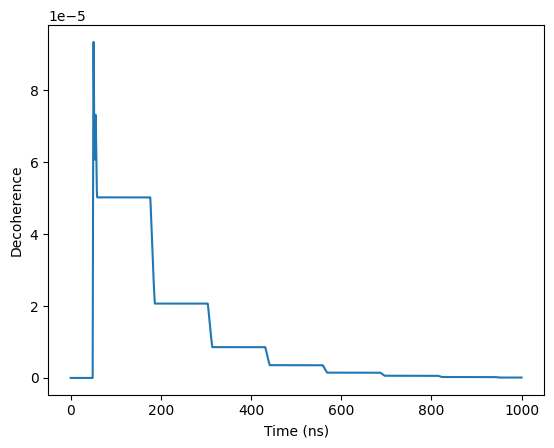

In [ ]:
tlist = np.linspace(0, 1000, 10000)
plt.plot(tlist, result.expect[0], label = 'n=1, N=8')
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

#### n=0.1

Text(0, 0.5, 'Decoherence')

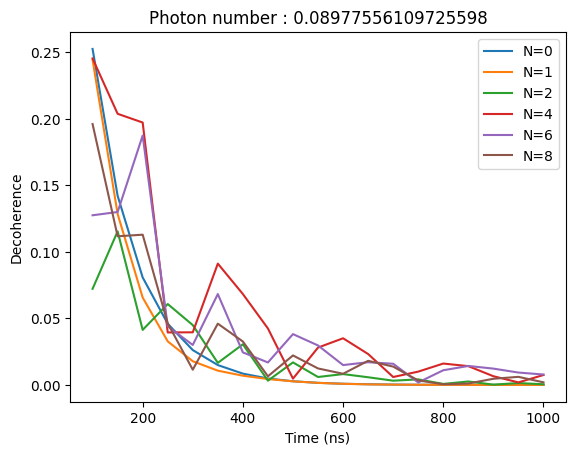

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[0][j], label = 'N={0}'.format(N_seq[j]))

plt.legend(loc = 0)
plt.title('Photon number : {0}'.format(n_exp[0]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

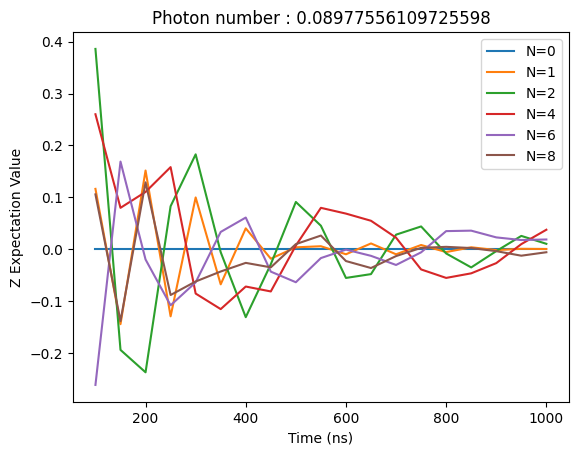

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[0][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[0]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.2

Text(0, 0.5, 'Decoherence')

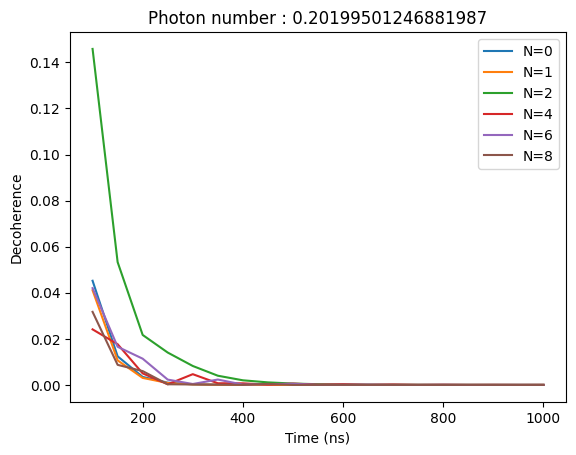

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[1][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[1]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

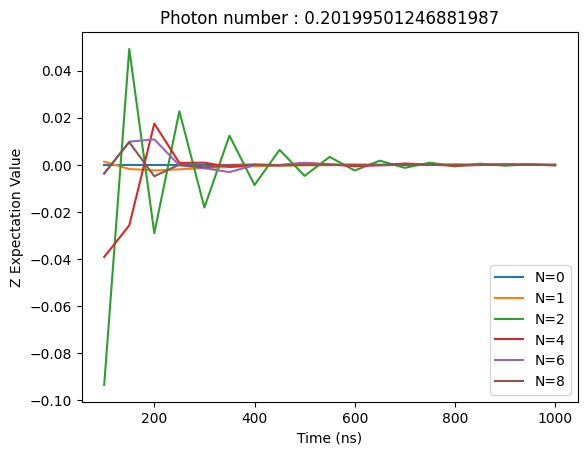

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[1][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[1]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.3

Text(0, 0.5, 'Decoherence')

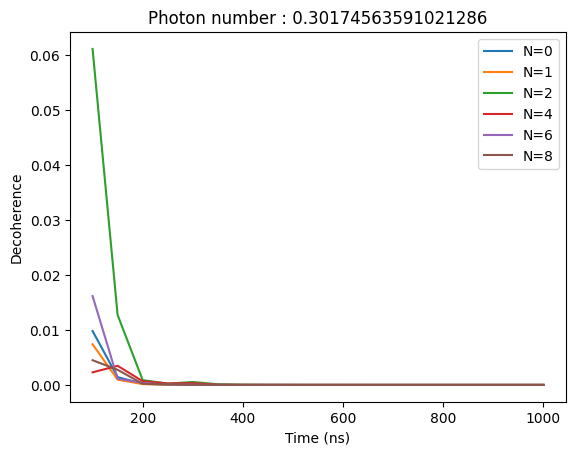

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[2][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[2]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

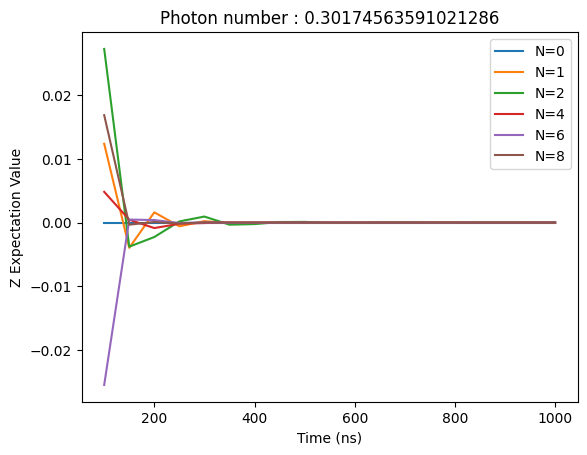

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[2][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[2]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.4

Text(0, 0.5, 'Decoherence')

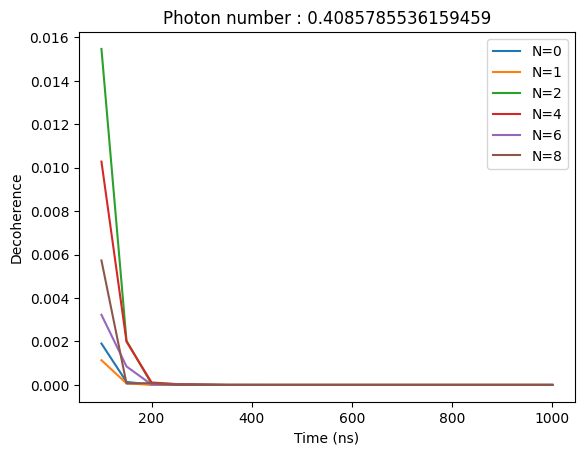

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[3][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[3]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

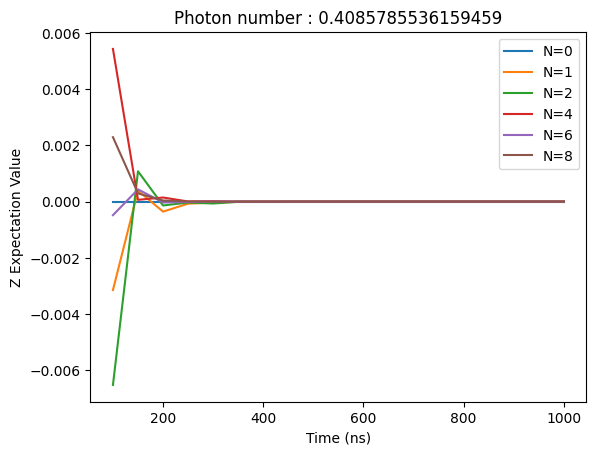

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[3][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[3]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.5

Text(0, 0.5, 'Decoherence')

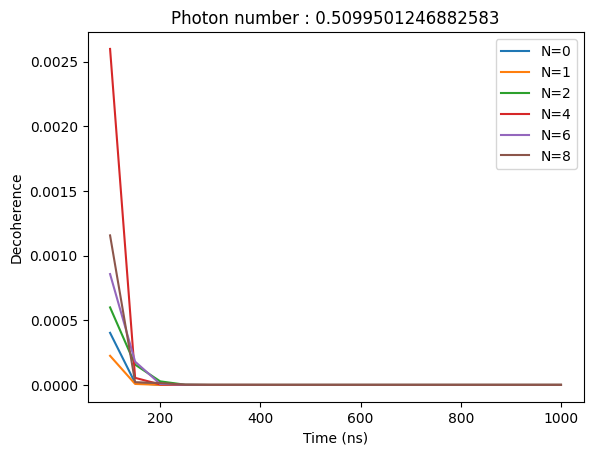

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[4][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[4]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

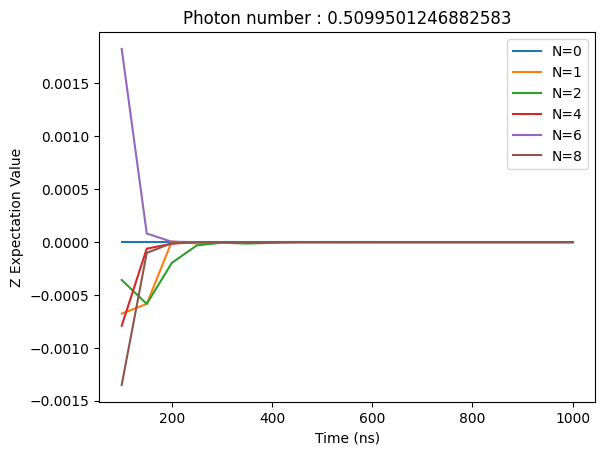

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[4][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[4]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.6

Text(0, 0.5, 'Decoherence')

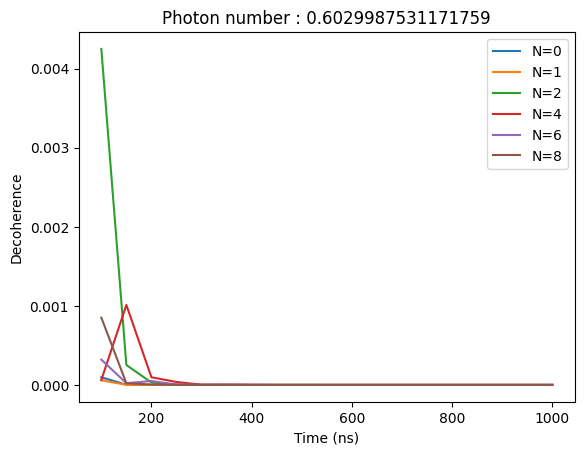

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[5][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[5]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

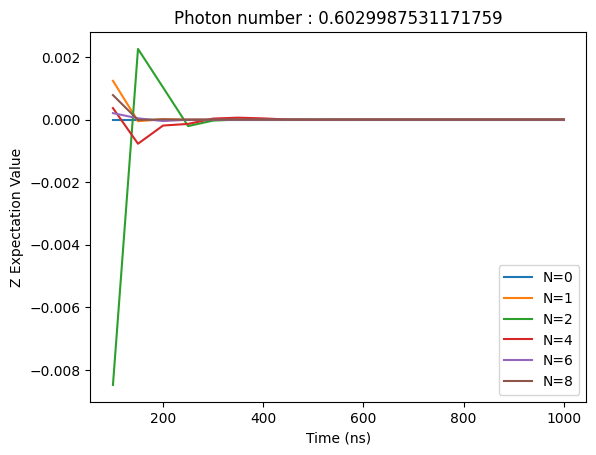

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[5][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[5]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.7

Text(0, 0.5, 'Decoherence')

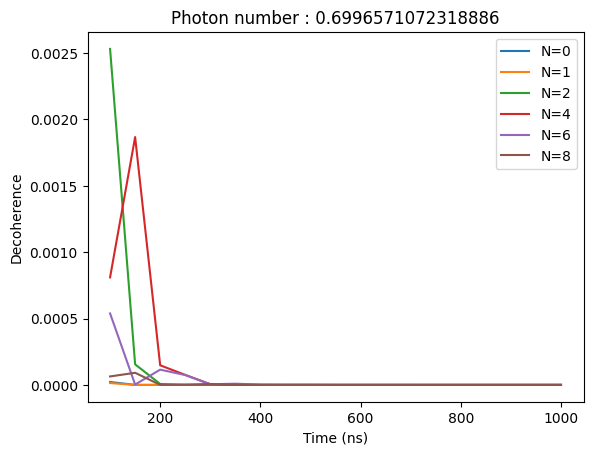

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[6][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[6]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

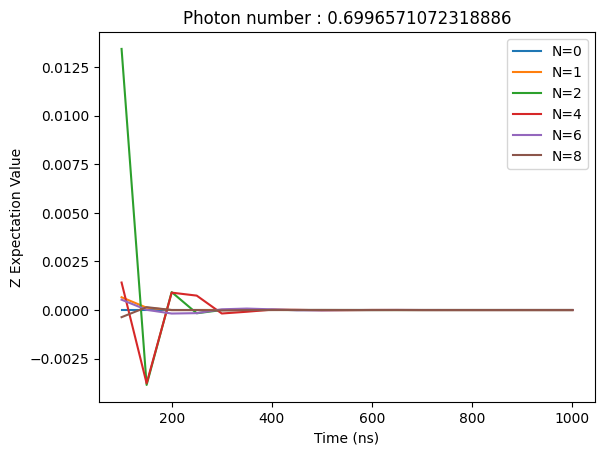

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[6][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[6]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.8

Text(0, 0.5, 'Decoherence')

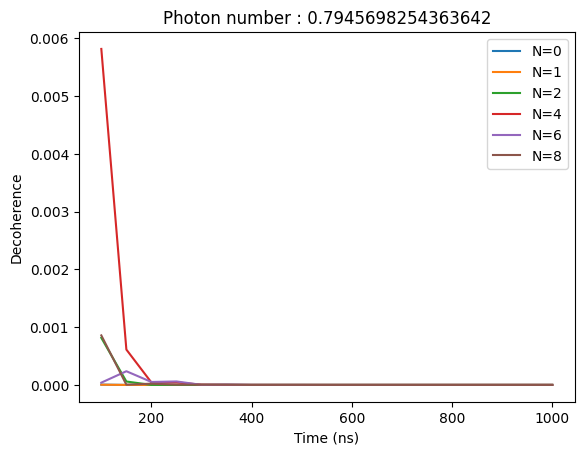

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[7][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[7]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

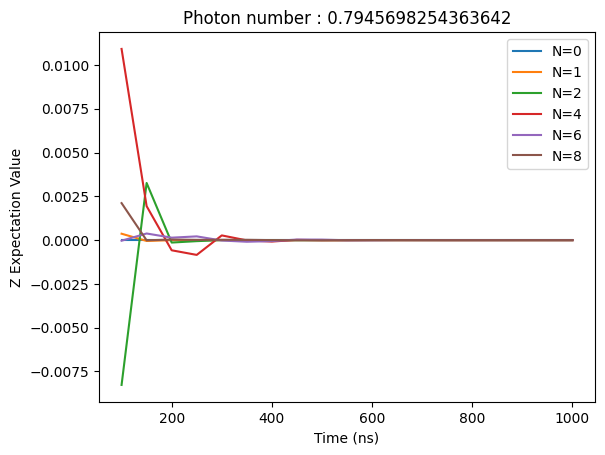

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[7][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[7]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.9

Text(0, 0.5, 'Decoherence')

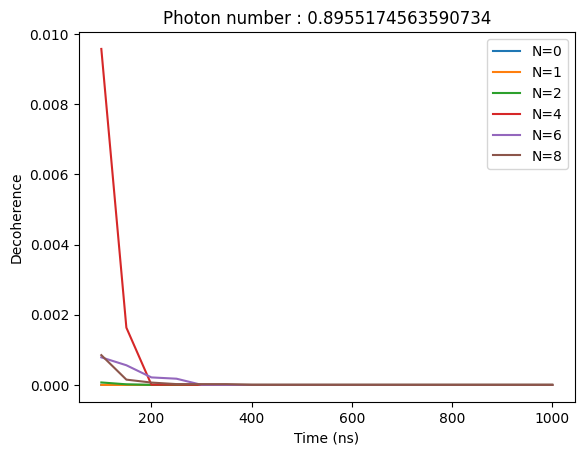

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[8][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[8]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

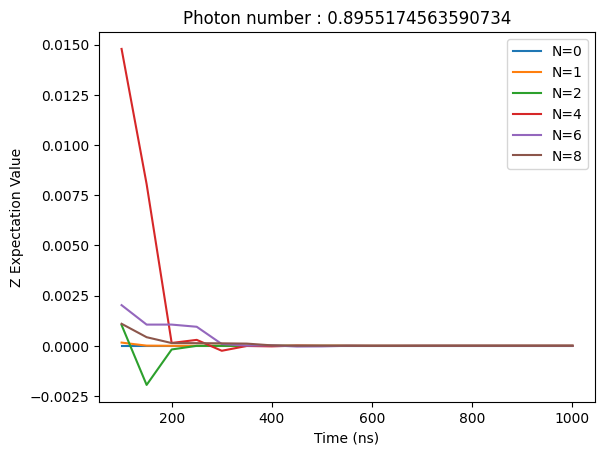

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[8][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[8]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=1.0

Text(0, 0.5, 'Decoherence')

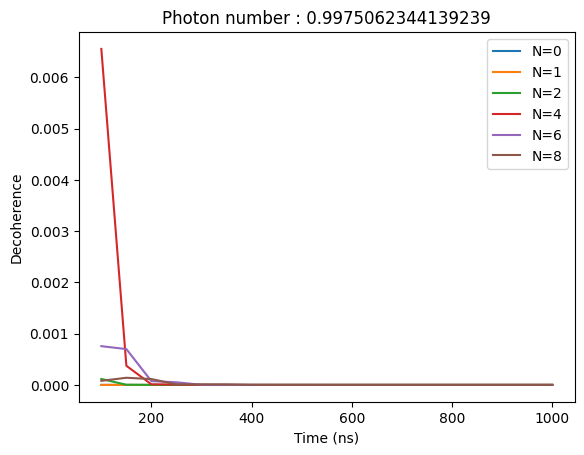

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[9][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

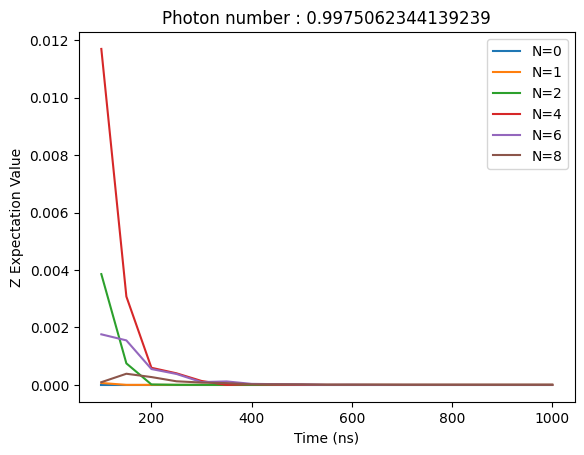

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[9][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

### 5) Off Diagonal Term Evolution B=0.05GHz with AC Stark Shift Detune

Resonator Dissipation Rate : $\kappa = 2π · 0.01$

Initial State $\frac{|0\rangle+|1\rangle}{\sqrt{2}}$

Result :


In [ ]:
A =     [0.06, 0.09, 0.11, 0.128, 0.143, 0.1555, 0.1675, 0.1785, 0.1895, 0.20]
n_exp = [0.08977556109725598, 0.20199501246881987, 0.30174563591021286, 0.4085785536159459, 0.5099501246882583, 0.6029987531171759, 0.6996571072318886, 0.7945698254363642, 0.8955174563590734, 0.9975062344139239]
alpha_exp = [(-1.058142632371176e-17-0.014962593443158001j),
(9.268503853081168e-18-0.022443890246036078j),
(-1.937109523805609e-17-0.027431421384241393j),
(7.047525879392592e-18-0.03192019918222264j),
(-7.976764697666903e-17-0.03566084636200282j),
(5.217500608937836e-17-0.03877804903754499j),
(4.8342287882171056e-17-0.04177055239889366j),
(-3.725568539379633e-17-0.04451365200805337j),
(-6.617656658661035e-17-0.04725668075587227j),
(3.515525544284248e-17-0.049874871963608895j)]
N_seq = [0,1,2,4,6,8]
tau_list = [50*(k+2) for k in range(19)]

z_tot = []
plus_tot = []

In [ ]:
N = 10

omega_r = 2 * np.pi * 7.0  # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0  # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 7.0 # qubit frequency in units of GHz
g = 2 * np.pi * 0.1        # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.01   # external coupling rate of resonator in units of GHz
kai = g*g/(omega_r-omega_q)

sz = sigmaz()
sx = sigmax()
sy = sigmay()
sp = basis(2,1)*basis(2,0).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
annihilate_composite = tensor(qeye(2), a)
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sz_composite, sp_composite]

psi_20 = tensor(basis(2,0), basis(N,0))
psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), basis(N,0))
psi_21 = tensor(basis(2,1), basis(N,0))

In [ ]:
# iterate for photon number n
for i in range(10):

  H0 = +kai*n_exp[i]*sz_composite + (omega_r-omega_rd)*number_composite + g*tensor(sz, a.dag()*a)
  H1 = 0.5*tensor(qeye(2), a + a.dag())
  H2 = 0.5*sx_composite

  z_n = []
  plus_n = []


  # iterate for pi-pulse time N
  for j in range(6):

    z = []
    plus = []


    # iterate for evolution time 50ns ~ 1000ns
    for k in range(19):

      # Simulation
      tlist = np.linspace(0, 50*(k+2), 500*(k+2))

      result = mesolve(
        [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
        psi_2s,
        tlist,
        c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
        args = {'B': 2*np.pi*0.05, 'T_srt': -10, 'T_end': 50*(k+2)+10, 'N_seq': N_seq[j], 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T_srt': 0, 'T_end': 1500},
        e_ops = op_list,
        options = Options(nsteps = 5000*(k+2), atol = 1e-10, rtol = 1e-8)
      )

      z_sub = result.expect[0]
      plus_sub = result.expect[1]

      z.append(z_sub[-1])
      plus.append(np.abs(2*plus_sub[-1]))

    z_n.append(z)
    plus_n.append(plus)

  z_tot.append(z_n)
  plus_tot.append(plus_n)

  print(i)

0
1
2
3
4
5
6
7
8
9


/usr/local/lib/python3.10/dist-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


Text(0, 0.5, 'Decoherence')

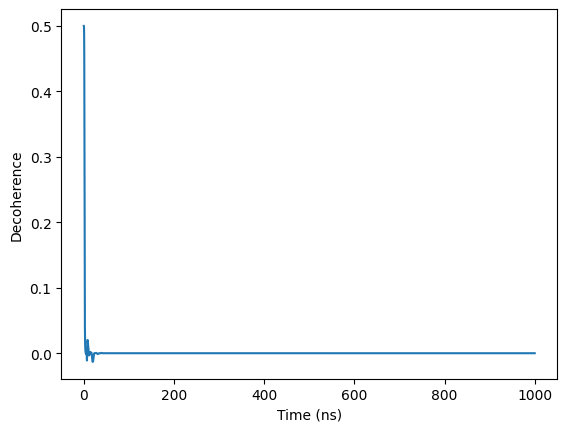

In [ ]:
tlist = np.linspace(0, 1000, 10000)
plt.plot(tlist, result.expect[1], label = 'n=1, N=8')
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Decoherence')

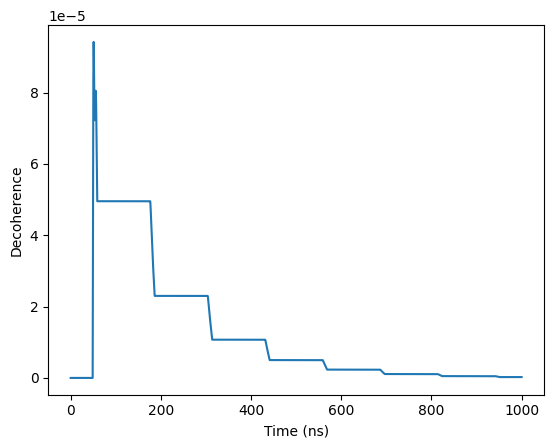

In [ ]:
tlist = np.linspace(0, 1000, 10000)
plt.plot(tlist, result.expect[0], label = 'n=1, N=8')
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

#### n=0.1

Text(0, 0.5, 'Decoherence')

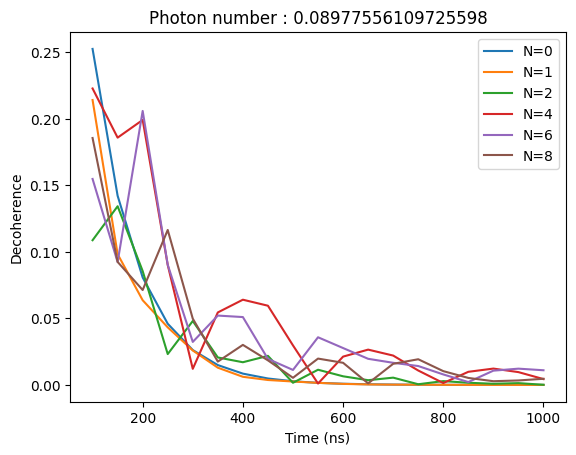

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[0][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[0]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

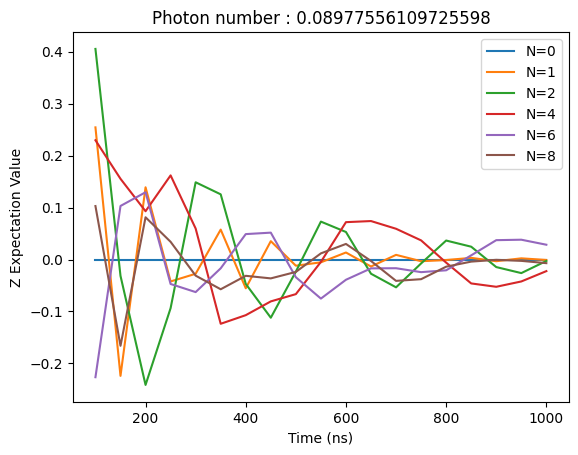

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[0][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[0]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.2

Text(0, 0.5, 'Decoherence')

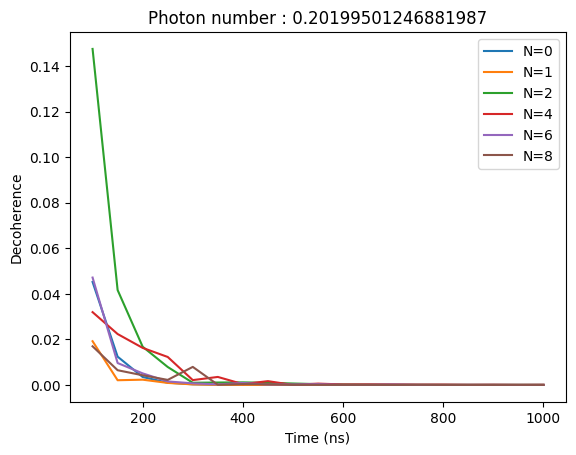

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[1][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[1]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

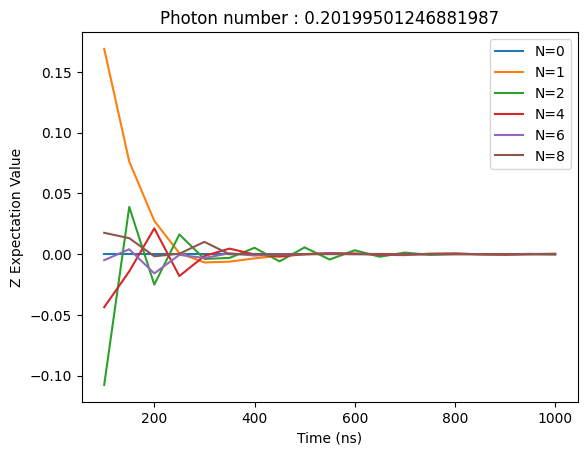

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[1][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[1]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.3

Text(0, 0.5, 'Decoherence')

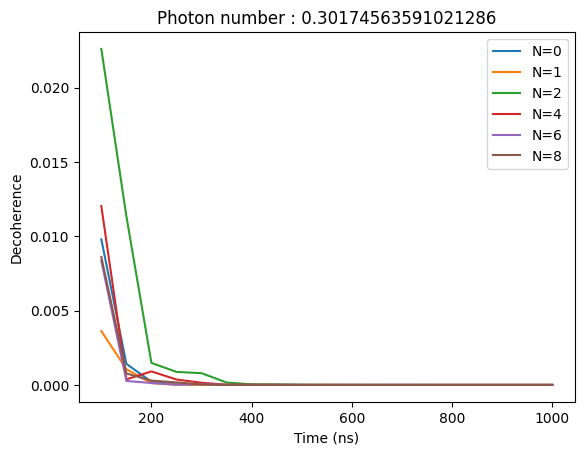

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[2][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[2]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

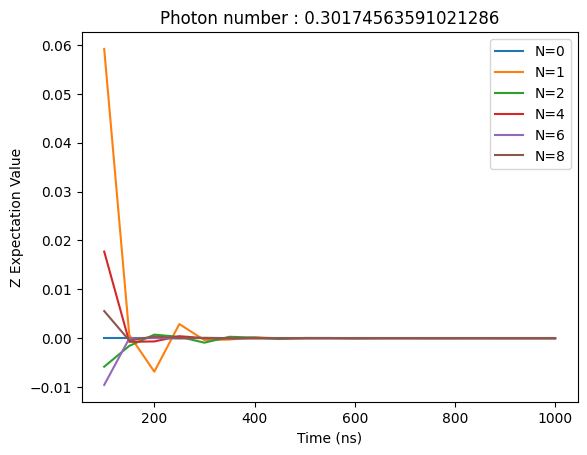

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[2][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[2]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.4

Text(0, 0.5, 'Decoherence')

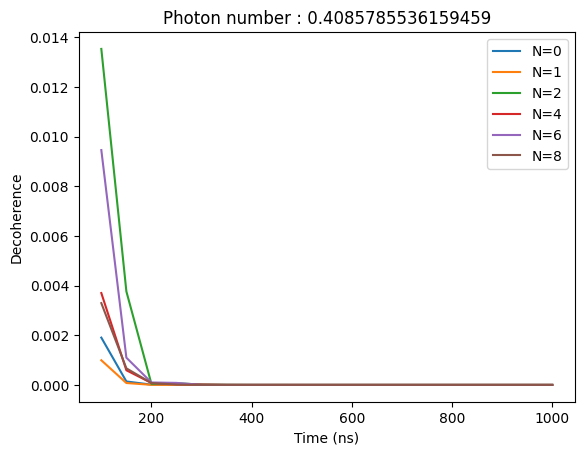

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[3][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[3]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

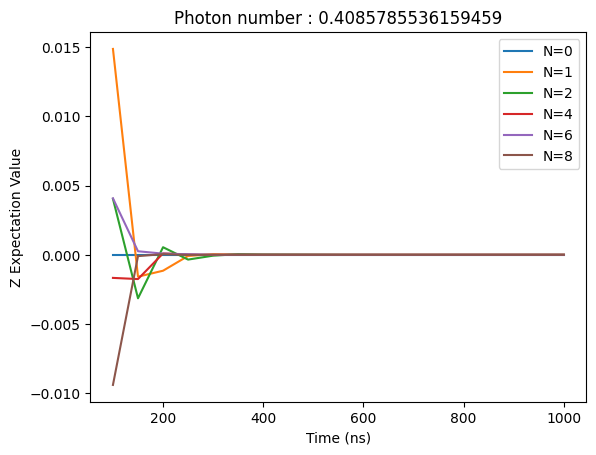

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[3][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[3]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.5

Text(0, 0.5, 'Decoherence')

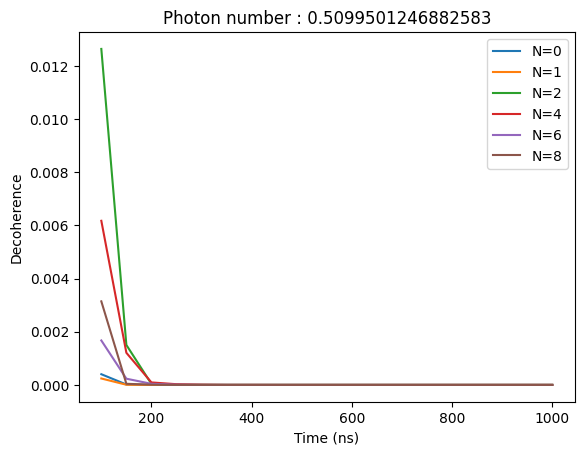

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[4][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[4]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

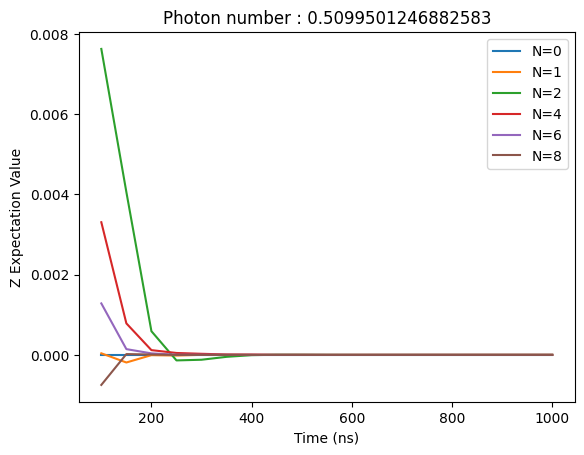

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[4][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[4]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.6

Text(0, 0.5, 'Decoherence')

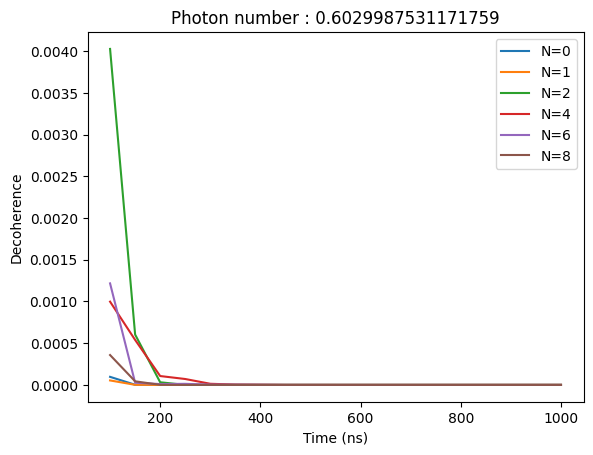

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[5][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[5]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

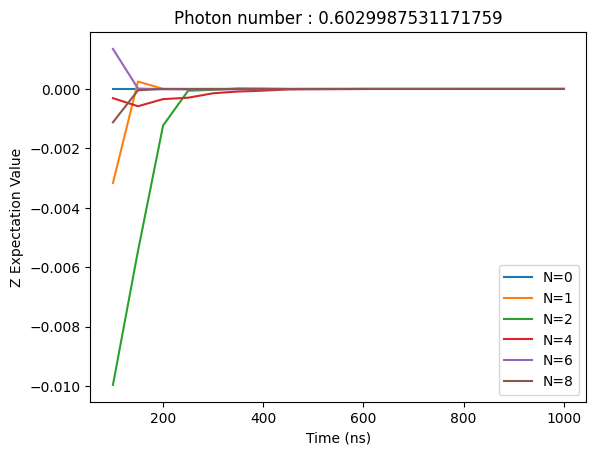

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[5][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[5]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.7

Text(0, 0.5, 'Decoherence')

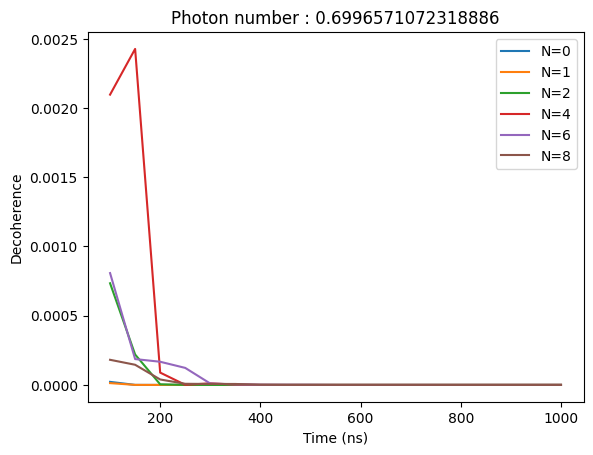

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[6][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[6]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

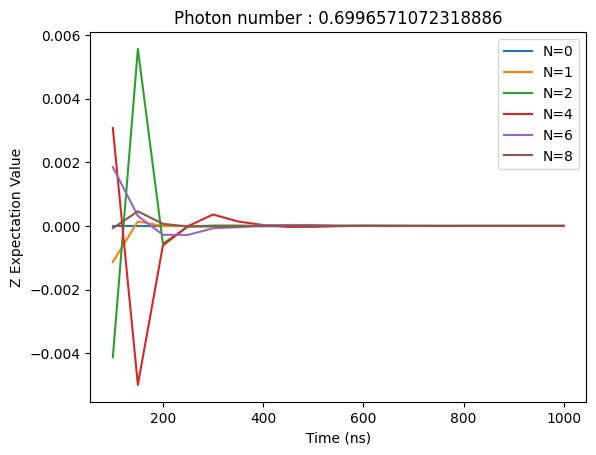

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[6][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[6]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.8

Text(0, 0.5, 'Decoherence')

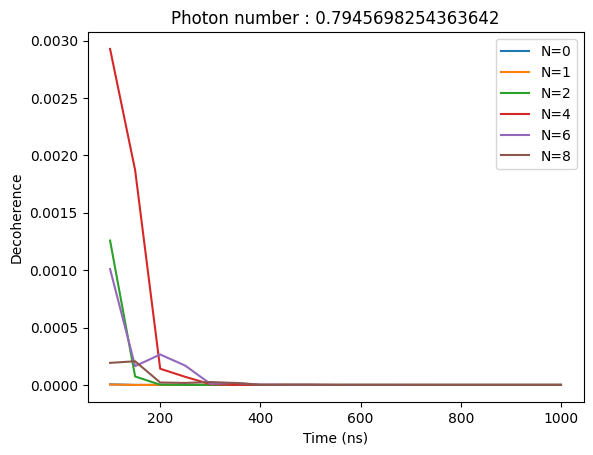

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[7][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[7]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

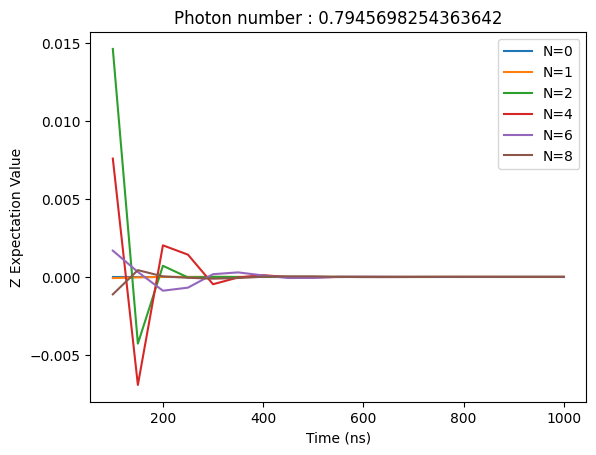

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[7][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[7]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.9

Text(0, 0.5, 'Decoherence')

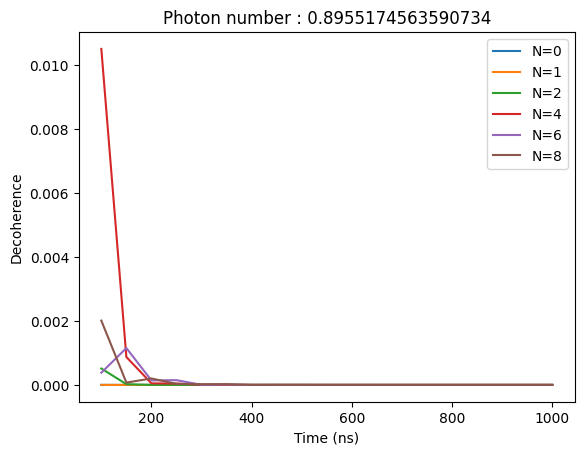

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[8][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[8]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

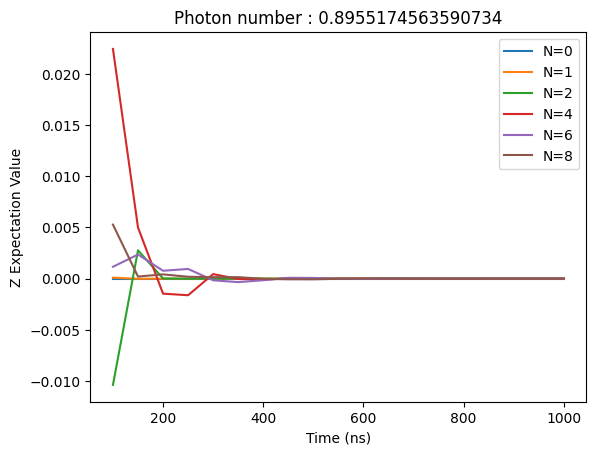

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[8][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[8]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=1.0

Text(0, 0.5, 'Decoherence')

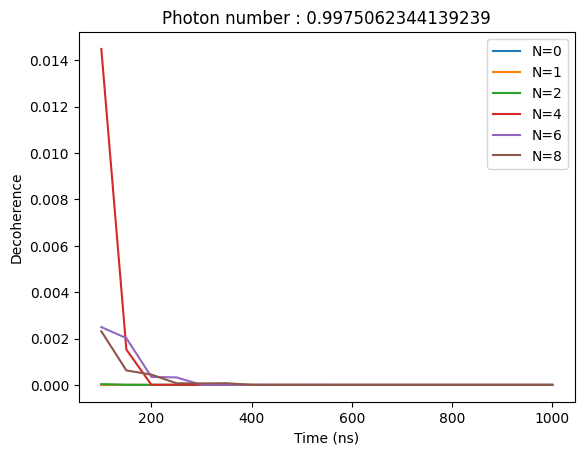

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[9][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

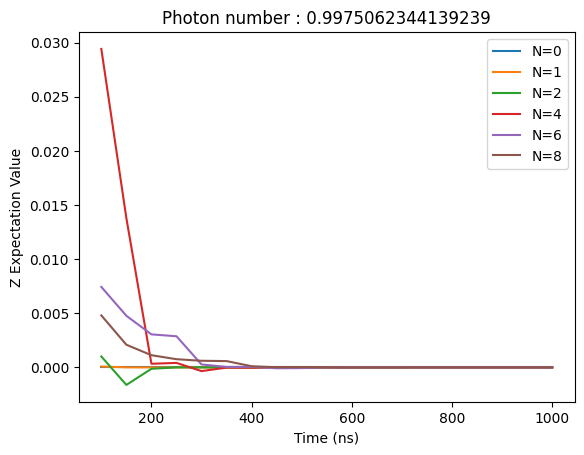

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[9][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

### 7) Off Diagonal Term Evolution B=0.05GHz with AC Stark Shift Detune

Resonator Dissipation Rate : $\kappa = 2π · 0.005$

Initial State $\frac{|0\rangle+|1\rangle}{\sqrt{2}}$

Result :


In [ ]:
A = [0.06875, 0.089375, 0.1115625, 0.125, 0.1425, 0.155, 0.1675, 0.18, 0.19, 0.20]
n_exp = [0.11809022049712097, 0.1995724726379507, 0.31096034099563086, 0.3903808927435874, 0.5073389924801157, 0.6002495775359179, 0.7009675738080133, 0.8094924783448024, 0.9019324465319741, 0.9993661624167768]
N_seq = [0,1,2,4,6,8]
tau_list = [50*(k+2) for k in range(19)]

z_tot = []
plus_tot = []

In [ ]:
N = 10

omega_r = 2 * np.pi * 7.0  # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0  # qubit frequency in units of GHz
omega_rd = 2 * np.pi * 7.0 # qubit frequency in units of GHz
g = 2 * np.pi * 0.1        # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.005  # external coupling rate of resonator in units of GHz

sz = sigmaz()
sx = sigmax()
sy = sigmay()
sp = basis(2,1)*basis(2,0).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
annihilate_composite = tensor(qeye(2), a)
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sz_composite, sp_composite]

psi_20 = tensor(basis(2,0), basis(N,0))
psi_2s = tensor((basis(2,0) + basis(2,1))/np.sqrt(2), basis(N,0))
psi_21 = tensor(basis(2,1), basis(N,0))

In [ ]:
# iterate for photon number n
for i in range(10):

  H0 = +kai*n_exp[i]*sz_composite + (omega_r-omega_rd)*number_composite + g*tensor(sz, a.dag()*a)
  H1 = 0.5*tensor(qeye(2), a + a.dag())
  H2 = 0.5*sx_composite

  z_n = []
  plus_n = []


  # iterate for pi-pulse time N
  for j in range(6):

    z = []
    plus = []


    # iterate for evolution time 50ns ~ 1000ns
    for k in range(19):

      # Simulation
      tlist = np.linspace(0, 50*(k+2), 500*(k+2))

      result = mesolve(
        [H0, [H1, Hrd_rotating_frame], [H2, Hqd_rotating_frame]],
        psi_2s,
        tlist,
        c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
        args = {'B': 2*np.pi*0.05, 'T_srt': -10, 'T_end': 50*(k+2)+10, 'N_seq': N_seq[j], 'Env': 0, 'Func': 0, 'A': 2*np.pi*A[i], 'T_srt': -400, 'T_end': 1400},
        e_ops = op_list,
        options = Options(nsteps = 5000*(k+2), atol = 1e-10, rtol = 1e-8)
      )

      z_sub = result.expect[0]
      plus_sub = result.expect[1]

      z.append(z_sub[-1])
      plus.append(np.abs(2*plus_sub[-1]))

    z_n.append(z)
    plus_n.append(plus)

  z_tot.append(z_n)
  plus_tot.append(plus_n)

  print(i)

0
1
2
3
4
5
6
7
8
9


/usr/local/lib/python3.10/dist-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


Text(0, 0.5, 'Decoherence')

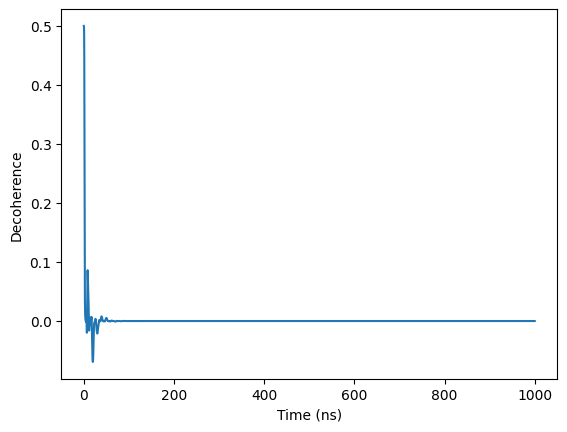

In [ ]:
tlist = np.linspace(0, 1000, 10000)
plt.plot(tlist, result.expect[1], label = 'n=1, N=8')
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Decoherence')

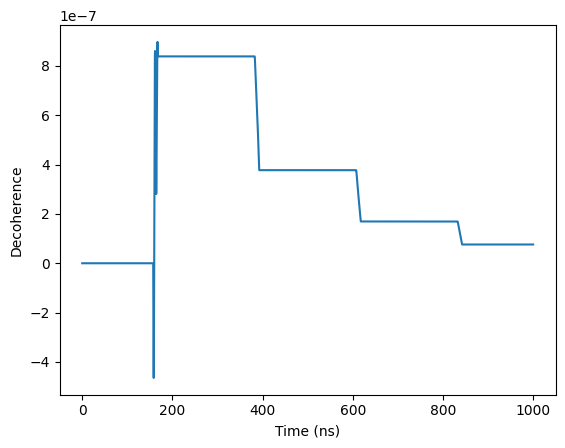

In [ ]:
tlist = np.linspace(0, 1000, 10000)
plt.plot(tlist, result.expect[0], label = 'n=1, N=8')
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

#### n=0.1

Text(0, 0.5, 'Decoherence')

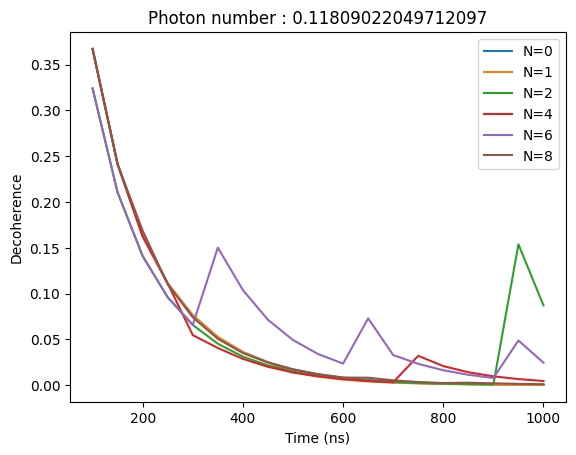

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[0][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[0]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

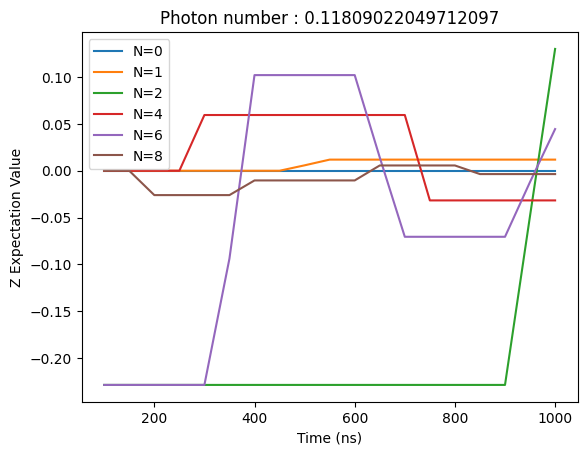

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[0][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[0]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.2

Text(0, 0.5, 'Decoherence')

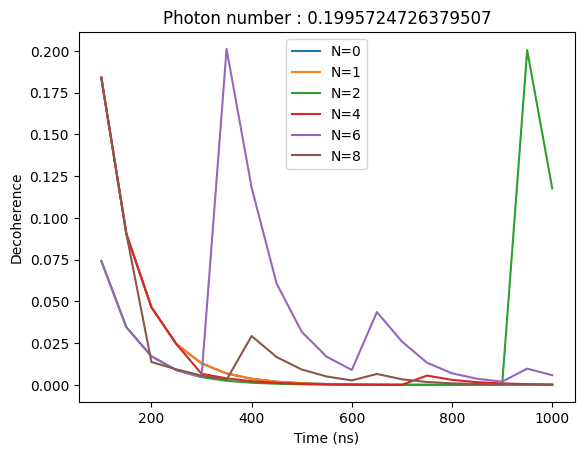

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[1][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[1]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

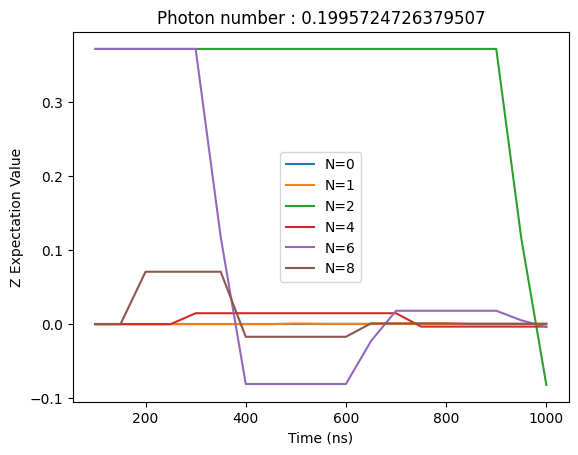

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[1][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[1]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.3

Text(0, 0.5, 'Decoherence')

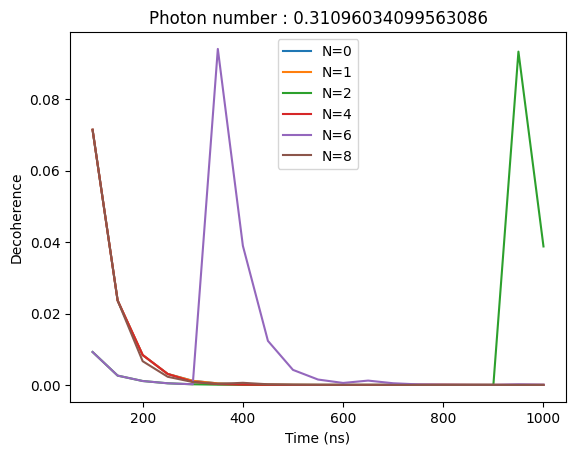

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[2][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[2]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

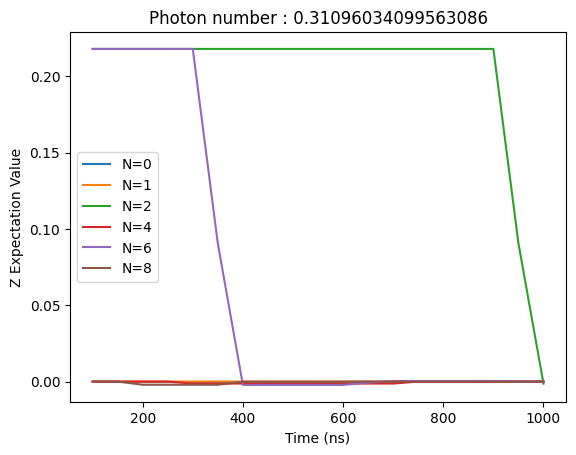

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[2][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[2]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.4

Text(0, 0.5, 'Decoherence')

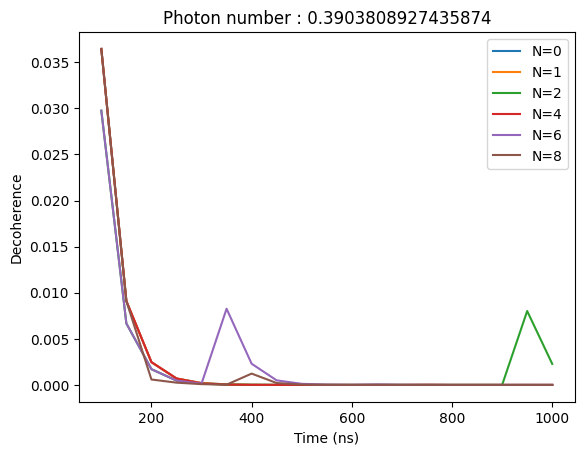

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[3][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[3]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

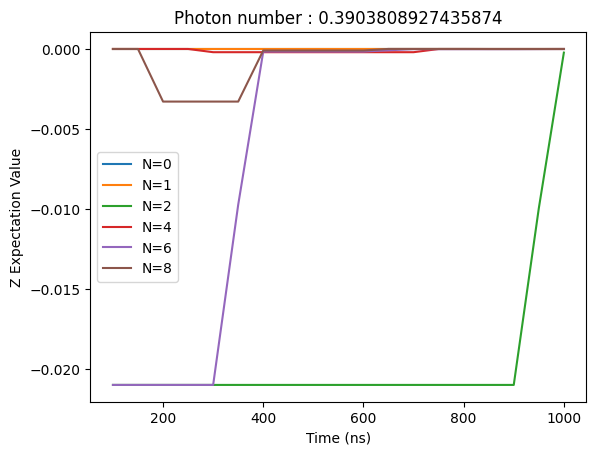

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[3][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[3]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.5

Text(0, 0.5, 'Decoherence')

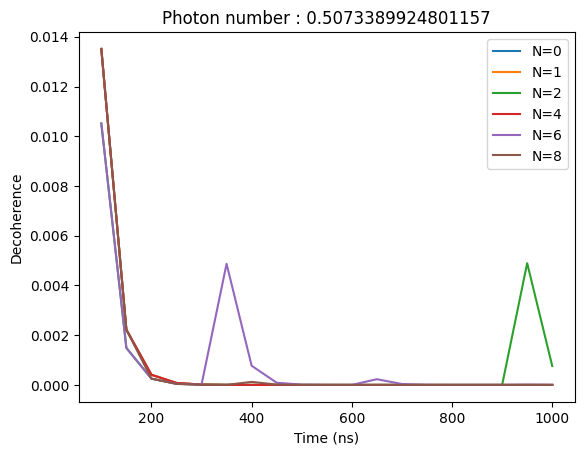

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[4][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[4]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

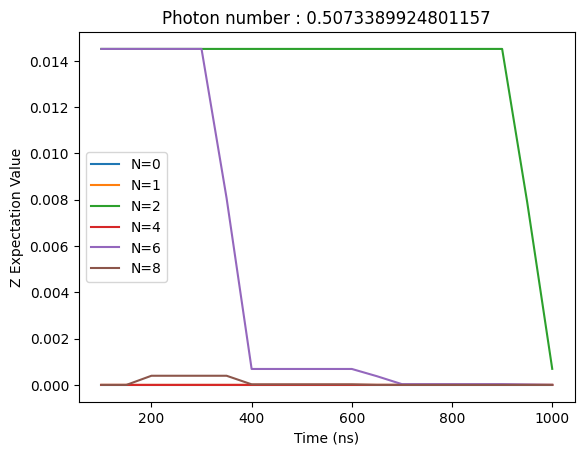

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[4][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[4]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.6

Text(0, 0.5, 'Decoherence')

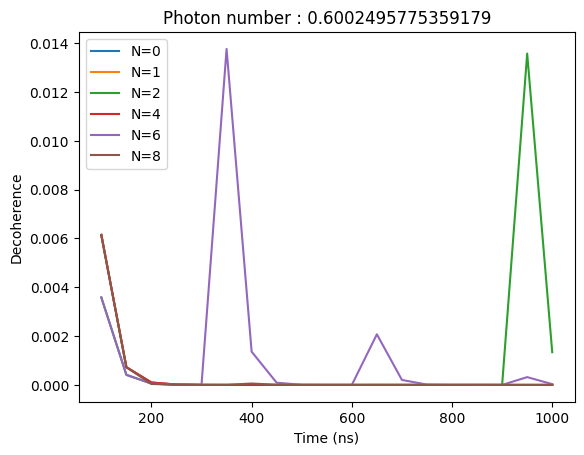

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[5][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[5]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

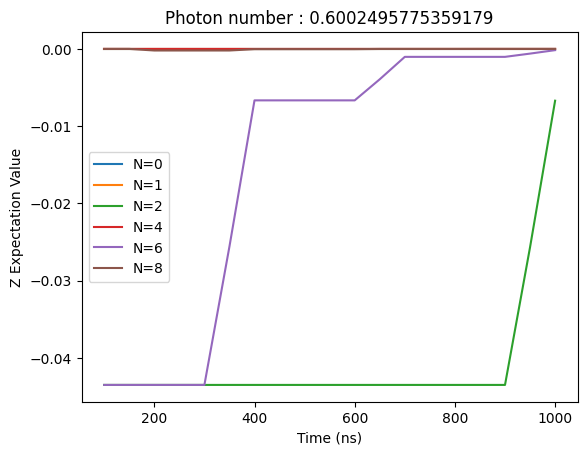

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[5][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[5]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.7

Text(0, 0.5, 'Decoherence')

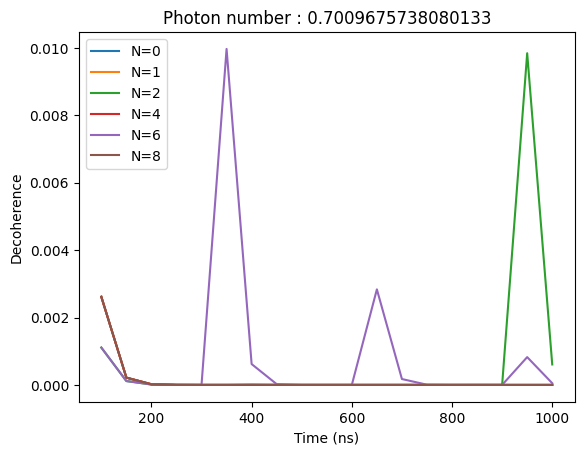

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[6][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[6]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

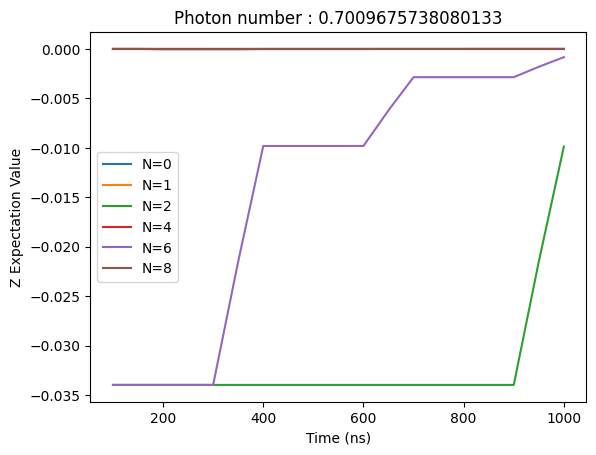

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[6][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[6]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.8

Text(0, 0.5, 'Decoherence')

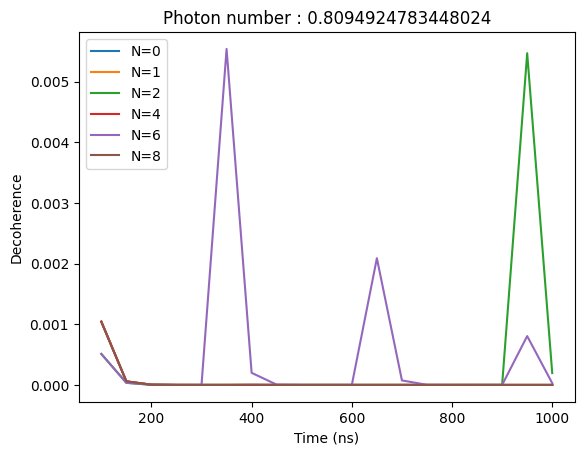

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[7][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[7]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

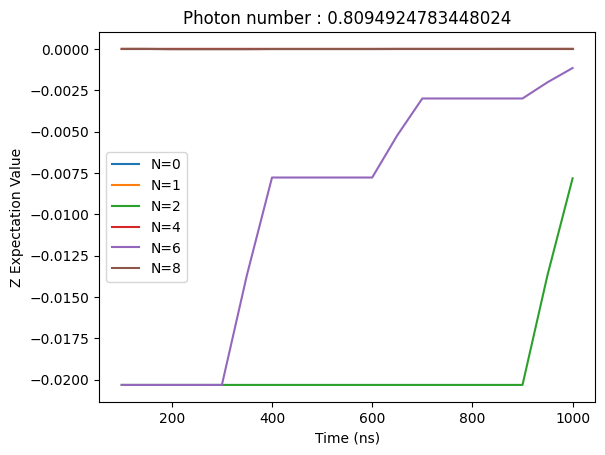

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[7][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[7]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=0.9

Text(0, 0.5, 'Decoherence')

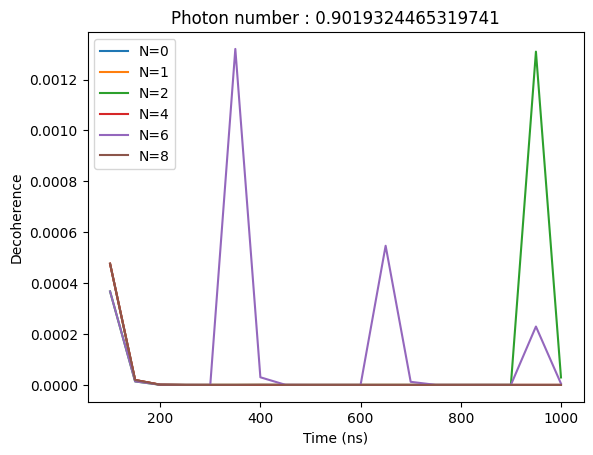

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[8][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[8]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

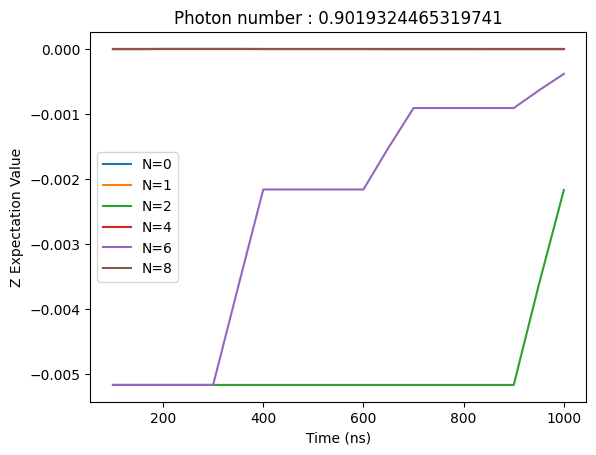

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[8][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[8]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

#### n=1.0

Text(0, 0.5, 'Decoherence')

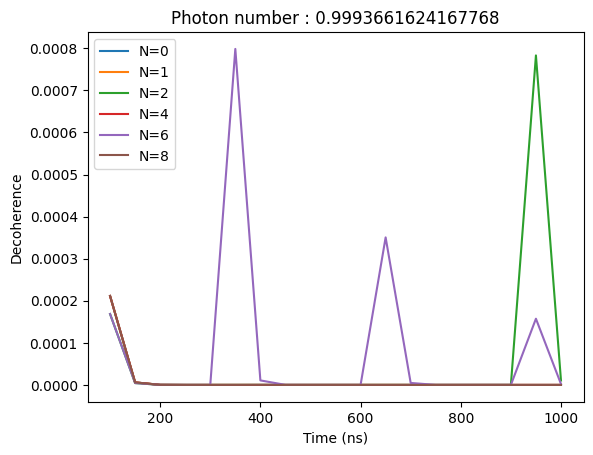

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, plus_tot[9][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Decoherence')

Text(0, 0.5, 'Z Expectation Value')

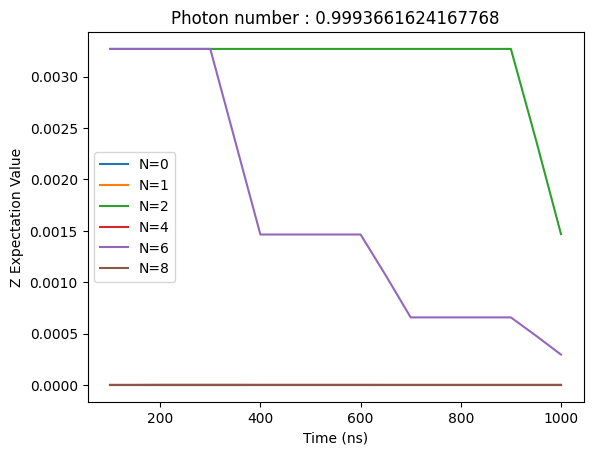

In [ ]:
# Plot Results

for j in range(6):

  plt.plot(tau_list, z_tot[9][j], label = 'N={0}'.format(N_seq[j]))
  plt.legend(loc = 0)

plt.title('Photon number : {0}'.format(n_exp[9]))
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')